<a href="https://colab.research.google.com/github/Harsas/Harpia/blob/main/Harp_IA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error


In [ ]:
import pandas as pd
import numpy as np

# Criar datas mensais ao longo de 5 anos
dates = pd.date_range(start="2018-01-01", end="2022-12-31", freq="M")

# Temperaturas fictícias (suponhamos um aumento gradual)
temps = np.linspace(14, 16, len(dates)) + np.random.normal(0, 0.5, len(dates))

temperature_data = pd.DataFrame({
    "Date": dates,
    "Global_Temperature": temps
})


In [ ]:
years = np.arange(2018, 2023)
# Supondo uma redução gradual em km^3
ice_melt = np.linspace(100, 90, len(years)) + np.random.normal(0, 1, len(years))

ice_melt_data = pd.DataFrame({
    "Year": years,
    "Ice_Melt_km3": ice_melt
})


In [ ]:
regions = ["North America", "Europe", "Asia"]
# Supondo emissões em milhões de toneladas
emissions = np.random.randint(5000, 7000, (len(years), len(regions)))

co2_emissions_data = pd.DataFrame({
    "Year": years,
    "North America": emissions[:, 0],
    "Europe": emissions[:, 1],
    "Asia": emissions[:, 2]
})


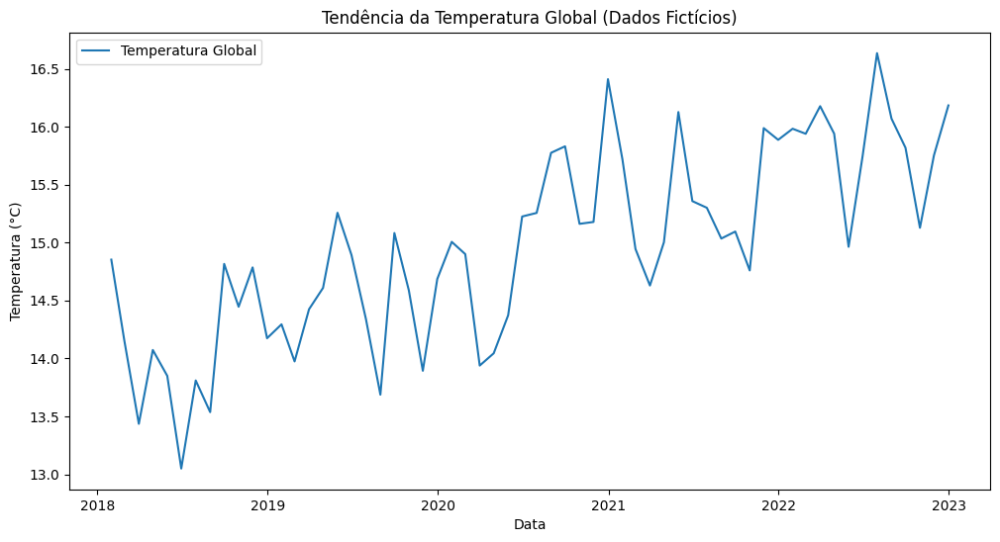

In [ ]:
# Visualizando a tendência de temperatura ao longo do tempo
plt.figure(figsize=(12, 6))
plt.plot(temperature_data['Date'], temperature_data['Global_Temperature'], label="Temperatura Global")
plt.title('Tendência da Temperatura Global (Dados Fictícios)')
plt.xlabel('Data')
plt.ylabel('Temperatura (°C)')
plt.legend()
plt.show()


In [ ]:
# Preparar dados
X = np.array((temperature_data.index)).reshape(-1, 1)
y = temperature_data['Global_Temperature']

# Dividir dados em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Treinar modelo
model = LinearRegression()
model.fit(X_train, y_train)

# Fazer previsões
y_pred = model.predict(X_test)

# Avaliar o modelo
mse = mean_squared_error(y_test, y_pred)
print(f"Erro quadrático médio: {mse}")


Erro quadrático médio: 0.40372772609119006


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Criando dados fictícios
date_rng = pd.date_range(start='2000-01-01', end='2022-01-01', freq='A')  # Anos de 2000 a 2022

# Dados fictícios de CO2
co2_data = pd.DataFrame(date_rng, columns=['Date'])
co2_data['CO2_Emissions'] = np.linspace(3200, 4200, len(date_rng)) + np.random.normal(0, 50, len(date_rng))

# Dados fictícios de temperatura
temperature_data = pd.DataFrame(date_rng, columns=['Date'])
temperature_data['Global_Temperature'] = np.linspace(14, 15, len(date_rng)) + np.random.normal(0, 0.2, len(date_rng))

# Dados fictícios de derretimento de geleiras
glacier_data = pd.DataFrame(date_rng, columns=['Date'])
glacier_data['Glacier_Melt'] = np.linspace(500, 400, len(date_rng)) + np.random.normal(0, 5, len(date_rng))

# Agora você pode seguir com os códigos de plotagem que forneci anteriormente.


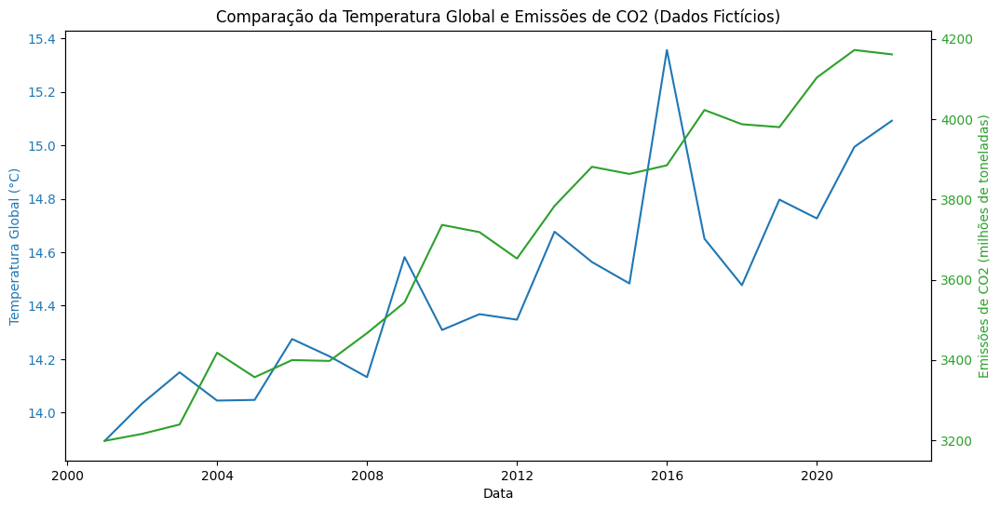

In [ ]:
fig, ax1 = plt.subplots(figsize=(12, 6))

color = 'tab:blue'
ax1.set_xlabel('Data')
ax1.set_ylabel('Temperatura Global (°C)', color=color)
ax1.plot(temperature_data['Date'], temperature_data['Global_Temperature'], label="Temperatura Global", color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:green'
ax2.set_ylabel('Emissões de CO2 (milhões de toneladas)', color=color)
ax2.plot(co2_data['Date'], co2_data['CO2_Emissions'], label="Emissões de CO2", color=color)
ax2.tick_params(axis='y', labelcolor=color)

plt.title('Comparação da Temperatura Global e Emissões de CO2 (Dados Fictícios)')
plt.show()


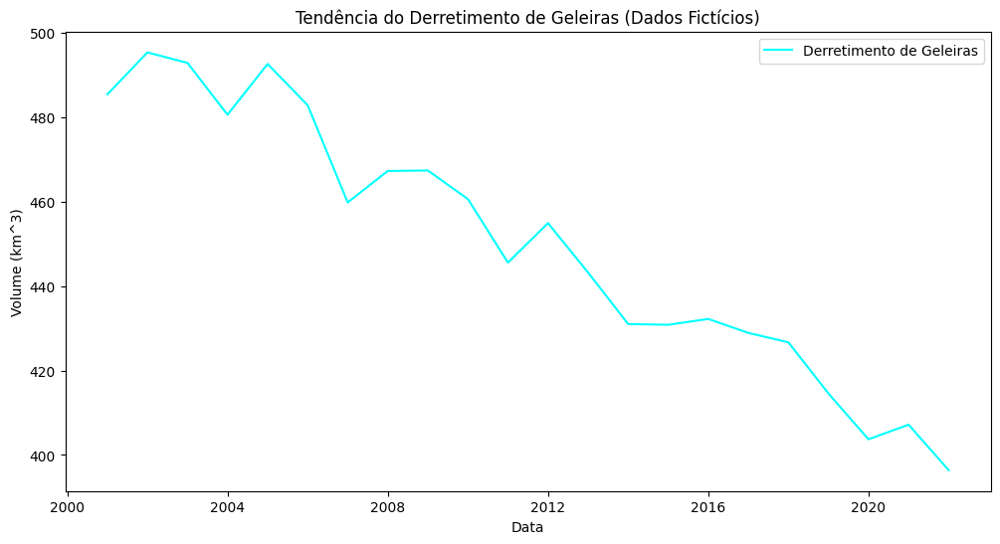

In [ ]:
# Plotar o derretimento das geleiras ao longo do tempo
plt.figure(figsize=(12, 6))
plt.plot(glacier_data['Date'], glacier_data['Glacier_Melt'], label="Derretimento de Geleiras", color="cyan")
plt.title('Tendência do Derretimento de Geleiras (Dados Fictícios)')
plt.xlabel('Data')
plt.ylabel('Volume (km^3)')
plt.legend()
plt.show()


In [ ]:
# Fazendo merge dos dataframes
merged_data = pd.merge(temperature_data, co2_data, on='Date', how='inner')
correlation = merged_data['Global_Temperature'].corr(merged_data['CO2_Emissions'])

print(f"Correlação entre Temperatura Global e Emissões de CO2: {correlation:.2f}")


Correlação entre Temperatura Global e Emissões de CO2: 0.84


In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from datetime import timedelta

# Preparando os dados para a modelagem
co2_data['Days_Since_Start'] = (co2_data['Date'] - co2_data['Date'].min()).dt.days
X = co2_data[['Days_Since_Start']]
y = co2_data['CO2_Emissions']

# Dividindo os dados em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Criando e treinando o modelo
co2_model = LinearRegression()
co2_model.fit(X_train, y_train)

# Prevendo as emissões de CO2 para os próximos 10 anos (3652 dias)
future_days = np.array(range(X['Days_Since_Start'].max() + 1, X['Days_Since_Start'].max() + 3653)).reshape(-1, 1)
future_co2 = co2_model.predict(future_days)

# Convertendo 'future_days' de volta para formato de data
future_dates = [co2_data['Date'].min() + timedelta(days=int(day)) for day in future_days]


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [ ]:
temperature_data['Days_Since_Start'] = (temperature_data['Date'] - temperature_data['Date'].min()).dt.days
X_temp = temperature_data[['Days_Since_Start']]
y_temp = temperature_data['Global_Temperature']

X_train_temp, X_test_temp, y_train_temp, y_test_temp = train_test_split(X_temp, y_temp, test_size=0.2, random_state=42)

temperature_model = LinearRegression()
temperature_model.fit(X_train_temp, y_train_temp)

future_temperature = temperature_model.predict(future_days)


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


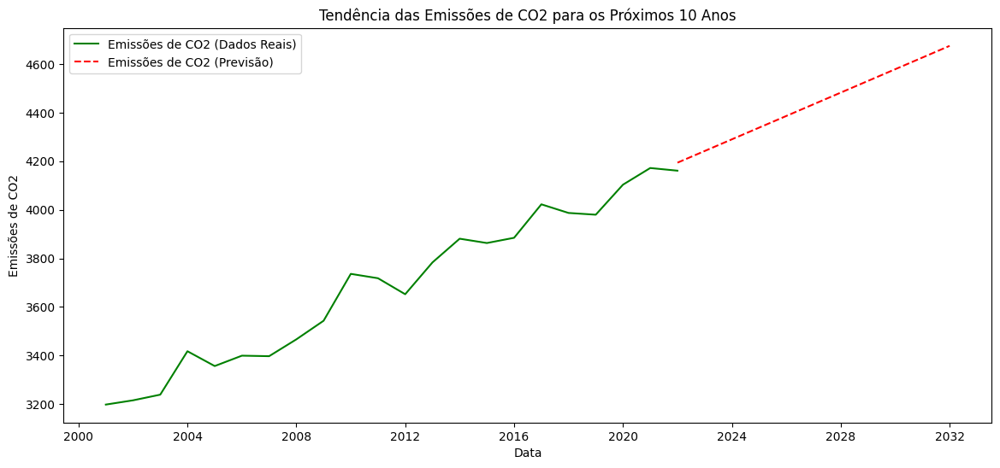

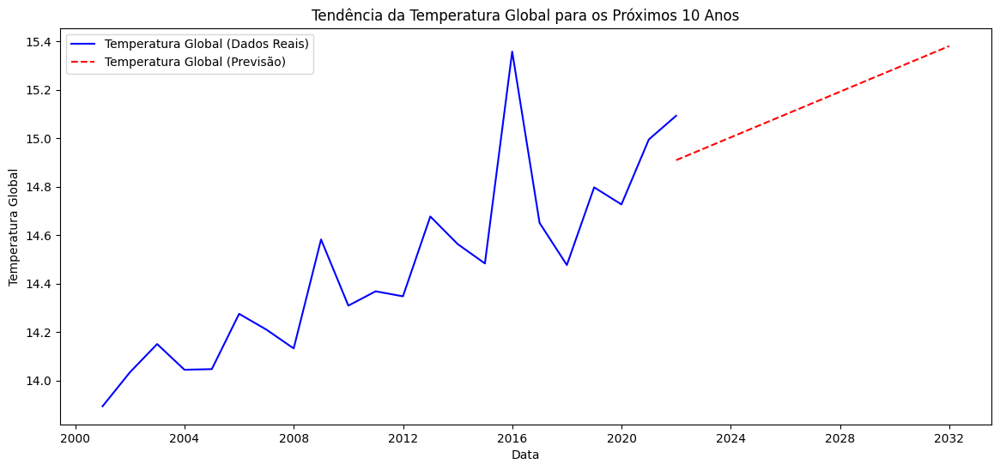

In [ ]:
plt.figure(figsize=(14, 6))
plt.plot(co2_data['Date'], co2_data['CO2_Emissions'], label="Emissões de CO2 (Dados Reais)", color="green")
plt.plot(future_dates, future_co2, label="Emissões de CO2 (Previsão)", linestyle='--', color="red")
plt.title('Tendência das Emissões de CO2 para os Próximos 10 Anos')
plt.xlabel('Data')
plt.ylabel('Emissões de CO2')
plt.legend()
plt.show()

plt.figure(figsize=(14, 6))
plt.plot(temperature_data['Date'], temperature_data['Global_Temperature'], label="Temperatura Global (Dados Reais)", color="blue")
plt.plot(future_dates, future_temperature, label="Temperatura Global (Previsão)", linestyle='--', color="red")
plt.title('Tendência da Temperatura Global para os Próximos 10 Anos')
plt.xlabel('Data')
plt.ylabel('Temperatura Global')
plt.legend()
plt.show()


In [ ]:
# Define as cores associadas aos níveis com cores vibrantes
colors = {
    "Baixo": "green",
    "Médio": "orange",
    "Alto": "red",
    "Eminente": "purple"
}

# ...

# Criando o mapa centrado na Antártica
mapa = folium.Map(location=[-75, 0], zoom_start=3, tiles='Stamen Terrain')

# Lista para armazenar pontos de calor
heat_data = []

# Criar grupos de camadas para cada tipo de desastre
disaster_layers = {disaster: folium.FeatureGroup(name=disaster) for disaster in disasters}

for _ in range(100):
    coords = [-80 + random.uniform(-5, 5), random.uniform(-20, 20)]
    heat_data.append(coords)

    disaster = random.choice(disasters)
    level = random.choice(levels)
    min_probability, max_probability = probabilities[level]  # Obtenha as probabilidades com base no nível de gravidade
    probability = random.randint(min_probability, max_probability)  # Gere uma probabilidade dentro da faixa
    increase_chance = random.randint(1, 100)
    future_prediction = {
        "Tempestade": "Aumento na frequência e intensidade das tempestades.",
        "Fissura no Gelo": "Expansão rápida da fissura e possível desprendimento de iceberg.",
        "Deslizamento": "Perda adicional de gelo e elevação do nível do mar.",
        "Avalanche de Neve": "Maior acúmulo de neve e risco aumentado de avalanches."
    }

    icon_color = colors[level]

    info = f"""
    <div style="width:250px;">
        <div class="card">
            <div class="card-header" style="background-color: {icon_color}; color: white;">
                <strong>{disaster}</strong>
            </div>
            <ul class="list-group list-group-flush">
                <li class="list-group-item">Nível de Gravidade: <strong>{level}</strong></li>
                <li class="list-group-item">Probabilidade de Ocorrência Atual: <strong>{probability}%</strong></li>
                <li class="list-group-item">Previsão para o Futuro: {future_prediction[disaster]}</li>
                <li class="list-group-item">Chance de Aumento no Futuro: <strong>{increase_chance}%</strong></li>
            </ul>
        </div>
    </div>
    """

    marker = folium.Marker(
        location=coords,
        popup=folium.Popup(info, max_width=265),
        icon=folium.Icon(icon=icons[disaster], color=icon_color, prefix="fa")
    )

    # Adiciona o marcador ao grupo de camadas apropriado
    marker.add_to(disaster_layers[disaster])

# Adiciona cada grupo de camadas ao mapa
for disaster, layer in disaster_layers.items():
    layer.add_to(mapa)

# Adiciona o mapa de calor como uma camada separada
heat_layer = HeatMap(heat_data, name="Mapa de Calor")
heat_layer.add_to(mapa)

# Adiciona o controle de camadas ao mapa, permitindo que o usuário selecione os desastres que deseja visualizar
folium.LayerControl().add_to(mapa)

# Salva o mapa em um arquivo HTML
mapa.save("antarctica_disasters_vibrant_colors.html")

# Exibe o mapa
mapa


In [ ]:
# Define as cores associadas aos níveis com cores vibrantes
colors = {
    "Baixo": "green",
    "Médio": "orange",
    "Alto": "red",
    "Eminente": "purple"
}

# ...

# Criando o mapa centrado na Antártica
mapa = folium.Map(location=[-75, 0], zoom_start=3, tiles='Stamen Terrain')

# Lista para armazenar pontos de calor
heat_data = []

# Criar grupos de camadas para cada tipo de desastre
disaster_layers = {disaster: folium.FeatureGroup(name=disaster) for disaster in disasters}

for _ in range(20):
    coords = [-80 + random.uniform(-5, 5), random.uniform(-20, 20)]
    heat_data.append(coords)

    disaster = random.choice(disasters)
    level = random.choice(levels)
    min_probability, max_probability = probabilities[level]  # Obtenha as probabilidades com base no nível de gravidade
    probability = random.randint(min_probability, max_probability)  # Gere uma probabilidade dentro da faixa
    increase_chance = random.randint(1, 100)
    future_prediction = {
        "Tempestade": "Aumento na frequência e intensidade das tempestades.",
        "Fissura no Gelo": "Expansão rápida da fissura e possível desprendimento de iceberg.",
        "Deslizamento": "Perda adicional de gelo e elevação do nível do mar.",
        "Avalanche de Neve": "Maior acúmulo de neve e risco aumentado de avalanches."
    }

    icon_color = colors[level]

    info = f"""
    <div style="width:250px;">
        <div class="card">
            <div class="card-header" style="background-color: {icon_color}; color: white;">
                <strong>{disaster}</strong>
            </div>
            <ul class="list-group list-group-flush">
                <li class="list-group-item">Nível de Gravidade: <strong>{level}</strong></li>
                <li class="list-group-item">Probabilidade de Ocorrência Atual: <strong>{probability}%</strong></li>
                <li class="list-group-item">Previsão para o Futuro: {future_prediction[disaster]}</li>
                <li class="list-group-item">Chance de Aumento no Futuro: <strong>{increase_chance}%</strong></li>
            </ul>
        </div>
    </div>
    """

    marker = folium.Marker(
        location=coords,
        popup=folium.Popup(info, max_width=265),
        icon=folium.Icon(icon=icons[disaster], color=icon_color, prefix="fa")
    )

    # Adiciona o marcador ao grupo de camadas apropriado
    marker.add_to(disaster_layers[disaster])

# Adiciona cada grupo de camadas ao mapa
for disaster, layer in disaster_layers.items():
    layer.add_to(mapa)

# Adiciona o mapa de calor como uma camada separada
heat_layer = HeatMap(heat_data, name="Mapa de Calor")
heat_layer.add_to(mapa)

# Adiciona o controle de camadas ao mapa, permitindo que o usuário selecione os desastres que deseja visualizar
folium.LayerControl().add_to(mapa)

# Salva o mapa em um arquivo HTML
mapa.save("antarctica_disasters_vibrant_colors.html")

# Exibe o mapa
mapa

In [ ]:
!pip install folium pandas openpyxl


In [ ]:
import folium
import random
import pandas as pd
import base64
from io import BytesIO
from folium.plugins import HeatMap

# Definições iniciais
colors = {
    "Baixo": "green",
    "Médio": "orange",
    "Alto": "red",
    "Eminente": "purple"
}

disasters = ["Tempestade", "Fissura no Gelo", "Deslizamento", "Avalanche de Neve"]
levels = ["Baixo", "Médio", "Alto", "Eminente"]
probabilities = {
    "Baixo": (10, 30),
    "Médio": (31, 60),
    "Alto": (61, 90),
    "Eminente": (91, 100)
}

icons = {
    "Tempestade": "cloud",
    "Fissura no Gelo": "tint",
    "Deslizamento": "arrow-down",
    "Avalanche de Neve": "mountain"
}

# Função para gerar o link do Excel em base64:
def generate_excel_link(disaster):
    data = {
        'Data': ['2023-10-01', '2023-10-02', '2023-10-03'],
        'Evento': [disaster] * 3,
        'Impacto': ['Baixo', 'Médio', 'Alto']
    }
    df = pd.DataFrame(data)

    # Armazenamos o arquivo em um buffer
    buffer = BytesIO()
    writer = pd.ExcelWriter(buffer, engine='openpyxl')
    df.to_excel(writer, sheet_name="Dados", index=False)
    writer.save()

    # Codificamos o buffer em base64 para criar um link de download direto
    excel_base64 = base64.b64encode(buffer.getvalue()).decode('utf-8')
    mime_type = "application/vnd.openxmlformats-officedocument.spreadsheetml.sheet"
    href = f"data:{mime_type};base64,{excel_base64}"
    return href

# Criação do mapa
mapa = folium.Map(location=[-75, 0], zoom_start=3, tiles='Stamen Terrain')
heat_data = []

for _ in range(20):
    coords = [-80 + random.uniform(-5, 5), random.uniform(-20, 20)]
    heat_data.append(coords)

    disaster = random.choice(disasters)
    level = random.choice(levels)
    min_probability, max_probability = probabilities[level]
    probability = random.randint(min_probability, max_probability)
    increase_chance = random.randint(1, 100)

    icon_color = colors[level]
    href = generate_excel_link(disaster)

    info = f"""
    <div style="width:250px;">
        <div class="card">
            <div class="card-header" style="background-color: {icon_color}; color: white;">
                <strong>{disaster}</strong>
            </div>
            <ul class="list-group list-group-flush">
                <li class="list-group-item">Nível de Gravidade: <strong>{level}</strong></li>
                <li class="list-group-item">Probabilidade de Ocorrência Atual: <strong>{probability}%</strong></li>
                <li class="list-group-item">Chance de Aumento no Futuro: <strong>{increase_chance}%</strong></li>
            </ul>
            <div class="card-footer">
                <a href="{href}" download="{disaster.replace(' ', '_')}.xlsx" class="btn btn-primary">Baixar Excel</a>
            </div>
        </div>
    </div>
    """

    marker = folium.Marker(
        location=coords,
        popup=folium.Popup(info, max_width=265),
        icon=folium.Icon(icon=icons[disaster], color=icon_color, prefix="fa")
    )
    marker.add_to(mapa)

heat_layer = HeatMap(heat_data, name="Mapa de Calor")
heat_layer.add_to(mapa)

mapa.save("antarctica_disasters_v2.html")
mapa


<ipython-input-80-18dc2735ff7c>:45: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-80-18dc2735ff7c>:45: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-80-18dc2735ff7c>:45: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-80-18dc2735ff7c>:45: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-80-18dc2735ff7c>:45: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-80-18dc2735ff7c>:45: FutureWarning: save is not part of the public API, usage can give unexpected re

In [ ]:
import folium
import random
import pandas as pd
import base64
from io import BytesIO
from folium.plugins import HeatMap

# Definições iniciais
colors = {
    "Baixo": "green",
    "Médio": "orange",
    "Alto": "red",
    "Eminente": "purple"
}

disasters = ["Tempestade", "Fissura no Gelo", "Deslizamento", "Avalanche de Neve"]
levels = ["Baixo", "Médio", "Alto", "Eminente"]
probabilities = {
    "Baixo": (10, 30),
    "Médio": (31, 60),
    "Alto": (61, 90),
    "Eminente": (91, 100)
}

icons = {
    "Tempestade": "cloud",
    "Fissura no Gelo": "tint",
    "Deslizamento": "arrow-down",
    "Avalanche de Neve": "mountain"
}

# Função para gerar o link do Excel em base64:
def generate_excel_link(disaster):
    data = {
        'Data': ['2023-10-01', '2023-10-02', '2023-10-03'],
        'Evento': [disaster] * 3,
        'Impacto': ['Baixo', 'Médio', 'Alto']
    }
    df = pd.DataFrame(data)

    # Armazenamos o arquivo em um buffer
    buffer = BytesIO()
    writer = pd.ExcelWriter(buffer, engine='openpyxl')
    df.to_excel(writer, sheet_name="Dados", index=False)
    writer.save()

    # Codificamos o buffer em base64 para criar um link de download direto
    excel_base64 = base64.b64encode(buffer.getvalue()).decode('utf-8')
    mime_type = "application/vnd.openxmlformats-officedocument.spreadsheetml.sheet"
    href = f"data:{mime_type};base64,{excel_base64}"
    return href

# Criação do mapa
mapa = folium.Map(location=[-75, 0], zoom_start=3, tiles='Stamen Terrain')
heat_data = []

for _ in range(20):
    coords = [-80 + random.uniform(-5, 5), random.uniform(-20, 20)]
    heat_data.append(coords)

    disaster = random.choice(disasters)
    level = random.choice(levels)
    min_probability, max_probability = probabilities[level]
    probability = random.randint(min_probability, max_probability)
    increase_chance = random.randint(1, 100)

    icon_color = colors[level]
    href = generate_excel_link(disaster)

    info = f"""
<div style="width:250px;">
    <div class="card">
        <div class="card-header" style="background-color: {icon_color}; color: white;">
            <strong>{disaster}</strong>
        </div>
        <ul class="list-group list-group-flush">
            <li class="list-group-item">Nível de Gravidade: <strong>{level}</strong></li>
            <li class="list-group-item">Probabilidade de Ocorrência Atual: <strong>{probability}%</strong></li>
            <li class="list-group-item">Chance de Aumento no Futuro: <strong>{increase_chance}%</strong></li>
            <li class="list-group-item">Previsão: {"Aumento na frequência e intensidade das tempestades." if disaster == "Tempestade" else "Expansão rápida da fissura e possível desprendimento de iceberg." if disaster == "Fissura no Gelo" else "Perda adicional de gelo e elevação do nível do mar." if disaster == "Deslizamento" else "Maior acúmulo de neve e risco aumentado de avalanches."}</li>
        </ul>
        <div class="card-footer">
            <a href="{href}" download="{disaster.replace(' ', '_')}.xlsx" class="btn btn-primary">Baixar Excel</a>
        </div>
    </div>
</div>
"""
    marker = folium.Marker(
        location=coords,
        popup=folium.Popup(info, max_width=265),
        icon=folium.Icon(icon=icons[disaster], color=icon_color, prefix="fa")
    )
    marker.add_to(mapa)

heat_layer = HeatMap(heat_data, name="Mapa de Calor")
heat_layer.add_to(mapa)

mapa.save("antarctica_disasters_v2.html")
mapa


<ipython-input-95-8671bd30d067>:45: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-95-8671bd30d067>:45: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-95-8671bd30d067>:45: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-95-8671bd30d067>:45: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-95-8671bd30d067>:45: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-95-8671bd30d067>:45: FutureWarning: save is not part of the public API, usage can give unexpected re

In [ ]:
import folium
import random
import pandas as pd
import base64
from io import BytesIO
from folium.plugins import HeatMap

# Definições iniciais
colors = {
    "Baixo": "green",
    "Médio": "orange",
    "Alto": "red",
    "Eminente": "purple"
}

disasters = ["Tempestade", "Fissura no Gelo", "Deslizamento", "Avalanche de Neve"]
levels = ["Baixo", "Médio", "Alto", "Eminente"]

# Criação do DataFrame com dados fictícios
data = {
    'Evento': disasters,
    'Nível de Gravidade': random.choices(levels, k=len(disasters)),
    'Probabilidade (%)': [random.randint(1, 100) for _ in disasters],
    'Previsão': [
        "Aumento na frequência e intensidade das tempestades.",
        "Expansão rápida da fissura e possível desprendimento de iceberg.",
        "Perda adicional de gelo e elevação do nível do mar.",
        "Maior acúmulo de neve e risco aumentado de avalanches."
    ]
}
df = pd.DataFrame(data)

# Função para gerar o link do Excel em base64:
def generate_excel_link(disaster):
    df_disaster = df[df['Evento'] == disaster]
    buffer = BytesIO()
    df_disaster.to_excel(buffer, index=False)
    excel_base64 = base64.b64encode(buffer.getvalue()).decode('utf-8')
    mime_type = "application/vnd.openxmlformats-officedocument.spreadsheetml.sheet"
    href = f"data:{mime_type};base64,{excel_base64}"
    return href

# Criação do mapa
mapa = folium.Map(location=[-75, 0], zoom_start=3, tiles='Stamen Terrain')
heat_data = []

for _ in range(20):
    coords = [-80 + random.uniform(-5, 5), random.uniform(-20, 20)]
    heat_data.append(coords)

    disaster = random.choice(disasters)
    level = random.choice(levels)
    min_probability, max_probability = 1, 100  # Valores fictícios para a probabilidade
    increase_chance = random.randint(1, 100)

    icon_color = colors[level]

    # Obtenha os dados relevantes do DataFrame
    data_row = df[df['Evento'] == disaster].iloc[0]
    probability = random.randint(data_row['Probabilidade (%)'], 100)  # Use a probabilidade do DataFrame
    future_prediction = data_row['Previsão']

    # Gere o link para o Excel
    excel_link = generate_excel_link(disaster)

    info = f"""
<div style="width:250px;">
    <div class="card">
        <div class="card-header" style="background-color: {icon_color}; color: white;">
            <strong>{disaster}</strong>
        </div>
        <ul class="list-group list-group-flush">
            <li class="list-group-item">Nível de Gravidade: <strong>{level}</strong></li>
            <li class="list-group-item">Probabilidade de Ocorrência Atual: <strong>{probability}%</strong></li>
            <li class="list-group-item">Chance de Aumento no Futuro: <strong>{increase_chance}%</strong></li>
            <li class="list-group-item">Previsão: {future_prediction}</li>
        </ul>
        <div class="card-footer">
            <a href="{excel_link}" download="{disaster.replace(' ', '_')}.xlsx" class="btn btn-primary">Baixar Excel</a>
        </div>
    </div>
</div>
"""
    marker = folium.Marker(
        location=coords,
        popup=folium.Popup(info, max_width=265),
        icon=folium.Icon(color=icon_color)
    )
    marker.add_to(mapa)

heat_layer = HeatMap(heat_data, name="Mapa de Calor")
heat_layer.add_to(mapa)

mapa.save("antarctica_disasters_v4.html")
mapa



In [ ]:
!pip install matplotlib


In [ ]:
import folium
import random
import pandas as pd
import base64
import xlsxwriter
from io import BytesIO
import matplotlib.pyplot as plt

# Definições iniciais
colors = {
    "Baixo": "green",
    "Médio": "orange",
    "Alto": "red",
    "Eminente": "purple"
}

disasters = ["Tempestade", "Fissura no Gelo", "Deslizamento", "Avalanche de Neve"]
levels = ["Baixo", "Médio", "Alto", "Eminente"]
probabilities = {
    "Baixo": (10, 30),
    "Médio": (31, 60),
    "Alto": (61, 90),
    "Eminente": (91, 100)
}

icons = {
    "Tempestade": "cloud",
    "Fissura no Gelo": "tint",
    "Deslizamento": "arrow-down",
    "Avalanche de Neve": "mountain"
}

# Função para gerar o link do Excel em base64 com gráficos
def generate_excel_link(disaster):
    # Criar DataFrame com dados fictícios
    data = {
        'Data': ['2023-10-01', '2023-10-02', '2023-10-03'],
        'Evento': [disaster] * 3,
        'Impacto': ['Baixo', 'Médio', 'Alto'],
        'Aumento': [random.randint(0, 20), random.randint(0, 20), random.randint(0, 20)],
        'Previsão': [random.randint(0, 20), random.randint(0, 20), random.randint(0, 20)]
    }
    df = pd.DataFrame(data)

    # Criar arquivo Excel com gráficos
    output = BytesIO()
    writer = pd.ExcelWriter(output, engine='xlsxwriter')
    df.to_excel(writer, sheet_name='Dados', index=False)
    workbook = writer.book
    worksheet = writer.sheets['Dados']

    # Configurar gráfico de Aumento
    chart = workbook.add_chart({'type': 'line'})
    chart.add_series({'values': ['Dados', 1, 4, 3, 4], 'name': ['Dados', 0, 4]})
    chart.set_title({'name': 'Aumento'})
    worksheet.insert_chart('F2', chart)

    # Configurar gráfico de Previsão
    chart2 = workbook.add_chart({'type': 'line'})
    chart2.add_series({'values': ['Dados', 1, 5, 3, 5], 'name': ['Dados', 0, 5]})
    chart2.set_title({'name': 'Previsão'})
    worksheet.insert_chart('F18', chart2)

    writer.save()
    excel_data = output.getvalue()

    # Codificar o arquivo Excel em base64 para criar um link de download direto
    excel_base64 = base64.b64encode(excel_data).decode('utf-8')
    href = f"data:application/vnd.openxmlformats-officedocument.spreadsheetml.sheet;base64,{excel_base64}"
    return href

# Criação do mapa
mapa = folium.Map(location=[-75, 0], zoom_start=3, tiles='Stamen Terrain')
heat_data = []

for _ in range(20):
    coords = [-80 + random.uniform(-5, 5), random.uniform(-20, 20)]
    heat_data.append(coords)

    disaster = random.choice(disasters)
    level = random.choice(levels)
    min_probability, max_probability = probabilities[level]
    probability = random.randint(min_probability, max_probability)
    increase_chance = random.randint(1, 100)

    icon_color = colors[level]
    href = generate_excel_link(disaster)

    info = f"""
    <div style="width:250px;">
        <div class="card">
            <div class="card-header" style="background-color: {icon_color}; color: white;">
                <strong>{disaster}</strong>
            </div>
            <ul class="list-group list-group-flush">
                <li class="list-group-item">Nível de Gravidade: <strong>{level}</strong></li>
                <li class="list-group-item">Probabilidade de Ocorrência Atual: <strong>{probability}%</strong></li>
                <li class="list-group-item">Chance de Aumento no Futuro: <strong>{increase_chance}%</strong></li>
            </ul>
            <div class="card-footer">
                <a href="{href}" download="{disaster.replace(' ', '_')}.xlsx" class="btn btn-primary">Baixar Excel</a>
            </div>
        </div>
    </div>
    """

    marker = folium.Marker(
        location=coords,
        popup=folium.Popup(info, max_width=265),
        icon=folium.Icon(icon=icons[disaster], color=icon_color, prefix="fa")
    )
    marker.add_to(mapa)

heat_layer = folium.plugins.HeatMap(heat_data, name="Mapa de Calor")
heat_layer.add_to(mapa)

mapa.save("antarctica_disasters_v3.html")
mapa


<ipython-input-112-59e7999eea8b>:64: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-112-59e7999eea8b>:64: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-112-59e7999eea8b>:64: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-112-59e7999eea8b>:64: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-112-59e7999eea8b>:64: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-112-59e7999eea8b>:64: FutureWarning: save is not part of the public API, usage can give unexpec

In [ ]:
!pip install XlsxWriter


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.3/154.3 kB 2.5 MB/s eta 0:00:00


In [ ]:
import folium
import random
import pandas as pd
import base64
import xlsxwriter
from io import BytesIO
import matplotlib.pyplot as plt

# Definições iniciais
colors = {
    "Baixo": "green",
    "Médio": "orange",
    "Alto": "red",
    "Eminente": "purple"
}

disasters = ["Tempestade", "Fissura no Gelo", "Deslizamento", "Avalanche de Neve"]
levels = ["Baixo", "Médio", "Alto", "Eminente"]
probabilities = {
    "Baixo": (10, 30),
    "Médio": (31, 60),
    "Alto": (61, 90),
    "Eminente": (91, 100)
}

icons = {
    "Tempestade": "cloud",
    "Fissura no Gelo": "tint",
    "Deslizamento": "arrow-down",
    "Avalanche de Neve": "mountain"
}

# ... (parte inicial do código permanece inalterada)

# Dicionários fictícios para gases causadores e impactos
gases_causadores = {
    "Tempestade": "Dióxido de enxofre (25%), Metano (45%)",
    "Fissura no Gelo": "Dióxido de carbono (70%), Óxido nitroso (10%)",
    "Deslizamento": "Metano (60%), Ozônio (10%)",
    "Avalanche de Neve": "Vapor d'água (60%), Dióxido de carbono (20%)"
}

impactos = {
    "Tempestade": "Alagamentos, Destruição de casas",
    "Fissura no Gelo": "Aumento do nível do mar, Perda de habitats",
    "Deslizamento": "Destruição de estradas, Interrupção de serviços",
    "Avalanche de Neve": "Mortes, Destruição de infraestrutura"
}

consequencias = {
    "Tempestade": "Deslocamento de populações, Perdas econômicas",
    "Fissura no Gelo": "Inundação de cidades costeiras, Perda de biodiversidade",
    "Deslizamento": "Isolamento de comunidades, Acidentes",
    "Avalanche de Neve": "Emergência humanitária, Perda de comunicações"
}

afetados = {
    "Tempestade": "Populações ribeirinhas, Agricultores",
    "Fissura no Gelo": "Comunidades costeiras, Animais polares",
    "Deslizamento": "Motoristas, Residentes locais",
    "Avalanche de Neve": "Montanhistas, Comunidades locais"
}

# Função para gerar o link do Excel em base64 com gráficos
# ... (Parte inicial do código permanece inalterada)

# Função para gerar o link do Excel em base64 com gráficos
# ... (Parte inicial do código permanece inalterada)

# Função para gerar o link do Excel em base64 com gráficos
# ... (Parte inicial do código permanece inalterada)

# Função para gerar o link do Excel em base64 com gráficos
def generate_excel_link(disaster):
    # Criar DataFrame com dados fictícios
    current_year = 2023
    years = [f"{current_year + i}" for i in range(10)]
    growth = [random.randint(0, 20) + i*3 for i in range(10)]

    # Primeiro, vamos adicionar os anos e crescimento
    data = {
        'Ano': years,
        'Crescimento': growth
    }

    # Em seguida, adicionar informações que são constantes
    data['Gases Causadores'] = [gases_causadores[disaster] if i == 0 else "" for i in range(10)]
    data['Impactos'] = [impactos[disaster] if i == 0 else "" for i in range(10)]
    data['Consequências'] = [consequencias[disaster] if i == 0 else "" for i in range(10)]
    data['Afetados'] = [afetados[disaster] if i == 0 else "" for i in range(10)]

    df = pd.DataFrame(data)

    # Criar arquivo Excel com gráficos
    output = BytesIO()
    writer = pd.ExcelWriter(output, engine='xlsxwriter')
    df.to_excel(writer, sheet_name=f'{disaster} - Crescimento', index=False)
    workbook = writer.book
    worksheet = writer.sheets[f'{disaster} - Crescimento']

    # Configurar gráfico de Crescimento ao longo dos anos
    chart = workbook.add_chart({'type': 'line'})
    chart.add_series({
        'values': [f'{disaster} - Crescimento', 1, 1, 10, 1],
        'name': [f'{disaster} - Crescimento', 0, 1],
        'categories': [f'{disaster} - Crescimento', 1, 0, 10, 0]
    })
    chart.set_title({'name': 'Crescimento ao longo dos anos'})
    chart.set_x_axis({'name': 'Ano'})
    chart.set_y_axis({'name': 'Crescimento'})
    worksheet.insert_chart('H2', chart)

    writer.save()
    excel_data = output.getvalue()

    # Codificar o arquivo Excel em base64 para criar um link de download direto
    excel_base64 = base64.b64encode(excel_data).decode('utf-8')
    href = f"data:application/vnd.openxmlformats-officedocument.spreadsheetml.sheet;base64,{excel_base64}"
    return href

# ... (restante do código de criação de mapa permanece inalterado)


# ... (restante do código de criação de mapa permanece inalterado)


# ... (restante do código de criação de mapa permanece inalterado)

# ... (restante do código de criação de mapa permanece inalterado)


# ... (restante do código de criação de mapa permanece inalterado)


# ... (restante do código de criação de mapa permanece inalterado)


# Criação do mapa
mapa = folium.Map(location=[-75, 0], zoom_start=3, tiles='Stamen Terrain')
heat_data = []

for _ in range(20):
    coords = [-80 + random.uniform(-5, 5), random.uniform(-20, 20)]
    heat_data.append(coords)

    disaster = random.choice(disasters)
    level = random.choice(levels)
    min_probability, max_probability = probabilities[level]
    probability = random.randint(min_probability, max_probability)
    increase_chance = random.randint(1, 100)

    icon_color = colors[level]
    href = generate_excel_link(disaster)

    info = f"""
    <div style="width:250px;">
        <div class="card">
            <div class="card-header" style="background-color: {icon_color}; color: white;">
                <strong>{disaster}</strong>
            </div>
            <ul class="list-group list-group-flush">
                <li class="list-group-item">Nível de Gravidade: <strong>{level}</strong></li>
                <li class="list-group-item">Probabilidade de Ocorrência Atual: <strong>{probability}%</strong></li>
                <li class="list-group-item">Chance de Aumento no Futuro: <strong>{increase_chance}%</strong></li>
            </ul>
            <div class="card-footer">
                <a href="{href}" download="{disaster.replace(' ', '_')}.xlsx" class="btn btn-primary">Baixar Excel</a>
            </div>
        </div>
    </div>
    """

    marker = folium.Marker(
        location=coords,
        popup=folium.Popup(info, max_width=265),
        icon=folium.Icon(icon=icons[disaster], color=icon_color, prefix="fa")
    )
    marker.add_to(mapa)

heat_layer = folium.plugins.HeatMap(heat_data, name="Mapa de Calor")
heat_layer.add_to(mapa)

mapa.save("antarctica_disasters_v3.html")
mapa


<ipython-input-131-eba9d407400d>:113: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-131-eba9d407400d>:113: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-131-eba9d407400d>:113: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-131-eba9d407400d>:113: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-131-eba9d407400d>:113: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-131-eba9d407400d>:113: FutureWarning: save is not part of the public API, usage can give u

In [ ]:
import folium
import random
import pandas as pd
import base64
import xlsxwriter
from io import BytesIO
import matplotlib.pyplot as plt

# Definições iniciais
colors = {
    "Baixo": "green",
    "Médio": "orange",
    "Alto": "red",
    "Eminente": "purple"
}

disasters = ["Tempestade", "Fissura no Gelo", "Deslizamento", "Avalanche de Neve"]
levels = ["Baixo", "Médio", "Alto", "Eminente"]
probabilities = {
    "Baixo": (10, 30),
    "Médio": (31, 60),
    "Alto": (61, 90),
    "Eminente": (91, 100)
}

icons = {
    "Tempestade": "cloud",
    "Fissura no Gelo": "tint",
    "Deslizamento": "arrow-down",
    "Avalanche de Neve": "mountain"
}

# ... (parte inicial do código permanece inalterada)

# Dicionários fictícios para gases causadores e impactos
gases_causadores = {
    "Tempestade": "Dióxido de enxofre (25%), Metano (45%)",
    "Fissura no Gelo": "Dióxido de carbono (70%), Óxido nitroso (10%)",
    "Deslizamento": "Metano (60%), Ozônio (10%)",
    "Avalanche de Neve": "Vapor d'água (60%), Dióxido de carbono (20%)"
}

impactos = {
    "Tempestade": "Alagamentos, Destruição de casas",
    "Fissura no Gelo": "Aumento do nível do mar, Perda de habitats",
    "Deslizamento": "Destruição de estradas, Interrupção de serviços",
    "Avalanche de Neve": "Mortes, Destruição de infraestrutura"
}

consequencias = {
    "Tempestade": "Deslocamento de populações, Perdas econômicas",
    "Fissura no Gelo": "Inundação de cidades costeiras, Perda de biodiversidade",
    "Deslizamento": "Isolamento de comunidades, Acidentes",
    "Avalanche de Neve": "Emergência humanitária, Perda de comunicações"
}

afetados = {
    "Tempestade": "Populações ribeirinhas, Agricultores",
    "Fissura no Gelo": "Comunidades costeiras, Animais polares",
    "Deslizamento": "Motoristas, Residentes locais",
    "Avalanche de Neve": "Montanhistas, Comunidades locais"
}

# Função para gerar o link do Excel em base64 com gráficos
# ... (Parte inicial do código permanece inalterada)

# Função para gerar o link do Excel em base64 com gráficos
# ... (Parte inicial do código permanece inalterada)

# Função para gerar o link do Excel em base64 com gráficos
# ... (Parte inicial do código permanece inalterada)

# Função para gerar o link do Excel em base64 com gráficos
def generate_excel_link(disaster):
    # Criar DataFrame com dados fictícios
    current_year = 2023
    years = [f"{current_year + i}" for i in range(10)]
    growth = [random.randint(0, 20) + i*3 for i in range(10)]

    # Primeiro, vamos adicionar os anos e crescimento
    data = {
        'Ano': years,
        'Crescimento': growth
    }

    # Em seguida, adicionar informações que são constantes
    data['Gases Causadores'] = [gases_causadores[disaster] if i == 0 else "" for i in range(10)]
    data['Impactos'] = [impactos[disaster] if i == 0 else "" for i in range(10)]
    data['Consequências'] = [consequencias[disaster] if i == 0 else "" for i in range(10)]
    data['Afetados'] = [afetados[disaster] if i == 0 else "" for i in range(10)]

    df = pd.DataFrame(data)

    # Criar arquivo Excel com gráficos
    output = BytesIO()
    writer = pd.ExcelWriter(output, engine='xlsxwriter')
    df.to_excel(writer, sheet_name=f'{disaster} - Crescimento', index=False)
    workbook = writer.book
    worksheet = writer.sheets[f'{disaster} - Crescimento']

    # Configurar gráfico de Crescimento ao longo dos anos
    chart = workbook.add_chart({'type': 'line'})
    chart.add_series({
        'values': [f'{disaster} - Crescimento', 1, 1, 10, 1],
        'name': [f'{disaster} - Crescimento', 0, 1],
        'categories': [f'{disaster} - Crescimento', 1, 0, 10, 0]
    })
    chart.set_title({'name': 'Crescimento ao longo dos anos'})
    chart.set_x_axis({'name': 'Ano'})
    chart.set_y_axis({'name': 'Crescimento'})
    worksheet.insert_chart('H2', chart)

    writer.save()
    excel_data = output.getvalue()

    # Codificar o arquivo Excel em base64 para criar um link de download direto
    excel_base64 = base64.b64encode(excel_data).decode('utf-8')
    href = f"data:application/vnd.openxmlformats-officedocument.spreadsheetml.sheet;base64,{excel_base64}"
    return href

# ... (restante do código de criação de mapa permanece inalterado)


# ... (restante do código de criação de mapa permanece inalterado)


# ... (restante do código de criação de mapa permanece inalterado)

# ... (restante do código de criação de mapa permanece inalterado)


# ... (restante do código de criação de mapa permanece inalterado)


# ... (restante do código de criação de mapa permanece inalterado)

    disaster_layers = {disaster: folium.FeatureGroup(name=disaster) for disaster in disasters}

# Criação do mapa
mapa = folium.Map(location=[-75, 0], zoom_start=3, tiles='Stamen Terrain')
heat_data = []

for _ in range(20):
    coords = [-80 + random.uniform(-5, 5), random.uniform(-20, 20)]
    heat_data.append(coords)

    disaster = random.choice(disasters)
    level = random.choice(levels)
    min_probability, max_probability = probabilities[level]
    probability = random.randint(min_probability, max_probability)
    increase_chance = random.randint(1, 100)

    icon_color = colors[level]
    href = generate_excel_link(disaster)

    info = f"""
    <div style="width:250px;">
        <div class="card">
            <div class="card-header" style="background-color: {icon_color}; color: white;">
                <strong>{disaster}</strong>
            </div>
            <ul class="list-group list-group-flush">
                <li class="list-group-item">Nível de Gravidade: <strong>{level}</strong></li>
                <li class="list-group-item">Probabilidade de Ocorrência Atual: <strong>{probability}%</strong></li>
                <li class="list-group-item">Chance de Aumento no Futuro: <strong>{increase_chance}%</strong></li>
            </ul>
            <div class="card-footer">
                <a href="{href}" download="{disaster.replace(' ', '_')}.xlsx" class="btn btn-primary">Baixar Excel</a>
            </div>
        </div>
    </div>
    """

    marker = folium.Marker(
        location=coords,
        popup=folium.Popup(info, max_width=265),
        icon=folium.Icon(icon=icons[disaster], color=icon_color, prefix="fa")
    )

    # Adiciona o marcador ao grupo de camadas apropriado
    marker.add_to(disaster_layers[disaster])

# Adiciona cada grupo de camadas ao mapa
for disaster, layer in disaster_layers.items():
    layer.add_to(mapa)

heat_layer = folium.plugins.HeatMap(heat_data, name="Mapa de Calor")
heat_layer.add_to(mapa)

# Adiciona o controle de camadas ao mapa
folium.LayerControl().add_to(mapa)

mapa.save("antarctica_disasters_v3.html")
mapa

<ipython-input-143-dc52a3a4694d>:113: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-143-dc52a3a4694d>:113: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-143-dc52a3a4694d>:113: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-143-dc52a3a4694d>:113: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-143-dc52a3a4694d>:113: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-143-dc52a3a4694d>:113: FutureWarning: save is not part of the public API, usage can give u

In [ ]:
import folium
import random
import pandas as pd
import base64
import xlsxwriter
from io import BytesIO
import matplotlib.pyplot as plt

# Definições iniciais
colors = {
    "Baixo": "green",
    "Médio": "orange",
    "Alto": "red",
    "Eminente": "purple"
}

disasters = ["Tempestade", "Fissura no Gelo", "Deslizamento", "Avalanche de Neve"]
levels = ["Baixo", "Médio", "Alto", "Eminente"]
probabilities = {
    "Baixo": (10, 30),
    "Médio": (31, 60),
    "Alto": (61, 90),
    "Eminente": (91, 100)
}

icons = {
    "Tempestade": "cloud",
    "Fissura no Gelo": "tint",
    "Deslizamento": "arrow-down",
    "Avalanche de Neve": "mountain"
}

# ... (parte inicial do código permanece inalterada)

# Dicionários fictícios para gases causadores e impactos
gases_causadores = {
    "Tempestade": "Dióxido de enxofre (25%), Metano (45%)",
    "Fissura no Gelo": "Dióxido de carbono (70%), Óxido nitroso (10%)",
    "Deslizamento": "Metano (60%), Ozônio (10%)",
    "Avalanche de Neve": "Vapor d'água (60%), Dióxido de carbono (20%)"
}

impactos = {
    "Tempestade": "Alagamentos, Destruição de casas",
    "Fissura no Gelo": "Aumento do nível do mar, Perda de habitats",
    "Deslizamento": "Destruição de estradas, Interrupção de serviços",
    "Avalanche de Neve": "Mortes, Destruição de infraestrutura"
}

consequencias = {
    "Tempestade": "Deslocamento de populações, Perdas econômicas",
    "Fissura no Gelo": "Inundação de cidades costeiras, Perda de biodiversidade",
    "Deslizamento": "Isolamento de comunidades, Acidentes",
    "Avalanche de Neve": "Emergência humanitária, Perda de comunicações"
}

afetados = {
    "Tempestade": "Populações ribeirinhas, Agricultores",
    "Fissura no Gelo": "Comunidades costeiras, Animais polares",
    "Deslizamento": "Motoristas, Residentes locais",
    "Avalanche de Neve": "Montanhistas, Comunidades locais"
}

# Função para gerar o link do Excel em base64 com gráficos
# ... (Parte inicial do código permanece inalterada)

# Função para gerar o link do Excel em base64 com gráficos
# ... (Parte inicial do código permanece inalterada)

# Função para gerar o link do Excel em base64 com gráficos
# ... (Parte inicial do código permanece inalterada)

# Função para gerar o link do Excel em base64 com gráficos
def generate_excel_link(disaster):
    # Criar DataFrame com dados fictícios
    current_year = 2023
    years = [f"{current_year + i}" for i in range(10)]
    growth = [random.randint(0, 20) + i*3 for i in range(10)]

    # Primeiro, vamos adicionar os anos e crescimento
    data = {
        'Ano': years,
        'Crescimento': growth
    }

    # Em seguida, adicionar informações que são constantes
    data['Gases Causadores'] = [gases_causadores[disaster] if i == 0 else "" for i in range(10)]
    data['Impactos'] = [impactos[disaster] if i == 0 else "" for i in range(10)]
    data['Consequências'] = [consequencias[disaster] if i == 0 else "" for i in range(10)]
    data['Afetados'] = [afetados[disaster] if i == 0 else "" for i in range(10)]

    df = pd.DataFrame(data)

    # Criar arquivo Excel com gráficos
    output = BytesIO()
    writer = pd.ExcelWriter(output, engine='xlsxwriter')
    df.to_excel(writer, sheet_name=f'{disaster} - Crescimento', index=False)
    workbook = writer.book
    worksheet = writer.sheets[f'{disaster} - Crescimento']

    # Configurar gráfico de Crescimento ao longo dos anos
    chart = workbook.add_chart({'type': 'line'})
    chart.add_series({
        'values': [f'{disaster} - Crescimento', 1, 1, 10, 1],
        'name': [f'{disaster} - Crescimento', 0, 1],
        'categories': [f'{disaster} - Crescimento', 1, 0, 10, 0]
    })
    chart.set_title({'name': 'Crescimento ao longo dos anos'})
    chart.set_x_axis({'name': 'Ano'})
    chart.set_y_axis({'name': 'Crescimento'})
    worksheet.insert_chart('H2', chart)

    writer.save()
    excel_data = output.getvalue()

    # Codificar o arquivo Excel em base64 para criar um link de download direto
    excel_base64 = base64.b64encode(excel_data).decode('utf-8')
    href = f"data:application/vnd.openxmlformats-officedocument.spreadsheetml.sheet;base64,{excel_base64}"
    return href

# ... (restante do código de criação de mapa permanece inalterado)


# ... (restante do código de criação de mapa permanece inalterado)


# ... (restante do código de criação de mapa permanece inalterado)

# ... (restante do código de criação de mapa permanece inalterado)


# ... (restante do código de criação de mapa permanece inalterado)


# ... (restante do código de criação de mapa permanece inalterado)

    disaster_layers = {disaster: folium.FeatureGroup(name=disaster) for disaster in disasters}
global_emission_data = []
for _ in range(500):  # Gerando 500 pontos fictícios
    lat = random.uniform(-60, 85)
    lon = random.uniform(-180, 180)
    global_emission_data.append([lat, lon])
# Criação do mapa
mapa = folium.Map(location=[-75, 0], zoom_start=3, tiles='Stamen Terrain')
heat_data = []

for _ in range(20):
    coords = [-80 + random.uniform(-5, 5), random.uniform(-20, 20)]
    heat_data.append(coords)

    disaster = random.choice(disasters)
    level = random.choice(levels)
    min_probability, max_probability = probabilities[level]
    probability = random.randint(min_probability, max_probability)
    increase_chance = random.randint(1, 100)

    icon_color = colors[level]
    href = generate_excel_link(disaster)

    info = f"""
    <div style="width:250px;">
        <div class="card">
            <div class="card-header" style="background-color: {icon_color}; color: white;">
                <strong>{disaster}</strong>
            </div>
            <ul class="list-group list-group-flush">
                <li class="list-group-item">Nível de Gravidade: <strong>{level}</strong></li>
                <li class="list-group-item">Probabilidade de Ocorrência Atual: <strong>{probability}%</strong></li>
                <li class="list-group-item">Chance de Aumento no Futuro: <strong>{increase_chance}%</strong></li>
            </ul>
            <div class="card-footer">
                <a href="{href}" download="{disaster.replace(' ', '_')}.xlsx" class="btn btn-primary">Baixar Excel</a>
            </div>
        </div>
    </div>
    """

    marker = folium.Marker(
        location=coords,
        popup=folium.Popup(info, max_width=265),
        icon=folium.Icon(icon=icons[disaster], color=icon_color, prefix="fa")
    )

    # Adiciona o marcador ao grupo de camadas apropriado
    marker.add_to(disaster_layers[disaster])

# Adiciona cada grupo de camadas ao mapa
for disaster, layer in disaster_layers.items():
    layer.add_to(mapa)
global_emission_layer = folium.plugins.HeatMap(global_emission_data, name="Emissões Globais", gradient={0.2: 'blue', 0.4: 'green', 0.6: 'yellow', 0.8: 'orange', 1: 'red'})
global_emission_layer.add_to(mapa)
heat_layer = folium.plugins.HeatMap(heat_data, name="Mapa de Calor")
heat_layer.add_to(mapa)

# Adiciona o controle de camadas ao mapa
folium.LayerControl().add_to(mapa)

mapa.save("antarctica_disasters_v3.html")
mapa

<ipython-input-146-8b06917115c7>:113: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-146-8b06917115c7>:113: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-146-8b06917115c7>:113: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-146-8b06917115c7>:113: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-146-8b06917115c7>:113: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-146-8b06917115c7>:113: FutureWarning: save is not part of the public API, usage can give u

In [ ]:
import folium
import random
import pandas as pd
import base64
import xlsxwriter
from io import BytesIO
import matplotlib.pyplot as plt

# Definições iniciais
colors = {
    "Baixo": "green",
    "Médio": "orange",
    "Alto": "red",
    "Eminente": "purple"
}

disasters = ["Tempestade", "Fissura no Gelo", "Deslizamento", "Avalanche de Neve"]
levels = ["Baixo", "Médio", "Alto", "Eminente"]
probabilities = {
    "Baixo": (10, 30),
    "Médio": (31, 60),
    "Alto": (61, 90),
    "Eminente": (91, 100)
}

icons = {
    "Tempestade": "cloud",
    "Fissura no Gelo": "tint",
    "Deslizamento": "arrow-down",
    "Avalanche de Neve": "mountain"
}

# ... (parte inicial do código permanece inalterada)

# Dicionários fictícios para gases causadores e impactos
gases_causadores = {
    "Tempestade": "Dióxido de enxofre (25%), Metano (45%)",
    "Fissura no Gelo": "Dióxido de carbono (70%), Óxido nitroso (10%)",
    "Deslizamento": "Metano (60%), Ozônio (10%)",
    "Avalanche de Neve": "Vapor d'água (60%), Dióxido de carbono (20%)"
}

impactos = {
    "Tempestade": "Alagamentos, Destruição de casas",
    "Fissura no Gelo": "Aumento do nível do mar, Perda de habitats",
    "Deslizamento": "Destruição de estradas, Interrupção de serviços",
    "Avalanche de Neve": "Mortes, Destruição de infraestrutura"
}

consequencias = {
    "Tempestade": "Deslocamento de populações, Perdas econômicas",
    "Fissura no Gelo": "Inundação de cidades costeiras, Perda de biodiversidade",
    "Deslizamento": "Isolamento de comunidades, Acidentes",
    "Avalanche de Neve": "Emergência humanitária, Perda de comunicações"
}

afetados = {
    "Tempestade": "Populações ribeirinhas, Agricultores",
    "Fissura no Gelo": "Comunidades costeiras, Animais polares",
    "Deslizamento": "Motoristas, Residentes locais",
    "Avalanche de Neve": "Montanhistas, Comunidades locais"
}

# Função para gerar o link do Excel em base64 com gráficos
# ... (Parte inicial do código permanece inalterada)

# Função para gerar o link do Excel em base64 com gráficos
# ... (Parte inicial do código permanece inalterada)

# Função para gerar o link do Excel em base64 com gráficos
# ... (Parte inicial do código permanece inalterada)

# Função para gerar o link do Excel em base64 com gráficos
def generate_excel_link(disaster):
    # Criar DataFrame com dados fictícios
    current_year = 2023
    years = [f"{current_year + i}" for i in range(10)]
    growth = [random.randint(0, 20) + i*3 for i in range(10)]

    # Primeiro, vamos adicionar os anos e crescimento
    data = {
        'Ano': years,
        'Crescimento': growth
    }

    # Em seguida, adicionar informações que são constantes
    data['Gases Causadores'] = [gases_causadores[disaster] if i == 0 else "" for i in range(10)]
    data['Impactos'] = [impactos[disaster] if i == 0 else "" for i in range(10)]
    data['Consequências'] = [consequencias[disaster] if i == 0 else "" for i in range(10)]
    data['Afetados'] = [afetados[disaster] if i == 0 else "" for i in range(10)]

    df = pd.DataFrame(data)

    # Criar arquivo Excel com gráficos
    output = BytesIO()
    writer = pd.ExcelWriter(output, engine='xlsxwriter')
    df.to_excel(writer, sheet_name=f'{disaster} - Crescimento', index=False)
    workbook = writer.book
    worksheet = writer.sheets[f'{disaster} - Crescimento']

    # Configurar gráfico de Crescimento ao longo dos anos
    chart = workbook.add_chart({'type': 'line'})
    chart.add_series({
        'values': [f'{disaster} - Crescimento', 1, 1, 10, 1],
        'name': [f'{disaster} - Crescimento', 0, 1],
        'categories': [f'{disaster} - Crescimento', 1, 0, 10, 0]
    })
    chart.set_title({'name': 'Crescimento ao longo dos anos'})
    chart.set_x_axis({'name': 'Ano'})
    chart.set_y_axis({'name': 'Crescimento'})
    worksheet.insert_chart('H2', chart)

    writer.save()
    excel_data = output.getvalue()

    # Codificar o arquivo Excel em base64 para criar um link de download direto
    excel_base64 = base64.b64encode(excel_data).decode('utf-8')
    href = f"data:application/vnd.openxmlformats-officedocument.spreadsheetml.sheet;base64,{excel_base64}"
    return href

# ... (restante do código de criação de mapa permanece inalterado)


# ... (restante do código de criação de mapa permanece inalterado)

#...

# Adicionando regiões afetadas ao mapa
for region, coordinates in affected_regions.items():
    impacts = "<br>".join(regional_impacts[region])

    # Criando a mensagem para exibir no popup
    message = f"<strong>{region}</strong><br>{impacts}"

    folium.Marker(
        location=coordinates,
        popup=message,
        icon=folium.Icon(icon='exclamation-circle', color='darkblue', prefix='fa')
    ).add_to(mapa)

#... Resto do código...

# ... (restante do código de criação de mapa permanece inalterado)

# ... (restante do código de criação de mapa permanece inalterado)


# ... (restante do código de criação de mapa permanece inalterado)


# ... (restante do código de criação de mapa permanece inalterado)

    disaster_layers = {disaster: folium.FeatureGroup(name=disaster) for disaster in disasters}
global_emission_data = []
for _ in range(500):  # Gerando 500 pontos fictícios
    lat = random.uniform(-60, 85)
    lon = random.uniform(-180, 180)
    global_emission_data.append([lat, lon])

# Definição dos dicionários

affected_regions = {
    "Veneza, Itália": [45.4408, 12.3155],
    "Holanda": [52.3676, 4.9041],
    "Dhaka, Bangladesh": [23.8103, 90.4125],
    "Miami, Estados Unidos": [25.7617, -80.1918],
    "Maldivas": [3.2028, 73.2207],
    "Bangkok, Tailândia": [13.7563, 100.5018]
}

regional_impacts = {
    "Veneza, Itália": ["Aumento frequente das inundações", "Danos a monumentos históricos", "Impacto no turismo"],
    "Holanda": ["Inundações costeiras", "Perda de terras agrícolas", "Danos à infraestrutura urbana"],
    "Dhaka, Bangladesh": ["Submersão de áreas costeiras", "Deslocamento de milhões de pessoas", "Aumento da salinidade da água potável", "Perda de terra arável"],
    "Miami, Estados Unidos": ["Inundações costeiras frequentes", "Erosão da praia", "Impacto nas propriedades à beira-mar", "Ameaça a ecossistemas como os Everglades"],
    "Maldivas": ["Ameaça de submersão completa do país", "Perda de habitats marinhos", "Dano ao turismo", "Escassez de água doce"],
    "Bangkok, Tailândia": ["Inundações frequentes", "Subsídio da terra", "Deterioração de monumentos e templos", "Efeitos econômicos no turismo"]
}

# O restante do código de adição de marcadores e impactos no mapa permanece o mesmo.





# Criação do mapa
mapa = folium.Map(location=[-75, 0], zoom_start=3, tiles='Stamen Terrain')
heat_data = []

for _ in range(20):
    coords = [-80 + random.uniform(-5, 5), random.uniform(-20, 20)]
    heat_data.append(coords)

    disaster = random.choice(disasters)
    level = random.choice(levels)
    min_probability, max_probability = probabilities[level]
    probability = random.randint(min_probability, max_probability)
    increase_chance = random.randint(1, 100)

    icon_color = colors[level]
    href = generate_excel_link(disaster)

    info = f"""
    <div style="width:250px;">
        <div class="card">
            <div class="card-header" style="background-color: {icon_color}; color: white;">
                <strong>{disaster}</strong>
            </div>
            <ul class="list-group list-group-flush">
                <li class="list-group-item">Nível de Gravidade: <strong>{level}</strong></li>
                <li class="list-group-item">Probabilidade de Ocorrência Atual: <strong>{probability}%</strong></li>
                <li class="list-group-item">Chance de Aumento no Futuro: <strong>{increase_chance}%</strong></li>
            </ul>
            <div class="card-footer">
                <a href="{href}" download="{disaster.replace(' ', '_')}.xlsx" class="btn btn-primary">Baixar Excel</a>
            </div>
        </div>
    </div>
    """

    marker = folium.Marker(
        location=coords,
        popup=folium.Popup(info, max_width=265),
        icon=folium.Icon(icon=icons[disaster], color=icon_color, prefix="fa")
    )

    # Adiciona o marcador ao grupo de camadas apropriado
    marker.add_to(disaster_layers[disaster])

# Adiciona cada grupo de camadas ao mapa
for disaster, layer in disaster_layers.items():
    layer.add_to(mapa)
global_emission_layer = folium.plugins.HeatMap(global_emission_data, name="Emissões Globais", gradient={0.2: 'blue', 0.4: 'green', 0.6: 'yellow', 0.8: 'orange', 1: 'red'})
global_emission_layer.add_to(mapa)
heat_layer = folium.plugins.HeatMap(heat_data, name="Mapa de Calor")
heat_layer.add_to(mapa)

# Adiciona o controle de camadas ao mapa
folium.LayerControl().add_to(mapa)

mapa.save("antarctica_disasters_v3.html")
mapa

TypeError: ignored

In [ ]:
import folium
import random
import pandas as pd
import base64
import xlsxwriter
from io import BytesIO
import matplotlib.pyplot as plt

# Definições iniciais
colors = {
    "Baixo": "green",
    "Médio": "orange",
    "Alto": "red",
    "Eminente": "purple"
}

disasters = ["Tempestade", "Fissura no Gelo", "Deslizamento", "Avalanche de Neve"]
levels = ["Baixo", "Médio", "Alto", "Eminente"]
probabilities = {
    "Baixo": (10, 30),
    "Médio": (31, 60),
    "Alto": (61, 90),
    "Eminente": (91, 100)
}

icons = {
    "Tempestade": "cloud",
    "Fissura no Gelo": "tint",
    "Deslizamento": "arrow-down",
    "Avalanche de Neve": "mountain"
}

# ... (parte inicial do código permanece inalterada)

# Dicionários fictícios para gases causadores e impactos
gases_causadores = {
    "Tempestade": "Dióxido de enxofre (25%), Metano (45%)",
    "Fissura no Gelo": "Dióxido de carbono (70%), Óxido nitroso (10%)",
    "Deslizamento": "Metano (60%), Ozônio (10%)",
    "Avalanche de Neve": "Vapor d'água (60%), Dióxido de carbono (20%)"
}

impactos = {
    "Tempestade": "Alagamentos, Destruição de casas",
    "Fissura no Gelo": "Aumento do nível do mar, Perda de habitats",
    "Deslizamento": "Destruição de estradas, Interrupção de serviços",
    "Avalanche de Neve": "Mortes, Destruição de infraestrutura"
}

consequencias = {
    "Tempestade": "Deslocamento de populações, Perdas econômicas",
    "Fissura no Gelo": "Inundação de cidades costeiras, Perda de biodiversidade",
    "Deslizamento": "Isolamento de comunidades, Acidentes",
    "Avalanche de Neve": "Emergência humanitária, Perda de comunicações"
}

afetados = {
    "Tempestade": "Populações ribeirinhas, Agricultores",
    "Fissura no Gelo": "Comunidades costeiras, Animais polares",
    "Deslizamento": "Motoristas, Residentes locais",
    "Avalanche de Neve": "Montanhistas, Comunidades locais"
}

# Função para gerar o link do Excel em base64 com gráficos
# ... (Parte inicial do código permanece inalterada)

# Função para gerar o link do Excel em base64 com gráficos
# ... (Parte inicial do código permanece inalterada)

# Função para gerar o link do Excel em base64 com gráficos
# ... (Parte inicial do código permanece inalterada)

# Função para gerar o link do Excel em base64 com gráficos
def generate_excel_link(disaster):
    # Criar DataFrame com dados fictícios
    current_year = 2023
    years = [f"{current_year + i}" for i in range(10)]
    growth = [random.randint(0, 20) + i*3 for i in range(10)]

    # Primeiro, vamos adicionar os anos e crescimento
    data = {
        'Ano': years,
        'Crescimento': growth
    }

    # Em seguida, adicionar informações que são constantes
    data['Gases Causadores'] = [gases_causadores[disaster] if i == 0 else "" for i in range(10)]
    data['Impactos'] = [impactos[disaster] if i == 0 else "" for i in range(10)]
    data['Consequências'] = [consequencias[disaster] if i == 0 else "" for i in range(10)]
    data['Afetados'] = [afetados[disaster] if i == 0 else "" for i in range(10)]

    df = pd.DataFrame(data)

    # Criar arquivo Excel com gráficos
    output = BytesIO()
    writer = pd.ExcelWriter(output, engine='xlsxwriter')
    df.to_excel(writer, sheet_name=f'{disaster} - Crescimento', index=False)
    workbook = writer.book
    worksheet = writer.sheets[f'{disaster} - Crescimento']

    # Configurar gráfico de Crescimento ao longo dos anos
    chart = workbook.add_chart({'type': 'line'})
    chart.add_series({
        'values': [f'{disaster} - Crescimento', 1, 1, 10, 1],
        'name': [f'{disaster} - Crescimento', 0, 1],
        'categories': [f'{disaster} - Crescimento', 1, 0, 10, 0]
    })
    chart.set_title({'name': 'Crescimento ao longo dos anos'})
    chart.set_x_axis({'name': 'Ano'})
    chart.set_y_axis({'name': 'Crescimento'})
    worksheet.insert_chart('H2', chart)

    writer.save()
    excel_data = output.getvalue()

    # Codificar o arquivo Excel em base64 para criar um link de download direto
    excel_base64 = base64.b64encode(excel_data).decode('utf-8')
    href = f"data:application/vnd.openxmlformats-officedocument.spreadsheetml.sheet;base64,{excel_base64}"
    return href

# ... (restante do código de criação de mapa permanece inalterado)


# ... (restante do código de criação de mapa permanece inalterado)

#...

# Adicionando regiões afetadas ao mapa
for region, coordinates in affected_regions.items():
    impacts = "<br>".join(regional_impacts[region])

    # Criando a mensagem para exibir no popup
    message = f"<strong>{region}</strong><br>{impacts}"

    folium.Marker(
        location=coordinates,
        popup=message,
        icon=folium.Icon(icon='exclamation-circle', color='darkblue', prefix='fa')
    ).add_to(mapa)

#... Resto do código...

# ... (restante do código de criação de mapa permanece inalterado)

# ... (restante do código de criação de mapa permanece inalterado)


# ... (restante do código de criação de mapa permanece inalterado)


# ... (restante do código de criação de mapa permanece inalterado)

    disaster_layers = {disaster: folium.FeatureGroup(name=disaster) for disaster in disasters}
global_emission_data = []
for _ in range(500):  # Gerando 500 pontos fictícios
    lat = random.uniform(-60, 85)
    lon = random.uniform(-180, 180)
    global_emission_data.append([lat, lon])

# Definição dos dicionários

import folium

def plot_affected_regions(affected_regions, regional_impacts):
    m = folium.Map(location=[20, 0], zoom_start=2)

    for region, coordinates in affected_regions.items():
        details = "<br>".join(regional_impacts[region])
        popup_content = f"<strong>{region}</strong><br>{details}"
        folium.Marker(
            location=coordinates,
            popup=popup_content,
            icon=folium.Icon(color="red")
        ).add_to(m)

    return m

# Dados para as regiões afetadas
affected_regions = {
    "Veneza, Itália": [45.4408, 12.3155],
    "Holanda": [52.3676, 4.9041],
    "Dhaka, Bangladesh": [23.8103, 90.4125],
    "Miami, Estados Unidos": [25.7617, -80.1918],
    "Maldivas": [3.2028, 73.2207],
    "Bangkok, Tailândia": [13.7563, 100.5018]
}

regional_impacts = {
    "Veneza, Itália": ["Aumento frequente das inundações", "Danos a monumentos históricos", "Impacto no turismo", "Vítimas: População local e turistas"],
    "Holanda": ["Inundações costeiras", "Perda de terras agrícolas", "Danos à infraestrutura urbana", "Vítimas: Agricultores e residentes locais"],
    "Dhaka, Bangladesh": ["Submersão de áreas costeiras", "Deslocamento de milhões de pessoas", "Aumento da salinidade da água potável", "Perda de terra arável", "Vítimas: População costeira"],
    "Miami, Estados Unidos": ["Inundações costeiras frequentes", "Erosão da praia", "Impacto nas propriedades à beira-mar", "Ameaça a ecossistemas como os Everglades", "Vítimas: Residentes locais e turistas"],
    "Maldivas": ["Ameaça de submersão completa do país", "Perda de habitats marinhos", "Dano ao turismo", "Escassez de água doce", "Vítimas: População local e turistas"],
    "Bangkok, Tailândia": ["Inundações frequentes", "Subsídio da terra", "Deterioração de monumentos e templos", "Efeitos econômicos no turismo", "Vítimas: População local e turistas"]
}

mapa = plot_affected_regions(affected_regions, regional_impacts)
mapa.save("mapa_afetados.html")

# O restante do código de adição de marcadores e impactos no mapa permanece o mesmo.





# Criação do mapa
mapa = folium.Map(location=[-75, 0], zoom_start=3, tiles='Stamen Terrain')
heat_data = []

for _ in range(20):
    coords = [-80 + random.uniform(-5, 5), random.uniform(-20, 20)]
    heat_data.append(coords)

    disaster = random.choice(disasters)
    level = random.choice(levels)
    min_probability, max_probability = probabilities[level]
    probability = random.randint(min_probability, max_probability)
    increase_chance = random.randint(1, 100)

    icon_color = colors[level]
    href = generate_excel_link(disaster)

    info = f"""
    <div style="width:250px;">
        <div class="card">
            <div class="card-header" style="background-color: {icon_color}; color: white;">
                <strong>{disaster}</strong>
            </div>
            <ul class="list-group list-group-flush">
                <li class="list-group-item">Nível de Gravidade: <strong>{level}</strong></li>
                <li class="list-group-item">Probabilidade de Ocorrência Atual: <strong>{probability}%</strong></li>
                <li class="list-group-item">Chance de Aumento no Futuro: <strong>{increase_chance}%</strong></li>
            </ul>
            <div class="card-footer">
                <a href="{href}" download="{disaster.replace(' ', '_')}.xlsx" class="btn btn-primary">Baixar Excel</a>
            </div>
        </div>
    </div>
    """

    marker = folium.Marker(
        location=coords,
        popup=folium.Popup(info, max_width=265),
        icon=folium.Icon(icon=icons[disaster], color=icon_color, prefix="fa")
    )

    # Adiciona o marcador ao grupo de camadas apropriado
    marker.add_to(disaster_layers[disaster])

# Adiciona cada grupo de camadas ao mapa
for disaster, layer in disaster_layers.items():
    layer.add_to(mapa)
global_emission_layer = folium.plugins.HeatMap(global_emission_data, name="Emissões Globais", gradient={0.2: 'blue', 0.4: 'green', 0.6: 'yellow', 0.8: 'orange', 1: 'red'})
global_emission_layer.add_to(mapa)
heat_layer = folium.plugins.HeatMap(heat_data, name="Mapa de Calor")
heat_layer.add_to(mapa)

# Adiciona o controle de camadas ao mapa
folium.LayerControl().add_to(mapa)

mapa.save("antarctica_disasters_v3.html")
mapa

TypeError: ignored

In [ ]:
import folium
import random
import pandas as pd
import base64
import xlsxwriter
from io import BytesIO
import matplotlib.pyplot as plt

# Definições iniciais
colors = {
    "Baixo": "green",
    "Médio": "orange",
    "Alto": "red",
    "Eminente": "purple"
}

disasters = ["Tempestade", "Fissura no Gelo", "Deslizamento", "Avalanche de Neve"]
levels = ["Baixo", "Médio", "Alto", "Eminente"]
probabilities = {
    "Baixo": (10, 30),
    "Médio": (31, 60),
    "Alto": (61, 90),
    "Eminente": (91, 100)
}

icons = {
    "Tempestade": "cloud",
    "Fissura no Gelo": "tint",
    "Deslizamento": "arrow-down",
    "Avalanche de Neve": "mountain"
}

# Dicionários fictícios para gases causadores e impactos
gases_causadores = {
    "Tempestade": "Dióxido de enxofre (25%), Metano (45%)",
    "Fissura no Gelo": "Dióxido de carbono (70%), Óxido nitroso (10%)",
    "Deslizamento": "Metano (60%), Ozônio (10%)",
    "Avalanche de Neve": "Vapor d'água (60%), Dióxido de carbono (20%)"
}

impactos = {
    "Tempestade": "Alagamentos, Destruição de casas",
    "Fissura no Gelo": "Aumento do nível do mar, Perda de habitats",
    "Deslizamento": "Destruição de estradas, Interrupção de serviços",
    "Avalanche de Neve": "Mortes, Destruição de infraestrutura"
}

consequencias = {
    "Tempestade": "Deslocamento de populações, Perdas econômicas",
    "Fissura no Gelo": "Inundação de cidades costeiras, Perda de biodiversidade",
    "Deslizamento": "Isolamento de comunidades, Acidentes",
    "Avalanche de Neve": "Emergência humanitária, Perda de comunicações"
}

afetados = {
    "Tempestade": "Populações ribeirinhas, Agricultores",
    "Fissura no Gelo": "Comunidades costeiras, Animais polares",
    "Deslizamento": "Motoristas, Residentes locais",
    "Avalanche de Neve": "Montanhistas, Comunidades locais"
}

# Função para gerar o link do Excel em base64 com gráficos
def generate_excel_link(disaster):
    # Criar DataFrame com dados fictícios
    current_year = 2023
    years = [f"{current_year + i}" for i in range(10)]
    growth = [random.randint(0, 20) + i*3 for i in range(10)]

    # Primeiro, vamos adicionar os anos e crescimento
    data = {
        'Ano': years,
        'Crescimento': growth
    }

    # Em seguida, adicionar informações que são constantes
    data['Gases Causadores'] = [gases_causadores[disaster] if i == 0 else "" for i in range(10)]
    data['Impactos'] = [impactos[disaster] if i == 0 else "" for i in range(10)]
    data['Consequências'] = [consequencias[disaster] if i == 0 else "" for i in range(10)]
    data['Afetados'] = [afetados[disaster] if i == 0 else "" for i in range(10)]

    df = pd.DataFrame(data)

    # Criar arquivo Excel com gráficos
    output = BytesIO()
    writer = pd.ExcelWriter(output, engine='xlsxwriter')
    df.to_excel(writer, sheet_name=f'{disaster} - Crescimento', index=False)
    workbook = writer.book
    worksheet = writer.sheets[f'{disaster} - Crescimento']

    # Configurar gráfico de Crescimento ao longo dos anos
    chart = workbook.add_chart({'type': 'line'})
    chart.add_series({
        'values': [f'{disaster} - Crescimento', 1, 1, 10, 1],
        'name': [f'{disaster} - Crescimento', 0, 1],
        'categories': [f'{disaster} - Crescimento', 1, 0, 10, 0]
    })
    chart.set_title({'name': 'Crescimento ao longo dos anos'})
    chart.set_x_axis({'name': 'Ano'})
    chart.set_y_axis({'name': 'Crescimento'})
    worksheet.insert_chart('H2', chart)

    writer.save()
    excel_data = output.getvalue()

    # Codificar o arquivo Excel em base64 para criar um link de download direto
    excel_base64 = base64.b64encode(excel_data).decode('utf-8')
    href = f"data:application/vnd.openxmlformats-officedocument.spreadsheetml.sheet;base64,{excel_base64}"
    return href

# Criação do mapa principal
mapa = folium.Map(location=[-75, 0], zoom_start=3, tiles='Stamen Terrain')
heat_data = []

# Adicionando regiões afetadas ao mapa
for region, coordinates in affected_regions.items():
    impacts = "<br>".join(regional_impacts[region])

    # Criando a mensagem para exibir no popup
    message = f"<strong>{region}</strong><br>{impacts}"

    folium.Marker(
        location=coordinates,
        popup=message,
        icon=folium.Icon(icon='exclamation-circle', color='darkblue', prefix='fa')
    ).add_to(mapa)

# Adicionando cidades afetadas ao mapa
# Dados para as cidades afetadas pelas mudanças climáticas na Antártica
cities = {
    "Veneza, Itália": {
        "Coordenadas": [45.4408, 12.3155],
        "Aumento frequente das inundações": "Vítimas: População local e turistas",
        "Danos a monumentos históricos": "Impacto no turismo",
        "Impacto no turismo": "Perdas econômicas",
    },
    "Holanda": {
        "Coordenadas": [52.3676, 4.9041],
        "Inundações costeiras": "Vítimas: Agricultores e residentes locais",
        "Perda de terras agrícolas": "Danos à infraestrutura urbana",
        "Danos à infraestrutura urbana": "Impacto econômico",
    },
    "Miami, Estados Unidos": {
        "Coordenadas": [25.7617, -80.1918],
        "Inundações costeiras frequentes": "Vítimas: Residentes locais e turistas",
        "Erosão da praia": "Impacto nas propriedades à beira-mar",
        "Impacto nas propriedades à beira-mar": "Ameaça a ecossistemas como os Everglades",
        "Ameaça a ecossistemas como os Everglades": "Perdas econômicas",
    },
    # Adicione mais cidades afetadas conforme necessário
}

# Estimativa de quantas pessoas serão vítimas dos desastres climáticos
estimativa_vitimas = {
    "Veneza, Itália": 50000,  # Estimativa de 50.000 vítimas
    "Holanda": 75000,         # Estimativa de 75.000 vítimas
    "Miami, Estados Unidos": 100000,  # Estimativa de 100.000 vítimas
    # Adicione estimativas para outras cidades afetadas
}

# Adicionando camadas de desastres
disaster_layers = {disaster: folium.FeatureGroup(name=disaster) for disaster in disasters}

for _ in range(20):
    coords = [-80 + random.uniform(-5, 5), random.uniform(-20, 20)]
    heat_data.append(coords)

    disaster = random.choice(disasters)
    level = random.choice(levels)
    min_probability, max_probability = probabilities[level]
    probability = random.randint(min_probability, max_probability)
    increase_chance = random.randint(1, 100)

    icon_color = colors[level]
    href = generate_excel_link(disaster)

    info = f"""
    <div style="width:250px;">
        <div class="card">
            <div class="card-header" style="background-color: {icon_color}; color: white;">
                <strong>{disaster}</strong>
            </div>
            <ul class="list-group list-group-flush">
                <li class="list-group-item">Nível de Gravidade: <strong>{level}</strong></li>
                <li class="list-group-item">Probabilidade de Ocorrência Atual: <strong>{probability}%</strong></li>
                <li class="list-group-item">Chance de Aumento no Futuro: <strong>{increase_chance}%</strong></li>
            </ul>
            <div class="card-footer">
                <a href="{href}" download="{disaster.replace(' ', '_')}.xlsx" class="btn btn-primary">Baixar Excel</a>
            </div>
        </div>
    </div>
    """

    marker = folium.Marker(
        location=coords,
        popup=folium.Popup(info, max_width=265),
        icon=folium.Icon(icon=icons[disaster], color=icon_color, prefix="fa")
    )

    # Adiciona o marcador ao grupo de camadas apropriado
    marker.add_to(disaster_layers[disaster])

# Adiciona cada grupo de camadas ao mapa
for disaster, layer in disaster_layers.items():
    layer.add_to(mapa)

global_emission_layer = folium.plugins.HeatMap(global_emission_data, name="Emissões Globais", gradient={0.2: 'blue', 0.4: 'green', 0.6: 'yellow', 0.8: 'orange', 1: 'red'})
global_emission_layer.add_to(mapa)
heat_layer = folium.plugins.HeatMap(heat_data, name="Mapa de Calor")
heat_layer.add_to(mapa)

# Adiciona o controle de camadas ao mapa
folium.LayerControl().add_to(mapa)

mapa.save("antarctica_disasters_v3.html")
mapa


<ipython-input-179-3bf410871578>:102: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-179-3bf410871578>:102: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-179-3bf410871578>:102: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-179-3bf410871578>:102: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-179-3bf410871578>:102: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-179-3bf410871578>:102: FutureWarning: save is not part of the public API, usage can give u

In [ ]:
import folium
import random
import pandas as pd
import base64
import xlsxwriter
from io import BytesIO

# Definições iniciais
colors = {
    "Baixo": "green",
    "Médio": "orange",
    "Alto": "red",
    "Eminente": "purple"
}

disasters = ["Tempestade", "Fissura no Gelo", "Deslizamento", "Avalanche de Neve"]
levels = ["Baixo", "Médio", "Alto", "Eminente"]
probabilities = {
    "Baixo": (10, 30),
    "Médio": (31, 60),
    "Alto": (61, 90),
    "Eminente": (91, 100)
}

icons = {
    "Tempestade": "cloud",
    "Fissura no Gelo": "tint",
    "Deslizamento": "arrow-down",
    "Avalanche de Neve": "mountain"
}

# Dados fictícios para gases causadores e impactos
gases_causadores = {
    "Tempestade": "Dióxido de enxofre (25%), Metano (45%)",
    "Fissura no Gelo": "Dióxido de carbono (70%), Óxido nitroso (10%)",
    "Deslizamento": "Metano (60%), Ozônio (10%)",
    "Avalanche de Neve": "Vapor d'água (60%), Dióxido de carbono (20%)"
}

impactos = {
    "Tempestade": "Alagamentos, Destruição de casas",
    "Fissura no Gelo": "Aumento do nível do mar, Perda de habitats",
    "Deslizamento": "Destruição de estradas, Interrupção de serviços",
    "Avalanche de Neve": "Mortes, Destruição de infraestrutura"
}

consequencias = {
    "Tempestade": "Deslocamento de populações, Perdas econômicas",
    "Fissura no Gelo": "Inundação de cidades costeiras, Perda de biodiversidade",
    "Deslizamento": "Isolamento de comunidades, Acidentes",
    "Avalanche de Neve": "Emergência humanitária, Perda de comunicações"
}

afetados = {
    "Tempestade": "Populações ribeirinhas, Agricultores",
    "Fissura no Gelo": "Comunidades costeiras, Animais polares",
    "Deslizamento": "Motoristas, Residentes locais",
    "Avalanche de Neve": "Montanhistas, Comunidades locais"
}

# Função para gerar o link do Excel em base64 com gráficos
def generate_excel_link(disaster):
    # Criar DataFrame com dados fictícios
    current_year = 2023
    years = [f"{current_year + i}" for i in range(10)]
    growth = [random.randint(0, 20) + i*3 for i in range(10)]

    # Primeiro, vamos adicionar os anos e crescimento
    data = {
        'Ano': years,
        'Crescimento': growth
    }

    # Em seguida, adicionar informações que são constantes
    data['Gases Causadores'] = [gases_causadores[disaster] if i == 0 else "" for i in range(10)]
    data['Impactos'] = [impactos[disaster] if i == 0 else "" for i in range(10)]
    data['Consequências'] = [consequencias[disaster] if i == 0 else "" for i in range(10)]
    data['Afetados'] = [afetados[disaster] if i == 0 else "" for i in range(10)]

    df = pd.DataFrame(data)

    # Criar arquivo Excel com gráficos
    output = BytesIO()
    writer = pd.ExcelWriter(output, engine='xlsxwriter')
    df.to_excel(writer, sheet_name=f'{disaster} - Crescimento', index=False)
    workbook = writer.book
    worksheet = writer.sheets[f'{disaster} - Crescimento']

    # Configurar gráfico de Crescimento ao longo dos anos
    chart = workbook.add_chart({'type': 'line'})
    chart.add_series({
        'values': [f'{disaster} - Crescimento', 1, 1, 10, 1],
        'name': [f'{disaster} - Crescimento', 0, 1],
        'categories': [f'{disaster} - Crescimento', 1, 0, 10, 0]
    })
    chart.set_title({'name': 'Crescimento ao longo dos anos'})
    chart.set_x_axis({'name': 'Ano'})
    chart.set_y_axis({'name': 'Crescimento'})
    worksheet.insert_chart('H2', chart)

    writer.save()
    excel_data = output.getvalue()

    # Codificar o arquivo Excel em base64 para criar um link de download direto
    excel_base64 = base64.b64encode(excel_data).decode('utf-8')
    href = f"data:application/vnd.openxmlformats-officedocument.spreadsheetml.sheet;base64,{excel_base64}"
    return href

# Criação do mapa principal
mapa = folium.Map(location=[-75, 0], zoom_start=3, tiles='Stamen Terrain')
heat_data = []

# Dados para as cidades afetadas pelas mudanças climáticas na Antártica
cities = {
    "Veneza, Itália": {
        "Coordenadas": [45.4408, 12.3155],
        "Impactos": [
            "Aumento frequente das inundações",
            "Danos a monumentos históricos",
            "Impacto no turismo",
            "Vítimas: População local e turistas",
        ],
        "Estimativa de Vítimas": 50000,  # Estimativa de 50.000 vítimas
    },
    "Holanda": {
        "Coordenadas": [52.3676, 4.9041],
        "Impactos": [
            "Inundações costeiras",
            "Perda de terras agrícolas",
            "Danos à infraestrutura urbana",
            "Impacto econômico",
        ],
        "Estimativa de Vítimas": 75000,  # Estimativa de 75.000 vítimas
    },
    "Miami, Estados Unidos": {
        "Coordenadas": [25.7617, -80.1918],
        "Impactos": [
            "Inundações costeiras frequentes",
            "Erosão da praia",
            "Impacto nas propriedades à beira-mar",
            "Ameaça a ecossistemas como os Everglades",
            "Perdas econômicas",
        ],
        "Estimativa de Vítimas": 100000,  # Estimativa de 100.000 vítimas
    },
    # Adicione mais cidades afetadas conforme necessário
}

# Adicionando cidades afetadas ao mapa
city_markers = folium.FeatureGroup(name="Cidades Afetadas")

for city, city_data in cities.items():
    coordinates = city_data["Coordenadas"]
    impacts = "<br>".join(city_data["Impactos"])
    estimated_victims = city_data["Estimativa de Vítimas"]

    # Criando a mensagem para exibir no popup
    message = f"<strong>{city}</strong><br>{impacts}<br>Estimativa de Vítimas: {estimated_victims}"

    folium.Marker(
        location=coordinates,
        popup=message,
        icon=folium.Icon(icon='exclamation-circle', color='darkblue', prefix='fa')
    ).add_to(city_markers)

# Adicione a camada de cidades afetadas ao mapa
city_markers.add_to(mapa)

# Adicionando camadas de desastres
disaster_layers = {disaster: folium.FeatureGroup(name=disaster) for disaster in disasters}

for _ in range(20):
    coords = [-80 + random.uniform(-5, 5), random.uniform(-20, 20)]
    heat_data.append(coords)

    disaster = random.choice(disasters)
    level = random.choice(levels)
    min_probability, max_probability = probabilities[level]
    probability = random.randint(min_probability, max_probability)
    increase_chance = random.randint(1, 100)

    icon_color = colors[level]
    href = generate_excel_link(disaster)

    info = f"""
    <div style="width:250px;">
        <div class="card">
            <div class="card-header" style="background-color: {icon_color}; color: white;">
                <strong>{disaster}</strong>
            </div>
            <ul class="list-group list-group-flush">
                <li class="list-group-item">Nível de Gravidade: <strong>{level}</strong></li>
                <li class="list-group-item">Probabilidade de Ocorrência Atual: <strong>{probability}%</strong></li>
                <li class="list-group-item">Chance de Aumento no Futuro: <strong>{increase_chance}%</strong></li>
            </ul>
            <div class="card-footer">
                <a href="{href}" download="{disaster.replace(' ', '_')}.xlsx" class="btn btn-primary">Baixar Excel</a>
            </div>
        </div>
    </div>
    """

    marker = folium.Marker(
        location=coords,
        popup=folium.Popup(info, max_width=265),
        icon=folium.Icon(icon=icons[disaster], color=icon_color, prefix="fa")
    )

    # Adiciona o marcador ao grupo de camadas apropriado
    marker.add_to(disaster_layers[disaster])

# Adiciona cada grupo de camadas ao mapa
for disaster, layer in disaster_layers.items():
    layer.add_to(mapa)

# Adiciona a camada de Cidades Afetadas ao mapa
city_markers.add_to(mapa)

# Adicionando camada de calor para dados fictícios
heat_layer = folium.plugins.HeatMap(heat_data, name="Mapa de Calor")
heat_layer.add_to(mapa)

# Adicionando controle de camadas ao mapa
folium.LayerControl().add_to(mapa)

# Salvando o mapa como arquivo HTML
mapa.save("antarctica_disasters_v4.html")

# Exibindo o mapa
mapa


<ipython-input-201-ac42f87f33de>:101: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-201-ac42f87f33de>:101: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-201-ac42f87f33de>:101: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-201-ac42f87f33de>:101: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-201-ac42f87f33de>:101: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-201-ac42f87f33de>:101: FutureWarning: save is not part of the public API, usage can give u

In [ ]:
import folium
import random
import pandas as pd
import base64
import xlsxwriter
from io import BytesIO

# Definições iniciais
colors = {
    "Baixo": "green",
    "Médio": "orange",
    "Alto": "red",
    "Eminente": "purple"
}

disasters = ["Tempestade", "Fissura no Gelo", "Deslizamento", "Avalanche de Neve"]
levels = ["Baixo", "Médio", "Alto", "Eminente"]
probabilities = {
    "Baixo": (10, 30),
    "Médio": (31, 60),
    "Alto": (61, 90),
    "Eminente": (91, 100)
}

icons = {
    "Tempestade": "cloud",
    "Fissura no Gelo": "tint",
    "Deslizamento": "arrow-down",
    "Avalanche de Neve": "mountain"
}

# Dados fictícios para gases causadores e impactos
gases_causadores = {
    "Tempestade": "Dióxido de enxofre (25%), Metano (45%)",
    "Fissura no Gelo": "Dióxido de carbono (70%), Óxido nitroso (10%)",
    "Deslizamento": "Metano (60%), Ozônio (10%)",
    "Avalanche de Neve": "Vapor d'água (60%), Dióxido de carbono (20%)"
}

impactos = {
    "Tempestade": "Alagamentos, Destruição de casas",
    "Fissura no Gelo": "Aumento do nível do mar, Perda de habitats",
    "Deslizamento": "Destruição de estradas, Interrupção de serviços",
    "Avalanche de Neve": "Mortes, Destruição de infraestrutura"
}

consequencias = {
    "Tempestade": "Deslocamento de populações, Perdas econômicas",
    "Fissura no Gelo": "Inundação de cidades costeiras, Perda de biodiversidade",
    "Deslizamento": "Isolamento de comunidades, Acidentes",
    "Avalanche de Neve": "Emergência humanitária, Perda de comunicações"
}

afetados = {
    "Tempestade": "Populações ribeirinhas, Agricultores",
    "Fissura no Gelo": "Comunidades costeiras, Animais polares",
    "Deslizamento": "Motoristas, Residentes locais",
    "Avalanche de Neve": "Montanhistas, Comunidades locais"
}

# Função para gerar o link do Excel em base64 com gráficos
def generate_excel_link(disaster):
    # Criar DataFrame com dados fictícios
    current_year = 2023
    years = [f"{current_year + i}" for i in range(10)]
    growth = [random.randint(0, 20) + i*3 for i in range(10)]

    # Primeiro, vamos adicionar os anos e crescimento
    data = {
        'Ano': years,
        'Crescimento': growth
    }

    # Em seguida, adicionar informações que são constantes
    data['Gases Causadores'] = [gases_causadores[disaster] if i == 0 else "" for i in range(10)]
    data['Impactos'] = [impactos[disaster] if i == 0 else "" for i in range(10)]
    data['Consequências'] = [consequencias[disaster] if i == 0 else "" for i in range(10)]
    data['Afetados'] = [afetados[disaster] if i == 0 else "" for i in range(10)]

    df = pd.DataFrame(data)

    # Criar arquivo Excel com gráficos
    output = BytesIO()
    writer = pd.ExcelWriter(output, engine='xlsxwriter')
    df.to_excel(writer, sheet_name=f'{disaster} - Crescimento', index=False)
    workbook = writer.book
    worksheet = writer.sheets[f'{disaster} - Crescimento']

    # Configurar gráfico de Crescimento ao longo dos anos
    chart = workbook.add_chart({'type': 'line'})
    chart.add_series({
        'values': [f'{disaster} - Crescimento', 1, 1, 10, 1],
        'name': [f'{disaster} - Crescimento', 0, 1],
        'categories': [f'{disaster} - Crescimento', 1, 0, 10, 0]
    })
    chart.set_title({'name': 'Crescimento ao longo dos anos'})
    chart.set_x_axis({'name': 'Ano'})
    chart.set_y_axis({'name': 'Crescimento'})
    worksheet.insert_chart('H2', chart)

    writer.save()
    excel_data = output.getvalue()

    # Codificar o arquivo Excel em base64 para criar um link de download direto
    excel_base64 = base64.b64encode(excel_data).decode('utf-8')
    href = f"data:application/vnd.openxmlformats-officedocument.spreadsheetml.sheet;base64,{excel_base64}"
    return href

# Criação do mapa principal
mapa = folium.Map(location=[-75, 0], zoom_start=3, tiles='Stamen Terrain')
heat_data = []

# Dados para as cidades afetadas pelas mudanças climáticas na Antártica
cities = {
    "Veneza, Itália": {
        "Coordenadas": [45.4408, 12.3155],
        "Impactos": [
            "Aumento frequente das inundações",
            "Danos a monumentos históricos",
            "Impacto no turismo",
            "Vítimas: População local e turistas",
        ],
        "Estimativa de Vítimas": 50000,  # Estimativa de 50.000 vítimas
    },
    "Holanda": {
        "Coordenadas": [52.3676, 4.9041],
        "Impactos": [
            "Inundações costeiras",
            "Perda de terras agrícolas",
            "Danos à infraestrutura urbana",
            "Impacto econômico",
        ],
        "Estimativa de Vítimas": 75000,  # Estimativa de 75.000 vítimas
    },
    "Miami, Estados Unidos": {
        "Coordenadas": [25.7617, -80.1918],
        "Impactos": [
            "Inundações costeiras frequentes",
            "Erosão da praia",
            "Impacto nas propriedades à beira-mar",
            "Ameaça a ecossistemas como os Everglades",
            "Perdas econômicas",
        ],
        "Estimativa de Vítimas": 100000,  # Estimativa de 100.000 vítimas
    },
    # Adicione mais cidades afetadas conforme necessário
}

# Adicionando cidades afetadas ao mapa
city_markers = folium.FeatureGroup(name="Cidades Afetadas")

for city, city_data in cities.items():
    coordinates = city_data["Coordenadas"]
    impacts = "<br>".join(city_data["Impactos"])
    estimated_victims = city_data["Estimativa de Vítimas"]

    # Criando a mensagem para exibir no popup
    message = f"<strong>{city}</strong><br>{impacts}<br>Estimativa de Vítimas: {estimated_victims}"

    folium.Marker(
        location=coordinates,
        popup=message,
        icon=folium.Icon(icon='exclamation-circle', color='darkblue', prefix='fa')
    ).add_to(city_markers)

# Adicione a camada de cidades afetadas ao mapa
city_markers.add_to(mapa)

# Adicionando camadas de desastres
disaster_layers = {disaster: folium.FeatureGroup(name=disaster) for disaster in disasters}

for _ in range(20):
    coords = [-80 + random.uniform(-5, 5), random.uniform(-20, 20)]
    heat_data.append(coords)

    disaster = random.choice(disasters)
    level = random.choice(levels)
    min_probability, max_probability = probabilities[level]
    probability = random.randint(min_probability, max_probability)
    increase_chance = random.randint(1, 100)

    icon_color = colors[level]
    href = generate_excel_link(disaster)

    info = f"""
    <div style="width:250px;">
        <div class="card">
            <div class="card-header" style="background-color: {icon_color}; color: white;">
                <strong>{disaster}</strong>
            </div>
            <ul class="list-group list-group-flush">
                <li class="list-group-item">Nível de Gravidade: <strong>{level}</strong></li>
                <li class="list-group-item">Probabilidade de Ocorrência Atual: <strong>{probability}%</strong></li>
                <li class="list-group-item">Chance de Aumento no Futuro: <strong>{increase_chance}%</strong></li>
            </ul>
            <div class="card-footer">
                <a href="{href}" download="{disaster.replace(' ', '_')}.xlsx" class="btn btn-primary">Baixar Excel</a>
            </div>
        </div>
    </div>
    """

    marker = folium.Marker(
        location=coords,
        popup=folium.Popup(info, max_width=265),
        icon=folium.Icon(icon=icons[disaster], color=icon_color, prefix="fa")
    )

    # Adiciona o marcador ao grupo de camadas apropriado
    marker.add_to(disaster_layers[disaster])

# Adiciona cada grupo de camadas ao mapa
for disaster, layer in disaster_layers.items():
    layer.add_to(mapa)

# Adiciona a camada de Cidades Afetadas ao mapa
city_markers.add_to(mapa)

# Adicionando camada de calor para dados fictícios
heat_layer = folium.plugins.HeatMap(heat_data, name="Mapa de Calor")
heat_layer.add_to(mapa)

# Adicionando controle de camadas ao mapa
folium.LayerControl().add_to(mapa)

# Salvando o mapa como arquivo HTML
mapa.save("antarctica_disasters_v4.html")

# Exibindo o mapa
mapa


<ipython-input-202-ac42f87f33de>:101: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-202-ac42f87f33de>:101: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-202-ac42f87f33de>:101: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-202-ac42f87f33de>:101: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-202-ac42f87f33de>:101: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-202-ac42f87f33de>:101: FutureWarning: save is not part of the public API, usage can give u

In [ ]:
import folium
import random
import pandas as pd
import base64
import xlsxwriter
from io import BytesIO

# Definições iniciais
colors = {
    "Baixo": "green",
    "Médio": "orange",
    "Alto": "red",
    "Eminente": "purple"
}

disasters = ["Tempestade", "Fissura no Gelo", "Deslizamento", "Avalanche de Neve"]
levels = ["Baixo", "Médio", "Alto", "Eminente"]
probabilities = {
    "Baixo": (10, 30),
    "Médio": (31, 60),
    "Alto": (61, 90),
    "Eminente": (91, 100)
}

icons = {
    "Tempestade": "cloud",
    "Fissura no Gelo": "tint",
    "Deslizamento": "arrow-down",
    "Avalanche de Neve": "mountain"
}

# Dados fictícios para gases causadores e impactos
gases_causadores = {
    "Tempestade": "Dióxido de enxofre (25%), Metano (45%)",
    "Fissura no Gelo": "Dióxido de carbono (70%), Óxido nitroso (10%)",
    "Deslizamento": "Metano (60%), Ozônio (10%)",
    "Avalanche de Neve": "Vapor d'água (60%), Dióxido de carbono (20%)"
}

impactos = {
    "Tempestade": "Alagamentos, Destruição de casas",
    "Fissura no Gelo": "Aumento do nível do mar, Perda de habitats",
    "Deslizamento": "Destruição de estradas, Interrupção de serviços",
    "Avalanche de Neve": "Mortes, Destruição de infraestrutura"
}

consequencias = {
    "Tempestade": "Deslocamento de populações, Perdas econômicas",
    "Fissura no Gelo": "Inundação de cidades costeiras, Perda de biodiversidade",
    "Deslizamento": "Isolamento de comunidades, Acidentes",
    "Avalanche de Neve": "Emergência humanitária, Perda de comunicações"
}

afetados = {
    "Tempestade": "Populações ribeirinhas, Agricultores",
    "Fissura no Gelo": "Comunidades costeiras, Animais polares",
    "Deslizamento": "Motoristas, Residentes locais",
    "Avalanche de Neve": "Montanhistas, Comunidades locais"
}

# Função para gerar o link do Excel em base64 com gráficos
def generate_excel_link(disaster):
    # Criar DataFrame com dados fictícios
    current_year = 2023
    years = [f"{current_year + i}" for i in range(10)]
    growth = [random.randint(0, 20) + i*3 for i in range(10)]

    # Primeiro, vamos adicionar os anos e crescimento
    data = {
        'Ano': years,
        'Crescimento': growth
    }

    # Em seguida, adicionar informações que são constantes
    data['Gases Causadores'] = [gases_causadores[disaster] if i == 0 else "" for i in range(10)]
    data['Impactos'] = [impactos[disaster] if i == 0 else "" for i in range(10)]
    data['Consequências'] = [consequencias[disaster] if i == 0 else "" for i in range(10)]
    data['Afetados'] = [afetados[disaster] if i == 0 else "" for i in range(10)]

    df = pd.DataFrame(data)

    # Criar arquivo Excel com gráficos
    output = BytesIO()
    writer = pd.ExcelWriter(output, engine='xlsxwriter')
    df.to_excel(writer, sheet_name=f'{disaster} - Crescimento', index=False)
    workbook = writer.book
    worksheet = writer.sheets[f'{disaster} - Crescimento']

    # Configurar gráfico de Crescimento ao longo dos anos
    chart = workbook.add_chart({'type': 'line'})
    chart.add_series({
        'values': [f'{disaster} - Crescimento', 1, 1, 10, 1],
        'name': [f'{disaster} - Crescimento', 0, 1],
        'categories': [f'{disaster} - Crescimento', 1, 0, 10, 0]
    })
    chart.set_title({'name': 'Crescimento ao longo dos anos'})
    chart.set_x_axis({'name': 'Ano'})
    chart.set_y_axis({'name': 'Crescimento'})
    worksheet.insert_chart('H2', chart)

    writer.save()
    excel_data = output.getvalue()

    # Codificar o arquivo Excel em base64 para criar um link de download direto
    excel_base64 = base64.b64encode(excel_data).decode('utf-8')
    href = f"data:application/vnd.openxmlformats-officedocument.spreadsheetml.sheet;base64,{excel_base64}"
    return href

# Criação do mapa principal
mapa = folium.Map(location=[-75, 0], zoom_start=3, tiles='Stamen Terrain')
heat_data = []

# Dados para as cidades afetadas pelas mudanças climáticas na Antártica
cities = {
    "Veneza, Itália": {
        "Coordenadas": [45.4408, 12.3155],
        "Impactos": [
            "Aumento frequente das inundações",
            "Danos a monumentos históricos",
            "Impacto no turismo",
            "Vítimas: População local e turistas",
        ],
        "Estimativa de Vítimas": 50000,  # Estimativa de 50.000 vítimas
    },
    "Holanda": {
        "Coordenadas": [52.3676, 4.9041],
        "Impactos": [
            "Inundações costeiras",
            "Perda de terras agrícolas",
            "Danos à infraestrutura urbana",
            "Impacto econômico",
        ],
        "Estimativa de Vítimas": 75000,  # Estimativa de 75.000 vítimas
    },
    "Miami, Estados Unidos": {
        "Coordenadas": [25.7617, -80.1918],
        "Impactos": [
            "Inundações costeiras frequentes",
            "Erosão da praia",
            "Impacto nas propriedades à beira-mar",
            "Ameaça a ecossistemas como os Everglades",
            "Perdas econômicas",
        ],
        "Estimativa de Vítimas": 100000,  # Estimativa de 100.000 vítimas
    },
    # Adicione mais cidades afetadas conforme necessário
}

# Adicionando cidades afetadas ao mapa
city_markers = folium.FeatureGroup(name="Cidades Afetadas")

for city, city_data in cities.items():
    coordinates = city_data["Coordenadas"]
    impacts = "<br>".join(city_data["Impactos"])
    estimated_victims = city_data["Estimativa de Vítimas"]

    # Criando a mensagem para exibir no popup
    message = f"<strong>{city}</strong><br>{impacts}<br>Estimativa de Vítimas: {estimated_victims}"

    folium.Marker(
        location=coordinates,
        popup=message,
        icon=folium.Icon(icon='exclamation-circle', color='darkblue', prefix='fa')
    ).add_to(city_markers)

# Adicione a camada de cidades afetadas ao mapa
city_markers.add_to(mapa)

# Adicionando camadas de desastres
disaster_layers = {disaster: folium.FeatureGroup(name=disaster) for disaster in disasters}

for _ in range(20):
    coords = [-80 + random.uniform(-5, 5), random.uniform(-20, 20)]
    heat_data.append(coords)

    disaster = random.choice(disasters)
    level = random.choice(levels)
    min_probability, max_probability = probabilities[level]
    probability = random.randint(min_probability, max_probability)
    increase_chance = random.randint(1, 100)

    icon_color = colors[level]
    href = generate_excel_link(disaster)

    info = f"""
    <div style="width:250px;">
        <div class="card">
            <div class="card-header" style="background-color: {icon_color}; color: white;">
                <strong>{disaster}</strong>
            </div>
            <ul class="list-group list-group-flush">
                <li class="list-group-item">Nível de Gravidade: <strong>{level}</strong></li>
                <li class="list-group-item">Probabilidade de Ocorrência Atual: <strong>{probability}%</strong></li>
                <li class="list-group-item">Chance de Aumento no Futuro: <strong>{increase_chance}%</strong></li>
            </ul>
            <div class="card-footer">
                <a href="{href}" download="{disaster.replace(' ', '_')}.xlsx" class="btn btn-primary">Baixar Excel</a>
            </div>
        </div>
    </div>
    """

    marker = folium.Marker(
        location=coords,
        popup=folium.Popup(info, max_width=265),
        icon=folium.Icon(icon=icons[disaster], color=icon_color, prefix="fa")
    )

    # Adiciona o marcador ao grupo de camadas apropriado
    marker.add_to(disaster_layers[disaster])

# Adiciona cada grupo de camadas ao mapa
for disaster, layer in disaster_layers.items():
    layer.add_to(mapa)

# Adiciona a camada de Cidades Afetadas ao mapa
city_markers.add_to(mapa)

# Dados fictícios para o mapa de emissões globais de gases do efeito estufa
global_emission_data = []

for _ in range(100):
    lat = random.uniform(-90, 90)
    lon = random.uniform(-180, 180)
    value = random.uniform(0, 100)  # Valores fictícios de emissões
    global_emission_data.append([lat, lon, value])

# Adiciona a camada de emissões globais de gases do efeito estufa ao mapa
global_emission_layer = folium.plugins.HeatMap(global_emission_data, name="Emissões Globais", gradient={0.2: 'blue', 0.4: 'green', 0.6: 'yellow', 0.8: 'orange', 1: 'red'})
global_emission_layer.add_to(mapa)

# Adicionando controle de camadas ao mapa
folium.LayerControl().add_to(mapa)

# Salvando o mapa como arquivo HTML
mapa.save("antarctica_disasters_v5.html")

# Exibindo o mapa
mapa


<ipython-input-203-1513ea90c8ae>:101: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-203-1513ea90c8ae>:101: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-203-1513ea90c8ae>:101: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-203-1513ea90c8ae>:101: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-203-1513ea90c8ae>:101: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-203-1513ea90c8ae>:101: FutureWarning: save is not part of the public API, usage can give u

In [ ]:
import folium
import random
import pandas as pd
import base64
import xlsxwriter
from io import BytesIO

# Definições iniciais
colors = {
    "Baixo": "green",
    "Médio": "orange",
    "Alto": "red",
    "Eminente": "purple"
}

disasters = ["Tempestade", "Fissura no Gelo", "Deslizamento", "Avalanche de Neve"]
levels = ["Baixo", "Médio", "Alto", "Eminente"]
probabilities = {
    "Baixo": (10, 30),
    "Médio": (31, 60),
    "Alto": (61, 90),
    "Eminente": (91, 100)
}

icons = {
    "Tempestade": "cloud",
    "Fissura no Gelo": "tint",
    "Deslizamento": "arrow-down",
    "Avalanche de Neve": "mountain"
}

# Dados fictícios para gases causadores e impactos
gases_causadores = {
    "Tempestade": "Dióxido de enxofre (25%), Metano (45%)",
    "Fissura no Gelo": "Dióxido de carbono (70%), Óxido nitroso (10%)",
    "Deslizamento": "Metano (60%), Ozônio (10%)",
    "Avalanche de Neve": "Vapor d'água (60%), Dióxido de carbono (20%)"
}

impactos = {
    "Tempestade": "Alagamentos, Destruição de casas",
    "Fissura no Gelo": "Aumento do nível do mar, Perda de habitats",
    "Deslizamento": "Destruição de estradas, Interrupção de serviços",
    "Avalanche de Neve": "Mortes, Destruição de infraestrutura"
}

consequencias = {
    "Tempestade": "Deslocamento de populações, Perdas econômicas",
    "Fissura no Gelo": "Inundação de cidades costeiras, Perda de biodiversidade",
    "Deslizamento": "Isolamento de comunidades, Acidentes",
    "Avalanche de Neve": "Emergência humanitária, Perda de comunicações"
}

afetados = {
    "Tempestade": "Populações ribeirinhas, Agricultores",
    "Fissura no Gelo": "Comunidades costeiras, Animais polares",
    "Deslizamento": "Motoristas, Residentes locais",
    "Avalanche de Neve": "Montanhistas, Comunidades locais"
}

# Função para gerar o link do Excel em base64 com gráficos
def generate_excel_link(disaster):
    # Criar DataFrame com dados fictícios
    current_year = 2023
    years = [f"{current_year + i}" for i in range(10)]
    growth = [random.randint(0, 20) + i*3 for i in range(10)]

    # Primeiro, vamos adicionar os anos e crescimento
    data = {
        'Ano': years,
        'Crescimento': growth
    }

    # Em seguida, adicionar informações que são constantes
    data['Gases Causadores'] = [gases_causadores[disaster] if i == 0 else "" for i in range(10)]
    data['Impactos'] = [impactos[disaster] if i == 0 else "" for i in range(10)]
    data['Consequências'] = [consequencias[disaster] if i == 0 else "" for i in range(10)]
    data['Afetados'] = [afetados[disaster] if i == 0 else "" for i in range(10)]

    df = pd.DataFrame(data)

    # Criar arquivo Excel com gráficos
    output = BytesIO()
    writer = pd.ExcelWriter(output, engine='xlsxwriter')
    df.to_excel(writer, sheet_name=f'{disaster} - Crescimento', index=False)
    workbook = writer.book
    worksheet = writer.sheets[f'{disaster} - Crescimento']

    # Configurar gráfico de Crescimento ao longo dos anos
    chart = workbook.add_chart({'type': 'line'})
    chart.add_series({
        'values': [f'{disaster} - Crescimento', 1, 1, 10, 1],
        'name': [f'{disaster} - Crescimento', 0, 1],
        'categories': [f'{disaster} - Crescimento', 1, 0, 10, 0]
    })
    chart.set_title({'name': 'Crescimento ao longo dos anos'})
    chart.set_x_axis({'name': 'Ano'})
    chart.set_y_axis({'name': 'Crescimento'})
    worksheet.insert_chart('H2', chart)

    writer.save()
    excel_data = output.getvalue()

    # Codificar o arquivo Excel em base64 para criar um link de download direto
    excel_base64 = base64.b64encode(excel_data).decode('utf-8')
    href = f"data:application/vnd.openxmlformats-officedocument.spreadsheetml.sheet;base64,{excel_base64}"
    return href

# Criação do mapa principal
mapa = folium.Map(location=[-75, 0], zoom_start=3, tiles='Stamen Terrain')
heat_data = []

# Dados para as cidades afetadas pelas mudanças climáticas na Antártica
cities = {
    "Veneza, Itália": {
        "Coordenadas": [45.4408, 12.3155],
        "Impactos": [
            "Aumento frequente das inundações",
            "Danos a monumentos históricos",
            "Impacto no turismo",
            "Vítimas: População local e turistas",
        ],
        "Estimativa de Vítimas": 50000,  # Estimativa de 50.000 vítimas
    },
    "Holanda": {
        "Coordenadas": [52.3676, 4.9041],
        "Impactos": [
            "Inundações costeiras",
            "Perda de terras agrícolas",
            "Danos à infraestrutura urbana",
            "Impacto econômico",
        ],
        "Estimativa de Vítimas": 75000,  # Estimativa de 75.000 vítimas
    },
    "Miami, Estados Unidos": {
        "Coordenadas": [25.7617, -80.1918],
        "Impactos": [
            "Inundações costeiras frequentes",
            "Erosão da praia",
            "Impacto nas propriedades à beira-mar",
            "Ameaça a ecossistemas como os Everglades",
            "Perdas econômicas",
        ],
        "Estimativa de Vítimas": 100000,  # Estimativa de 100.000 vítimas
    },
    # Adicione mais cidades afetadas conforme necessário
}

# Adicionando cidades afetadas ao mapa
city_markers = folium.FeatureGroup(name="Cidades Afetadas")

for city, city_data in cities.items():
    coordinates = city_data["Coordenadas"]
    impacts = "<br>".join(city_data["Impactos"])
    estimated_victims = city_data["Estimativa de Vítimas"]

    # Criando a mensagem para exibir no popup
    message = f"<strong>{city}</strong><br>{impacts}<br>Estimativa de Vítimas: {estimated_victims}"

    folium.Marker(
        location=coordinates,
        popup=message,
        icon=folium.Icon(icon='exclamation-circle', color='darkblue', prefix='fa')
    ).add_to(city_markers)

# Adicione a camada de cidades afetadas ao mapa
city_markers.add_to(mapa)

# Adicionando camadas de desastres
disaster_layers = {disaster: folium.FeatureGroup(name=disaster) for disaster in disasters}

for _ in range(20):
    coords = [-80 + random.uniform(-5, 5), random.uniform(-20, 20)]
    heat_data.append(coords)

    disaster = random.choice(disasters)
    level = random.choice(levels)
    min_probability, max_probability = probabilities[level]
    probability = random.randint(min_probability, max_probability)
    increase_chance = random.randint(1, 100)

    icon_color = colors[level]
    href = generate_excel_link(disaster)

    info = f"""
    <div style="width:250px;">
        <div class="card">
            <div class="card-header" style="background-color: {icon_color}; color: white;">
                <strong>{disaster}</strong>
            </div>
            <ul class="list-group list-group-flush">
                <li class="list-group-item">Nível de Gravidade: <strong>{level}</strong></li>
                <li class="list-group-item">Probabilidade de Ocorrência Atual: <strong>{probability}%</strong></li>
                <li class="list-group-item">Chance de Aumento no Futuro: <strong>{increase_chance}%</strong></li>
            </ul>
            <div class="card-footer">
                <a href="{href}" download="{disaster.replace(' ', '_')}.xlsx" class="btn btn-primary">Baixar Excel</a>
            </div>
        </div>
    </div>
    """

    marker = folium.Marker(
        location=coords,
        popup=folium.Popup(info, max_width=265),
        icon=folium.Icon(icon=icons[disaster], color=icon_color, prefix="fa")
    )

    # Adiciona o marcador ao grupo de camadas apropriado
    marker.add_to(disaster_layers[disaster])

# Adiciona cada grupo de camadas ao mapa
for disaster, layer in disaster_layers.items():
    layer.add_to(mapa)

# Adiciona a camada de Cidades Afetadas ao mapa
city_markers.add_to(mapa)

# Adicionando camada de calor para dados fictícios
heat_layer = folium.plugins.HeatMap(heat_data, name="Mapa de Calor")
heat_layer.add_to(mapa)

# Adicionando camada de calor para continentes
continental_heat_data = [
    [10, 20],  # África
    [45, 10],  # Europa
    [30, 70],  # Ásia
    [-10, -55],  # América do Sul
    [40, -100],  # América do Norte
    [-25, 135],  # Austrália
]
continental_heat_layer = folium.plugins.HeatMap(continental_heat_data, name="Calor Continental", radius=25, blur=10)
continental_heat_layer.add_to(mapa)
    # Adicione mais dados de emissões para outros continentes


for data in emissions_data:
    folium.Circle(
        location=data["location"],
        radius=data["value"] * 1000,  # Ajuste o raio conforme necessário
        color='green',  # Cor das emissões
        fill=True,
        fill_color='green',
        fill_opacity=0.5,
    ).add_to(mapa)

# Adicionando controle de camadas ao mapa
folium.LayerControl().add_to(mapa)


# Salvando o mapa como arquivo HTML
mapa.save("antarctica_disasters_v5.html")

# Exibindo o mapa
mapa


<ipython-input-9-239dbd627ee8>:101: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-9-239dbd627ee8>:101: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-9-239dbd627ee8>:101: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-9-239dbd627ee8>:101: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-9-239dbd627ee8>:101: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-9-239dbd627ee8>:101: FutureWarning: save is not part of the public API, usage can give unexpected re

AttributeError: ignored

In [ ]:
import folium
import random
import pandas as pd
import base64
import xlsxwriter
from io import BytesIO

# Definições iniciais
colors = {
    "Baixo": "green",
    "Médio": "orange",
    "Alto": "red",
    "Eminente": "purple"
}

disasters = ["Tempestade", "Fissura no Gelo", "Deslizamento", "Avalanche de Neve"]
levels = ["Baixo", "Médio", "Alto", "Eminente"]
probabilities = {
    "Baixo": (10, 30),
    "Médio": (31, 60),
    "Alto": (61, 90),
    "Eminente": (91, 100)
}

icons = {
    "Tempestade": "cloud",
    "Fissura no Gelo": "tint",
    "Deslizamento": "arrow-down",
    "Avalanche de Neve": "mountain"
}

# Dados fictícios para gases causadores e impactos
gases_causadores = {
    "Tempestade": "Dióxido de enxofre (25%), Metano (45%)",
    "Fissura no Gelo": "Dióxido de carbono (70%), Óxido nitroso (10%)",
    "Deslizamento": "Metano (60%), Ozônio (10%)",
    "Avalanche de Neve": "Vapor d'água (60%), Dióxido de carbono (20%)"
}

impactos = {
    "Tempestade": "Alagamentos, Destruição de casas",
    "Fissura no Gelo": "Aumento do nível do mar, Perda de habitats",
    "Deslizamento": "Destruição de estradas, Interrupção de serviços",
    "Avalanche de Neve": "Mortes, Destruição de infraestrutura"
}

consequencias = {
    "Tempestade": "Deslocamento de populações, Perdas econômicas",
    "Fissura no Gelo": "Inundação de cidades costeiras, Perda de biodiversidade",
    "Deslizamento": "Isolamento de comunidades, Acidentes",
    "Avalanche de Neve": "Emergência humanitária, Perda de comunicações"
}

afetados = {
    "Tempestade": "Populações ribeirinhas, Agricultores",
    "Fissura no Gelo": "Comunidades costeiras, Animais polares",
    "Deslizamento": "Motoristas, Residentes locais",
    "Avalanche de Neve": "Montanhistas, Comunidades locais"
}

# Função para gerar o link do Excel em base64 com gráficos
def generate_excel_link(disaster):
    # Criar DataFrame com dados fictícios
    current_year = 2023
    years = [f"{current_year + i}" for i in range(10)]
    growth = [random.randint(0, 20) + i*3 for i in range(10)]

    # Primeiro, vamos adicionar os anos e crescimento
    data = {
        'Ano': years,
        'Crescimento': growth
    }

    # Em seguida, adicionar informações que são constantes
    data['Gases Causadores'] = [gases_causadores[disaster] if i == 0 else "" for i in range(10)]
    data['Impactos'] = [impactos[disaster] if i == 0 else "" for i in range(10)]
    data['Consequências'] = [consequencias[disaster] if i == 0 else "" for i in range(10)]
    data['Afetados'] = [afetados[disaster] if i == 0 else "" for i in range(10)]

    df = pd.DataFrame(data)

    # Criar arquivo Excel com gráficos
    output = BytesIO()
    writer = pd.ExcelWriter(output, engine='xlsxwriter')
    df.to_excel(writer, sheet_name=f'{disaster} - Crescimento', index=False)
    workbook = writer.book
    worksheet = writer.sheets[f'{disaster} - Crescimento']

    # Configurar gráfico de Crescimento ao longo dos anos
    chart = workbook.add_chart({'type': 'line'})
    chart.add_series({
        'values': [f'{disaster} - Crescimento', 1, 1, 10, 1],
        'name': [f'{disaster} - Crescimento', 0, 1],
        'categories': [f'{disaster} - Crescimento', 1, 0, 10, 0]
    })
    chart.set_title({'name': 'Crescimento ao longo dos anos'})
    chart.set_x_axis({'name': 'Ano'})
    chart.set_y_axis({'name': 'Crescimento'})
    worksheet.insert_chart('H2', chart)

    writer.save()
    excel_data = output.getvalue()

    # Codificar o arquivo Excel em base64 para criar um link de download direto
    excel_base64 = base64.b64encode(excel_data).decode('utf-8')
    href = f"data:application/vnd.openxmlformats-officedocument.spreadsheetml.sheet;base64,{excel_base64}"
    return href

# Criação do mapa principal
mapa = folium.Map(location=[-75, 0], zoom_start=3, tiles='Stamen Terrain')
heat_data = []

# Dados para as cidades afetadas pelas mudanças climáticas na Antártica
cities = {
    "Veneza, Itália": {
        "Coordenadas": [45.4408, 12.3155],
        "Impactos": [
            "Aumento frequente das inundações",
            "Danos a monumentos históricos",
            "Impacto no turismo",
            "Vítimas: População local e turistas",
        ],
        "Estimativa de Vítimas": 50000,  # Estimativa de 50.000 vítimas
    },
    "Holanda": {
        "Coordenadas": [52.3676, 4.9041],
        "Impactos": [
            "Inundações costeiras",
            "Perda de terras agrícolas",
            "Danos à infraestrutura urbana",
            "Impacto econômico",
        ],
        "Estimativa de Vítimas": 75000,  # Estimativa de 75.000 vítimas
    },
    "Miami, Estados Unidos": {
        "Coordenadas": [25.7617, -80.1918],
        "Impactos": [
            "Inundações costeiras frequentes",
            "Erosão da praia",
            "Impacto nas propriedades à beira-mar",
            "Ameaça a ecossistemas como os Everglades",
            "Perdas econômicas",
        ],
        "Estimativa de Vítimas": 100000,  # Estimativa de 100.000 vítimas
    },
    # Adicione mais cidades afetadas conforme necessário
}

# Adicionando cidades afetadas ao mapa
city_markers = folium.FeatureGroup(name="Cidades Afetadas")

for city, city_data in cities.items():
    coordinates = city_data["Coordenadas"]
    impacts = "<br>".join(city_data["Impactos"])
    estimated_victims = city_data["Estimativa de Vítimas"]

    # Criando a mensagem para exibir no popup
    message = f"<strong>{city}</strong><br>{impacts}<br>Estimativa de Vítimas: {estimated_victims}"

    folium.Marker(
        location=coordinates,
        popup=message,
        icon=folium.Icon(icon='exclamation-circle', color='darkblue', prefix='fa')
    ).add_to(city_markers)

# Adicione a camada de cidades afetadas ao mapa
city_markers.add_to(mapa)

# Adicionando camadas de desastres
disaster_layers = {disaster: folium.FeatureGroup(name=disaster) for disaster in disasters}

for _ in range(20):
    coords = [-80 + random.uniform(-5, 5), random.uniform(-20, 20)]
    heat_data.append(coords)

    disaster = random.choice(disasters)
    level = random.choice(levels)
    min_probability, max_probability = probabilities[level]
    probability = random.randint(min_probability, max_probability)
    increase_chance = random.randint(1, 100)

    icon_color = colors[level]
    href = generate_excel_link(disaster)

    info = f"""
    <div style="width:250px;">
        <div class="card">
            <div class="card-header" style="background-color: {icon_color}; color: white;">
                <strong>{disaster}</strong>
            </div>
            <ul class="list-group list-group-flush">
                <li class="list-group-item">Nível de Gravidade: <strong>{level}</strong></li>
                <li class="list-group-item">Probabilidade de Ocorrência Atual: <strong>{probability}%</strong></li>
                <li class="list-group-item">Chance de Aumento no Futuro: <strong>{increase_chance}%</strong></li>
            </ul>
            <div class="card-footer">
                <a href="{href}" download="{disaster.replace(' ', '_')}.xlsx" class="btn btn-primary">Baixar Excel</a>
            </div>
        </div>
    </div>
    """

    marker = folium.Marker(
        location=coords,
        popup=folium.Popup(info, max_width=265),
        icon=folium.Icon(icon=icons[disaster], color=icon_color, prefix="fa")
    )

    # Adiciona o marcador ao grupo de camadas apropriado
    marker.add_to(disaster_layers[disaster])

# Adiciona cada grupo de camadas ao mapa
for disaster, layer in disaster_layers.items():
    layer.add_to(mapa)

# Adiciona a camada de Cidades Afetadas ao mapa
city_markers.add_to(mapa)

# Adicionando camada de calor para dados fictícios
heat_layer = folium.plugins.HeatMap(heat_data, name="Mapa de Calor")
heat_layer.add_to(mapa)

# Adicionando camada de calor para continentes
continental_heat_data = [
    [10, 20],  # África
    [45, 10],  # Europa
    [30, 70],  # Ásia
    [-10, -55],  # América do Sul
    [40, -100],  # América do Norte
    [-25, 135],  # Austrália
]
continental_heat_layer = folium.plugins.HeatMap(continental_heat_data, name="Calor Continental", radius=25, blur=10)
continental_heat_layer.add_to(mapa)
    # Adicione mais dados de emissões para outros continentes


for data in emissions_data:
    folium.Circle(
        location=data["location"],
        radius=data["value"] * 1000,  # Ajuste o raio conforme necessário
        color='green',  # Cor das emissões
        fill=True,
        fill_color='green',
        fill_opacity=0.5,
    ).add_to(mapa)

# Adicionando controle de camadas ao mapa
folium.LayerControl().add_to(mapa)


# Salvando o mapa como arquivo HTML
mapa.save("antarctica_disasters_v5.html")

# Exibindo o mapa
mapa


<ipython-input-8-239dbd627ee8>:101: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-8-239dbd627ee8>:101: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-8-239dbd627ee8>:101: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-8-239dbd627ee8>:101: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-8-239dbd627ee8>:101: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-8-239dbd627ee8>:101: FutureWarning: save is not part of the public API, usage can give unexpected re

AttributeError: ignored

In [ ]:
import folium
from folium import plugins
import random
import pandas as pd
import base64
import xlsxwriter
from io import BytesIO


# Estilos CSS para o conteúdo do popup
styles = """
<style>
    .city-card {
        font-family: Arial, sans-serif;
        border: 1px solid #ddd;
        border-radius: 10px;
        overflow: hidden;
    }
    .city-card-header {
        background-color: #0077B6;
        color: white;
        padding: 8px 13px;
        font-size: 16px;
        font-weight: bold;
    }
    .city-card-content {
        padding: 15px;
    }
    .city-card-list {
        list-style-type: none;
        padding: 0;
        margin: 0;
    }
    .city-card-list li {
        margin-bottom: 5px;
    }
    .victims {
        color: red;
        font-weight: bold;
    }
</style>
"""

# Definições iniciais
colors = {
    "Baixo": "green",
    "Médio": "orange",
    "Alto": "red",
    "Eminente": "purple"
}

disasters = ["Tempestade", "Fissura no Gelo", "Deslizamento", "Avalanche de Neve"]
levels = ["Baixo", "Médio", "Alto", "Eminente"]
probabilities = {
    "Baixo": (10, 30),
    "Médio": (31, 60),
    "Alto": (61, 90),
    "Eminente": (91, 100)
}

icons = {
    "Tempestade": "cloud",
    "Fissura no Gelo": "tint",
    "Deslizamento": "arrow-down",
    "Avalanche de Neve": "mountain"
}

# Dados fictícios para gases causadores e impactos
gases_causadores = {
    "Tempestade": "Dióxido de enxofre (25%), Metano (45%)",
    "Fissura no Gelo": "Dióxido de carbono (70%), Óxido nitroso (10%)",
    "Deslizamento": "Metano (60%), Ozônio (10%)",
    "Avalanche de Neve": "Vapor d'água (60%), Dióxido de carbono (20%)"
}

impactos = {
    "Tempestade": "Alagamentos, Destruição de casas",
    "Fissura no Gelo": "Aumento do nível do mar, Perda de habitats",
    "Deslizamento": "Destruição de estradas, Interrupção de serviços",
    "Avalanche de Neve": "Mortes, Destruição de infraestrutura"
}

consequencias = {
    "Tempestade": "Deslocamento de populações, Perdas econômicas",
    "Fissura no Gelo": "Inundação de cidades costeiras, Perda de biodiversidade",
    "Deslizamento": "Isolamento de comunidades, Acidentes",
    "Avalanche de Neve": "Emergência humanitária, Perda de comunicações"
}

afetados = {
    "Tempestade": "Populações ribeirinhas, Agricultores",
    "Fissura no Gelo": "Comunidades costeiras, Animais polares",
    "Deslizamento": "Motoristas, Residentes locais",
    "Avalanche de Neve": "Montanhistas, Comunidades locais"
}

# Função para gerar o link do Excel em base64 com gráficos
def generate_excel_link(disaster):
    # Criar DataFrame com dados fictícios
    current_year = 2023
    years = [f"{current_year + i}" for i in range(10)]
    growth = [random.randint(0, 20) + i*3 for i in range(10)]

    # Primeiro, vamos adicionar os anos e crescimento
    data = {
        'Ano': years,
        'Crescimento': growth
    }

    # Em seguida, adicionar informações que são constantes
    data['Gases Causadores'] = [gases_causadores[disaster] if i == 0 else "" for i in range(10)]
    data['Impactos'] = [impactos[disaster] if i == 0 else "" for i in range(10)]
    data['Consequências'] = [consequencias[disaster] if i == 0 else "" for i in range(10)]
    data['Afetados'] = [afetados[disaster] if i == 0 else "" for i in range(10)]

    df = pd.DataFrame(data)

    # Criar arquivo Excel com gráficos
    output = BytesIO()
    writer = pd.ExcelWriter(output, engine='xlsxwriter')
    df.to_excel(writer, sheet_name=f'{disaster} - Crescimento', index=False)
    workbook = writer.book
    worksheet = writer.sheets[f'{disaster} - Crescimento']

    # Configurar gráfico de Crescimento ao longo dos anos
    chart = workbook.add_chart({'type': 'line'})
    chart.add_series({
        'values': [f'{disaster} - Crescimento', 1, 1, 10, 1],
        'name': [f'{disaster} - Crescimento', 0, 1],
        'categories': [f'{disaster} - Crescimento', 1, 0, 10, 0]
    })
    chart.set_title({'name': 'Crescimento ao longo dos anos'})
    chart.set_x_axis({'name': 'Ano'})
    chart.set_y_axis({'name': 'Crescimento'})
    worksheet.insert_chart('H2', chart)

    writer.save()
    excel_data = output.getvalue()

    # Codificar o arquivo Excel em base64 para criar um link de download direto
    excel_base64 = base64.b64encode(excel_data).decode('utf-8')
    href = f"data:application/vnd.openxmlformats-officedocument.spreadsheetml.sheet;base64,{excel_base64}"
    return href

# Criação do mapa principal
mapa = folium.Map(location=[-75, 0], zoom_start=3, tiles='Stamen Terrain')
heat_data = []


# Dados para as cidades afetadas pelas mudanças climáticas na Antártica
cities = {
    "Veneza, Itália": {
        "Coordenadas": [45.4408, 12.3155],
        "Impactos": [
            "Aumento frequente das inundações",
            "Danos a monumentos históricos",
            "Impacto no turismo",
            "Vítimas: População local e turistas",
        ],
        "Estimativa de Vítimas": 50000,  # Estimativa de 50.000 vítimas
    },
    "Holanda": {
        "Coordenadas": [52.3676, 4.9041],
        "Impactos": [
            "Inundações costeiras",
            "Perda de terras agrícolas",
            "Danos à infraestrutura urbana",
            "Impacto econômico",
        ],
        "Estimativa de Vítimas": 75000,  # Estimativa de 75.000 vítimas
    },
    "Miami, Estados Unidos": {
        "Coordenadas": [25.7617, -80.1918],
        "Impactos": [
            "Inundações costeiras frequentes",
            "Erosão da praia",
            "Impacto nas propriedades à beira-mar",
            "Ameaça a ecossistemas como os Everglades",
            "Perdas econômicas",
        ],
        "Estimativa de Vítimas": 100000,  # Estimativa de 100.000 vítimas
    },
    # Adicione mais cidades afetadas conforme necessário
}

# Adicionando cidades afetadas ao mapa
# Adicionando cidades afetadas ao mapa
city_markers = folium.FeatureGroup(name="Cidades Afetadas")

for city, city_data in cities.items():
    coordinates = city_data["Coordenadas"]
    impacts = "<li>".join(city_data["Impactos"])
    estimated_victims = city_data["Estimativa de Vítimas"]

    message = f"""
    {styles}
    <div class="city-card">
        <div class="city-card-header">{city}</div>
        <div class="city-card-content">
            <ul class="city-card-list">
                <li>{impacts}</li>
            </ul>
            <p class="victims">Estimativa de Vítimas: {estimated_victims}</p>
        </div>
    </div>
    """

    folium.Marker(
        location=coordinates,
        popup=message,
        icon=folium.Icon(icon='exclamation-circle', color='darkblue', prefix='fa')
    ).add_to(city_markers)


# Adicione a camada de cidades afetadas ao mapa
city_markers.add_to(mapa)

# Adicionando camadas de desastres
disaster_layers = {disaster: folium.FeatureGroup(name=disaster) for disaster in disasters}

for _ in range(20):
    coords = [-80 + random.uniform(-5, 5), random.uniform(-20, 20)]
    heat_data.append(coords)

    disaster = random.choice(disasters)
    level = random.choice(levels)
    min_probability, max_probability = probabilities[level]
    probability = random.randint(min_probability, max_probability)
    increase_chance = random.randint(1, 100)

    icon_color = colors[level]
    href = generate_excel_link(disaster)

    info = f"""
    <div style="width:250px;">
        <div class="card">
            <div class="card-header" style="background-color: {icon_color}; color: white;">
                <strong>{disaster}</strong>
            </div>
            <ul class="list-group list-group-flush">
                <li class="list-group-item">Nível de Gravidade: <strong>{level}</strong></li>
                <li class="list-group-item">Probabilidade de Ocorrência Atual: <strong>{probability}%</strong></li>
                <li class="list-group-item">Chance de Aumento no Futuro: <strong>{increase_chance}%</strong></li>
            </ul>
            <div class="card-footer">
                <a href="{href}" download="{disaster.replace(' ', '_')}.xlsx" class="btn btn-primary">Baixar Excel</a>
            </div>
        </div>
    </div>
    """

    marker = folium.Marker(
        location=coords,
        popup=folium.Popup(info, max_width=265),
        icon=folium.Icon(icon=icons[disaster], color=icon_color, prefix="fa")
    )

    # Adiciona o marcador ao grupo de camadas apropriado
    marker.add_to(disaster_layers[disaster])

# Adiciona cada grupo de camadas ao mapa
for disaster, layer in disaster_layers.items():
    layer.add_to(mapa)

# Adiciona a camada de Cidades Afetadas ao mapa
city_markers.add_to(mapa)

# Adicionando camada de calor para dados fictícios
heat_layer = folium.plugins.HeatMap(heat_data, name="Mapa de Calor")
heat_layer.add_to(mapa)

# Adicionando camada de calor para continentes
continental_heat_data = [
    [10, 20],  # África
    [45, 10],  # Europa
    [30, 70],  # Ásia
    [-10, -55],  # América do Sul
    [40, -100],  # América do Norte
    [-25, 135],  # Austrália
]

continental_heat_layer = folium.plugins.HeatMap(continental_heat_data, name="Calor Continental", radius=25, blur=10)
continental_heat_layer.add_to(mapa)

    # Adicione mais dados de emissões para outros continentes
emissions_data = [
    {"location": [10, 20], "value": 50},  # África
    {"location": [45, 10], "value": 55},  # Europa
    {"location": [30, 70], "value": 60},  # Ásia
    {"location": [-10, -55], "value": 40},  # América do Sul
    {"location": [40, -100], "value": 70},  # América do Norte
    {"location": [-25, 135], "value": 30},  # Austrália
]
for data in emissions_data:
    folium.Circle(
        location=data["location"],
        radius=data["value"] * 1000,  # Ajuste o raio conforme necessário
        color='green',  # Cor das emissões
        fill=True,
        fill_color='green',
        fill_opacity=0.5,
    ).add_to(mapa)

# Adicionando controle de camadas ao mapa
folium.LayerControl().add_to(mapa)


# Salvando o mapa como arquivo HTML
mapa.save("antarctica_disasters_v5.html")

# Exibindo o mapa
mapa


<ipython-input-16-95daff373582>:137: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-16-95daff373582>:137: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-16-95daff373582>:137: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-16-95daff373582>:137: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-16-95daff373582>:137: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-16-95daff373582>:137: FutureWarning: save is not part of the public API, usage can give unexpec

In [ ]:
!pip install xlsxwriter


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.3/154.3 kB 2.7 MB/s eta 0:00:00


In [ ]:
!pip install folium


In [ ]:
pip install pygame


In [ ]:
pip install pygame folium


In [ ]:
!npm -v


6.14.8


In [ ]:
!npm install -g npm


/tools/node/bin/npm -> /tools/node/lib/node_modules/npm/bin/npm-cli.js
/tools/node/bin/npx -> /tools/node/lib/node_modules/npm/bin/npx-cli.js
npm WARN notsup Unsupported engine for npm@10.2.0: wanted: {"node":"^18.17.0 || >=20.5.0"} (current: {"node":"14.16.0","npm":"6.14.8"})
npm WARN notsup Not compatible with your version of node/npm: npm@10.2.0

+ npm@10.2.0
added 122 packages from 50 contributors, removed 292 packages and updated 142 packages in 14.034s


In [ ]:
!npm install leaflet-wind


ERROR: npm v10.2.0 is known not to run on Node.js v14.16.0.  This version of npm supports the following node versions: `^18.17.0 || >=20.5.0`. You can find the latest version at https://nodejs.org/.

ERROR:
/tools/node/lib/node_modules/npm/node_modules/@npmcli/agent/lib/agents.js:105
    options.lookup ??= this.#options.lookup
                   ^^^

SyntaxError: Unexpected token '??='
    at wrapSafe (internal/modules/cjs/loader.js:979:16)
    at Module._compile (internal/modules/cjs/loader.js:1027:27)
    at Object.Module._extensions..js (internal/modules/cjs/loader.js:1092:10)
    at Module.load (internal/modules/cjs/loader.js:928:32)
    at Function.Module._load (internal/modules/cjs/loader.js:769:14)
    at Module.require (internal/modules/cjs/loader.js:952:19)
    at require (internal/modules/cjs/helpers.js:88:18)
    at Object.<anonymous> (/tools/node/lib/node_modules/npm/node_modules/@npmcli/agent/lib/index.js:7:15)
    at Module._compile (internal/modules/cjs/loader.js:1063:30

In [ ]:
import folium
from folium import plugins
import random
import pandas as pd
import base64
import xlsxwriter
from io import BytesIO


# Estilos CSS para o conteúdo do popup
styles = """
<style>
    .city-card {
        font-family: Arial, sans-serif;
        border: 1px solid #ddd;
        border-radius: 10px;
        overflow: hidden;
    }
    .city-card-header {
        background-color: #0077B6;
        color: white;
        padding: 8px 13px;
        font-size: 16px;
        font-weight: bold;
    }
    .city-card-content {
        padding: 15px;
    }
    .city-card-list {
        list-style-type: none;
        padding: 0;
        margin: 0;
    }
    .city-card-list li {
        margin-bottom: 5px;
    }
    .victims {
        color: red;
        font-weight: bold;
    }
</style>
"""

# Definições iniciais
colors = {
    "Baixo": "green",
    "Médio": "orange",
    "Alto": "red",
    "Eminente": "purple"
}

disasters = ["Tempestade", "Fissura no Gelo", "Deslizamento", "Avalanche de Neve"]
levels = ["Baixo", "Médio", "Alto", "Eminente"]
probabilities = {
    "Baixo": (10, 30),
    "Médio": (31, 60),
    "Alto": (61, 90),
    "Eminente": (91, 100)
}

icons = {
    "Tempestade": "cloud",
    "Fissura no Gelo": "tint",
    "Deslizamento": "arrow-down",
    "Avalanche de Neve": "mountain"
}

# Dados fictícios para gases causadores e impactos
gases_causadores = {
    "Tempestade": "Dióxido de enxofre (25%), Metano (45%)",
    "Fissura no Gelo": "Dióxido de carbono (70%), Óxido nitroso (10%)",
    "Deslizamento": "Metano (60%), Ozônio (10%)",
    "Avalanche de Neve": "Vapor d'água (60%), Dióxido de carbono (20%)"
}

impactos = {
    "Tempestade": "Alagamentos, Destruição de casas",
    "Fissura no Gelo": "Aumento do nível do mar, Perda de habitats",
    "Deslizamento": "Destruição de estradas, Interrupção de serviços",
    "Avalanche de Neve": "Mortes, Destruição de infraestrutura"
}

consequencias = {
    "Tempestade": "Deslocamento de populações, Perdas econômicas",
    "Fissura no Gelo": "Inundação de cidades costeiras, Perda de biodiversidade",
    "Deslizamento": "Isolamento de comunidades, Acidentes",
    "Avalanche de Neve": "Emergência humanitária, Perda de comunicações"
}

afetados = {
    "Tempestade": "Populações ribeirinhas, Agricultores",
    "Fissura no Gelo": "Comunidades costeiras, Animais polares",
    "Deslizamento": "Motoristas, Residentes locais",
    "Avalanche de Neve": "Montanhistas, Comunidades locais"
}

# Função para gerar o link do Excel em base64 com gráficos
def generate_excel_link(disaster):
    # Criar DataFrame com dados fictícios
    current_year = 2023
    years = [f"{current_year + i}" for i in range(10)]
    growth = [random.randint(0, 20) + i*3 for i in range(10)]

    # Primeiro, vamos adicionar os anos e crescimento
    data = {
        'Ano': years,
        'Crescimento': growth
    }

    # Em seguida, adicionar informações que são constantes
    data['Gases Causadores'] = [gases_causadores[disaster] if i == 0 else "" for i in range(10)]
    data['Impactos'] = [impactos[disaster] if i == 0 else "" for i in range(10)]
    data['Consequências'] = [consequencias[disaster] if i == 0 else "" for i in range(10)]
    data['Afetados'] = [afetados[disaster] if i == 0 else "" for i in range(10)]

    df = pd.DataFrame(data)

    # Criar arquivo Excel com gráficos
    output = BytesIO()
    writer = pd.ExcelWriter(output, engine='xlsxwriter')
    df.to_excel(writer, sheet_name=f'{disaster} - Crescimento', index=False)
    workbook = writer.book
    worksheet = writer.sheets[f'{disaster} - Crescimento']

    # Configurar gráfico de Crescimento ao longo dos anos
    chart = workbook.add_chart({'type': 'line'})
    chart.add_series({
        'values': [f'{disaster} - Crescimento', 1, 1, 10, 1],
        'name': [f'{disaster} - Crescimento', 0, 1],
        'categories': [f'{disaster} - Crescimento', 1, 0, 10, 0]
    })
    chart.set_title({'name': 'Crescimento ao longo dos anos'})
    chart.set_x_axis({'name': 'Ano'})
    chart.set_y_axis({'name': 'Crescimento'})
    worksheet.insert_chart('H2', chart)

    writer.save()
    excel_data = output.getvalue()

    # Codificar o arquivo Excel em base64 para criar um link de download direto
    excel_base64 = base64.b64encode(excel_data).decode('utf-8')
    href = f"data:application/vnd.openxmlformats-officedocument.spreadsheetml.sheet;base64,{excel_base64}"
    return href

# Criação do mapa principal
mapa = folium.Map(location=[-75, 0], zoom_start=3, tiles='Stamen Terrain')
heat_data = []


# Dados para as cidades afetadas pelas mudanças climáticas na Antártica
cities = {
    "Veneza, Itália": {
        "Coordenadas": [45.4408, 12.3155],
        "Impactos": [
            "Aumento frequente das inundações",
            "Danos a monumentos históricos",
            "Impacto no turismo",
            "Vítimas: População local e turistas",
        ],
        "Estimativa de Vítimas": 50000,  # Estimativa de 50.000 vítimas
    },
    "Holanda": {
        "Coordenadas": [52.3676, 4.9041],
        "Impactos": [
            "Inundações costeiras",
            "Perda de terras agrícolas",
            "Danos à infraestrutura urbana",
            "Impacto econômico",
        ],
        "Estimativa de Vítimas": 75000,  # Estimativa de 75.000 vítimas
    },
    "Miami, Estados Unidos": {
        "Coordenadas": [25.7617, -80.1918],
        "Impactos": [
            "Inundações costeiras frequentes",
            "Erosão da praia",
            "Impacto nas propriedades à beira-mar",
            "Ameaça a ecossistemas como os Everglades",
            "Perdas econômicas",
        ],
        "Estimativa de Vítimas": 100000,  # Estimativa de 100.000 vítimas
    },
    # Adicione mais cidades afetadas conforme necessário
}

# Adicionando cidades afetadas ao mapa
# Adicionando cidades afetadas ao mapa
city_markers = folium.FeatureGroup(name="Cidades Afetadas")

for city, city_data in cities.items():
    coordinates = city_data["Coordenadas"]
    impacts = "<li>".join(city_data["Impactos"])
    estimated_victims = city_data["Estimativa de Vítimas"]

    message = f"""
    {styles}
    <div class="city-card">
        <div class="city-card-header">{city}</div>
        <div class="city-card-content">
            <ul class="city-card-list">
                <li>{impacts}</li>
            </ul>
            <p class="victims">Estimativa de Vítimas: {estimated_victims}</p>
        </div>
    </div>
    """

    folium.Marker(
        location=coordinates,
        popup=message,
        icon=folium.Icon(icon='exclamation-circle', color='darkblue', prefix='fa')
    ).add_to(city_markers)


# Adicione a camada de cidades afetadas ao mapa
city_markers.add_to(mapa)

# Adicionando camadas de desastres
disaster_layers = {disaster: folium.FeatureGroup(name=disaster) for disaster in disasters}

for _ in range(20):
    coords = [-80 + random.uniform(-5, 5), random.uniform(-20, 20)]
    heat_data.append(coords)

    disaster = random.choice(disasters)
    level = random.choice(levels)
    min_probability, max_probability = probabilities[level]
    probability = random.randint(min_probability, max_probability)
    increase_chance = random.randint(1, 100)

    icon_color = colors[level]
    href = generate_excel_link(disaster)

    info = f"""
    <div style="width:250px;">
        <div class="card">
            <div class="card-header" style="background-color: {icon_color}; color: white;">
                <strong>{disaster}</strong>
            </div>
            <ul class="list-group list-group-flush">
                <li class="list-group-item">Nível de Gravidade: <strong>{level}</strong></li>
                <li class="list-group-item">Probabilidade de Ocorrência Atual: <strong>{probability}%</strong></li>
                <li class="list-group-item">Chance de Aumento no Futuro: <strong>{increase_chance}%</strong></li>
            </ul>
            <div class="card-footer">
                <a href="{href}" download="{disaster.replace(' ', '_')}.xlsx" class="btn btn-primary">Baixar Excel</a>
            </div>
        </div>
    </div>
    """

    marker = folium.Marker(
        location=coords,
        popup=folium.Popup(info, max_width=265),
        icon=folium.Icon(icon=icons[disaster], color=icon_color, prefix="fa")
    )

    # Adiciona o marcador ao grupo de camadas apropriado
    marker.add_to(disaster_layers[disaster])

# Adiciona cada grupo de camadas ao mapa
for disaster, layer in disaster_layers.items():
    layer.add_to(mapa)

# Adiciona a camada de Cidades Afetadas ao mapa
city_markers.add_to(mapa)

# Adicionando camada de calor para dados fictícios
heat_layer = folium.plugins.HeatMap(heat_data, name="Mapa de Calor")
heat_layer.add_to(mapa)

# Adicionando camada de calor para continentes
continental_heat_data = [
    [10, 20],  # África
    [45, 10],  # Europa
    [30, 70],  # Ásia
    [-10, -55],  # América do Sul
    [40, -100],  # América do Norte
    [-25, 135],  # Austrália
]

continental_heat_layer = folium.plugins.HeatMap(continental_heat_data, name="Calor Continental", radius=25, blur=10)
continental_heat_layer.add_to(mapa)

    # Adicione mais dados de emissões para outros continentes
emissions_data = [
    {"location": [10, 20], "value": 50},  # África
    {"location": [45, 10], "value": 55},  # Europa
    {"location": [30, 70], "value": 60},  # Ásia
    {"location": [-10, -55], "value": 40},  # América do Sul
    {"location": [40, -100], "value": 70},  # América do Norte
    {"location": [-25, 135], "value": 30},  # Austrália
]
for data in emissions_data:
    folium.Circle(
        location=data["location"],
        radius=data["value"] * 1000,  # Ajuste o raio conforme necessário
        color='green',  # Cor das emissões
        fill=True,
        fill_color='green',
        fill_opacity=0.5,
    ).add_to(mapa)

wind_data = []

for lat in range(-90, 91, 15):
    for lon in range(-180, 181, 15):
        wind_data.append([lat + random.uniform(-5, 5), lon + random.uniform(-5, 5)])

# Crie uma camada de vento no mapa


html_code = """
<!DOCTYPE html>
<html>
<head>
    <title>Mapa de Vento</title>
    <meta charset="utf-8" />
    <meta name="viewport" content="width=device-width, initial-scale=1.0">

    <!-- Inclua as bibliotecas Leaflet e Leaflet-Wind -->
    <link rel="stylesheet" href="https://unpkg.com/leaflet@1.7.1/dist/leaflet.css" />
    <script src="https://unpkg.com/leaflet@1.7.1/dist/leaflet.js"></script>
    <script src="https://unpkg.com/leaflet-wind@0.1.3/dist/leaflet-wind.js"></script>

    <style>
        #map {
            width: 800px;
            height: 600px;
        }
    </style>
</head>
<body>
    <div id="map"></div>

    <script>
        // Crie um mapa Leaflet
        var map = L.map('map').setView([0, 0], 3);

        // Adicione uma camada de mapa base (por exemplo, OpenStreetMap)
        L.tileLayer('https://{s}.tile.openstreetmap.org/{z}/{x}/{y}.png', {
            attribution: '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors'
        }).addTo(map);

        // Adicione a camada de vento ao mapa
        var windLayer = L.WindGLayer().addTo(map);

        // Carregue dados de vento para exibir no mapa (substitua com seus próprios dados)
        var windData = {
            header: ["U", "V", "W"],
            data: []
        };

        // Carregue seus dados de vento para windData.data
        // Exemplo:
        // windData.data = [[10, 20, 5], [15, 25, 8], ...];

        // Configure os dados na camada de vento
        windLayer.setData(windData);
    </script>
</body>
</html>
"""

# Salve o código HTML em um arquivo
with open("wind_map.html", "w") as file:
    file.write(html_code)


# Adicionando controle de camadas ao mapa
folium.LayerControl().add_to(mapa)


# Salvando o mapa como arquivo HTML
mapa.save("antarctica_disasters_v5.html")

# Exibindo o mapa
mapa

<ipython-input-48-caf8b05325cf>:137: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-48-caf8b05325cf>:137: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-48-caf8b05325cf>:137: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-48-caf8b05325cf>:137: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-48-caf8b05325cf>:137: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-48-caf8b05325cf>:137: FutureWarning: save is not part of the public API, usage can give unexpec

In [ ]:
import folium
import random
import pandas as pd
import base64
import xlsxwriter
from io import BytesIO
import numpy as np

# Estilos CSS para o conteúdo do popup
styles = """
<style>
    .city-card {
        font-family: Arial, sans-serif;
        border: 1px solid #ddd;
        border-radius: 10px;
        overflow: hidden;
    }
    .city-card-header {
        background-color: #0077B6;
        color: white;
        padding: 8px 13px;
        font-size: 16px;
        font-weight: bold;
    }
    .city-card-content {
        padding: 15px;
    }
    .city-card-list {
        list-style-type: none;
        padding: 0;
        margin: 0;
    }
    .city-card-list li {
        margin-bottom: 5px;
    }
    .victims {
        color: red;
        font-weight: bold;
    }
</style>
"""

# Definições iniciais
colors = {
    "Baixo": "green",
    "Médio": "orange",
    "Alto": "red",
    "Eminente": "purple"
}

disasters = ["Tempestade", "Fissura no Gelo", "Deslizamento", "Avalanche de Neve"]
levels = ["Baixo", "Médio", "Alto", "Eminente"]
probabilities = {
    "Baixo": (10, 30),
    "Médio": (31, 60),
    "Alto": (61, 90),
    "Eminente": (91, 100)
}

icons = {
    "Tempestade": "cloud",
    "Fissura no Gelo": "tint",
    "Deslizamento": "arrow-down",
    "Avalanche de Neve": "mountain"
}

# Dados fictícios para gases causadores e impactos
gases_causadores = {
    "Tempestade": "Dióxido de enxofre (25%), Metano (45%)",
    "Fissura no Gelo": "Dióxido de carbono (70%), Óxido nitroso (10%)",
    "Deslizamento": "Metano (60%), Ozônio (10%)",
    "Avalanche de Neve": "Vapor d'água (60%), Dióxido de carbono (20%)"
}

impactos = {
    "Tempestade": "Alagamentos, Destruição de casas",
    "Fissura no Gelo": "Aumento do nível do mar, Perda de habitats",
    "Deslizamento": "Destruição de estradas, Interrupção de serviços",
    "Avalanche de Neve": "Mortes, Destruição de infraestrutura"
}

consequencias = {
    "Tempestade": "Deslocamento de populações, Perdas econômicas",
    "Fissura no Gelo": "Inundação de cidades costeiras, Perda de biodiversidade",
    "Deslizamento": "Isolamento de comunidades, Acidentes",
    "Avalanche de Neve": "Emergência humanitária, Perda de comunicações"
}

afetados = {
    "Tempestade": "Populações ribeirinhas, Agricultores",
    "Fissura no Gelo": "Comunidades costeiras, Animais polares",
    "Deslizamento": "Motoristas, Residentes locais",
    "Avalanche de Neve": "Montanhistas, Comunidades locais"
}

# Função para gerar o link do Excel em base64 com gráficos
def generate_excel_link(disaster):
    # Criar DataFrame com dados fictícios
    current_year = 2023
    years = [f"{current_year + i}" for i in range(10)]
    growth = [random.randint(0, 20) + i*3 for i in range(10)]

    # Primeiro, vamos adicionar os anos e crescimento
    data = {
        'Ano': years,
        'Crescimento': growth
    }

    # Em seguida, adicionar informações que são constantes
    data['Gases Causadores'] = [gases_causadores[disaster] if i == 0 else "" for i in range(10)]
    data['Impactos'] = [impactos[disaster] if i == 0 else "" for i in range(10)]
    data['Consequências'] = [consequencias[disaster] if i == 0 else "" for i in range(10)]
    data['Afetados'] = [afetados[disaster] if i == 0 else "" for i in range(10)]

    df = pd.DataFrame(data)

    # Criar arquivo Excel com gráficos
    output = BytesIO()
    writer = pd.ExcelWriter(output, engine='xlsxwriter')
    df.to_excel(writer, sheet_name=f'{disaster} - Crescimento', index=False)
    workbook = writer.book
    worksheet = writer.sheets[f'{disaster} - Crescimento']

    # Configurar gráfico de Crescimento ao longo dos anos
    chart = workbook.add_chart({'type': 'line'})
    chart.add_series({
        'values': [f'{disaster} - Crescimento', 1, 1, 10, 1],
        'name': [f'{disaster} - Crescimento', 0, 1],
        'categories': [f'{disaster} - Crescimento', 1, 0, 10, 0]
    })
    chart.set_title({'name': 'Crescimento ao longo dos anos'})
    chart.set_x_axis({'name': 'Ano'})
    chart.set_y_axis({'name': 'Crescimento'})
    worksheet.insert_chart('H2', chart)

    writer.save()
    excel_data = output.getvalue()

    # Codificar o arquivo Excel em base64 para criar um link de download direto
    excel_base64 = base64.b64encode(excel_data).decode('utf-8')
    href = f"data:application/vnd.openxmlformats-officedocument.spreadsheetml.sheet;base64,{excel_base64}"
    return href

# Criação do mapa principal
mapa = folium.Map(location=[-75, 0], zoom_start=3, tiles='Stamen Terrain')
heat_data = []

# Dados para as cidades afetadas pelas mudanças climáticas na Antártica
cities = {
    "Veneza, Itália": {
        "Coordenadas": [45.4408, 12.3155],
        "Impactos": [
            "Aumento frequente das inundações",
            "Danos a monumentos históricos",
            "Impacto no turismo",
            "Vítimas: População local e turistas",
        ],
        "Estimativa de Vítimas": 50000,  # Estimativa de 50.000 vítimas
    },
    "Holanda": {
        "Coordenadas": [52.3676, 4.9041],
        "Impactos": [
            "Inundações costeiras",
            "Perda de terras agrícolas",
            "Danos à infraestrutura urbana",
            "Impacto econômico",
        ],
        "Estimativa de Vítimas": 75000,  # Estimativa de 75.000 vítimas
    },
    "Miami, Estados Unidos": {
        "Coordenadas": [25.7617, -80.1918],
        "Impactos": [
            "Inundações costeiras frequentes",
            "Erosão da praia",
            "Impacto nas propriedades à beira-mar",
            "Ameaça a ecossistemas como os Everglades",
            "Perdas econômicas",
        ],
        "Estimativa de Vítimas": 100000,  # Estimativa de 100.000 vítimas
    },
    # Adicione mais cidades afetadas conforme necessário
}

# Adicionando cidades afetadas ao mapa
city_markers = folium.FeatureGroup(name="Cidades Afetadas")

for city, city_data in cities.items():
    coordinates = city_data["Coordenadas"]
    impacts = "<li>".join(city_data["Impactos"])
    estimated_victims = city_data["Estimativa de Vítimas"]

    message = f"""
    {styles}
    <div class="city-card">
        <div class="city-card-header">{city}</div>
        <div class="city-card-content">
            <ul class="city-card-list">
                <li>{impacts}</li>
            </ul>
            <p class="victims">Estimativa de Vítimas: {estimated_victims}</p>
        </div>
    </div>
    """

    folium.Marker(
        location=coordinates,
        popup=message,
        icon=folium.Icon(icon='exclamation-circle', color='darkblue', prefix='fa')
    ).add_to(city_markers)

# Adicione a camada de cidades afetadas ao mapa
city_markers.add_to(mapa)

# Adicionando camadas de desastres
disaster_layers = {disaster: folium.FeatureGroup(name=disaster) for disaster in disasters}

for _ in range(20):
    coords = [-80 + random.uniform(-5, 5), random.uniform(-20, 20)]
    heat_data.append(coords)

    disaster = random.choice(disasters)
    level = random.choice(levels)
    min_probability, max_probability = probabilities[level]
    probability = random.randint(min_probability, max_probability)
    increase_chance = random.randint(1, 100)

    icon_color = colors[level]
    href = generate_excel_link(disaster)

    info = f"""
    <div style="width:250px;">
        <div class="card">
            <div class="card-header" style="background-color: {icon_color}; color: white;">
                <strong>{disaster}</strong>
            </div>
            <ul class="list-group list-group-flush">
                <li class="list-group-item">Nível de Gravidade: <strong>{level}</strong></li>
                <li class="list-group-item">Probabilidade de Ocorrência Atual: <strong>{probability}%</strong></li>
                <li class="list-group-item">Chance de Aumento no Futuro: <strong>{increase_chance}%</strong></li>
            </ul>
            <div class="card-footer">
                <a href="{href}" download="{disaster.replace(' ', '_')}.xlsx" class="btn btn-primary">Baixar Excel</a>
            </div>
        </div>
    </div>
    """

    marker = folium.Marker(
        location=coords,
        popup=folium.Popup(info, max_width=265),
        icon=folium.Icon(icon=icons[disaster], color=icon_color, prefix="fa")
    )

    # Adiciona o marcador ao grupo de camadas apropriado
    marker.add_to(disaster_layers[disaster])

# Adiciona cada grupo de camadas ao mapa
for disaster, layer in disaster_layers.items():
    layer.add_to(mapa)

# Adiciona a camada de Cidades Afetadas ao mapa
city_markers.add_to(mapa)

# Adicionando camada de calor para dados fictícios
heat_layer = folium.plugins.HeatMap(heat_data, name="Mapa de Calor")
heat_layer.add_to(mapa)

# Adicionando camada de calor para continentes
continental_heat_data = [
    [10, 20],  # África
    [45, 10],  # Europa
    [30, 70],  # Ásia
    [-10, -55],  # América do Sul
    [40, -100],  # América do Norte
    [-25, 135],  # Austrália
]

continental_heat_layer = folium.plugins.HeatMap(continental_heat_data, name="Calor Continental", radius=25, blur=10)
continental_heat_layer.add_to(mapa)

# Adicione mais dados de emissões para outros continentes
emissions_data = [
    {"location": [10, 20], "value": 50},  # África
    {"location": [45, 10], "value": 55},  # Europa
    {"location": [30, 70], "value": 60},  # Ásia
    {"location": [-10, -55], "value": 40},  # América do Sul
    {"location": [40, -100], "value": 70},  # América do Norte
    {"location": [-25, 135], "value": 30},  # Austrália
]
for data in emissions_data:
    folium.Circle(
        location=data["location"],
        radius=data["value"] * 1000,  # Ajuste o raio conforme necessário
        color='green',  # Cor das emissões
        fill=True,
        fill_color='green',
        fill_opacity=0.5,
    ).add_to(mapa)

# Dados de vento
wind_data = np.random.uniform(-180, 180, size=(100, 2))  # Direção do vento (-180 a 180 graus)
wind_speeds = np.random.uniform(0, 10, size=100)  # Velocidade do vento (0 a 10 unidades)

# Função para criar vetores de vento personalizados em HTML
def create_wind_vector(lat, lon, direction, speed):
    icon_size = (20, 20)
    rotation = direction - 90  # Ajuste a rotação para apontar na direção correta

    html = f'<div style="width: {icon_size[0]}px; height: {icon_size[1]}px; transform: rotate({rotation}deg);">'
    html += f'<svg width="{icon_size[0]}" height="{icon_size[1]}" xmlns="http://www.w3.org/2000/svg">'
    html += f'<line x1="{icon_size[0] / 2}" y1="{icon_size[1] / 2}" x2="{icon_size[0] / 2}" y2="0" '
    html += f'style="stroke:black;stroke-width:2" />'
    html += f'<polygon points="{icon_size[0] / 2},{icon_size[1] / 2} '
    html += f'{icon_size[0] / 2 - 5},{icon_size[1] / 2 + 10} '
    html += f'{icon_size[0] / 2 + 5},{icon_size[1] / 2 + 10}" '
    html += f'style="fill:black;" /></svg></div>'

    return html

def create_wind_arrow(lat, lon, direction, speed):
    icon_size = (40, 40)
    rotation = direction - 90  # Ajuste a rotação para apontar na direção correta
    arrow_length = speed * 2  # Ajuste o comprimento da seta com base na velocidade

    icon = folium.DivIcon(
        icon_size=icon_size,
        html=f'<div style="width: {icon_size[0]}px; height: {icon_size[1]}px; transform: rotate({rotation}deg);">'
             f'<svg width="{icon_size[0]}" height="{icon_size[1]}" xmlns="http://www.w3.org/2000/svg">'
             f'<line x1="{icon_size[0] / 2}" y1="{icon_size[1] / 2}" '
             f'x2="{icon_size[0] / 2}" y2="{icon_size[1] / 2 - arrow_length}" '
             f'style="stroke:black;stroke-width:2" />'
             f'<polygon points="{icon_size[0] / 2},{icon_size[1] / 2 - arrow_length} '
             f'{icon_size[0] / 2 - 5},{icon_size[1] / 2 - arrow_length + 10} '
             f'{icon_size[0] / 2 + 5},{icon_size[1] / 2 - arrow_length + 10}" '
             f'style="fill:black;" /></svg></div>'
    )

    return icon

# Adicione vetores de vento personalizados como setas ao mapa
for lat, lon in wind_data:
    direction = np.random.uniform(0, 360)  # Direção do vento em graus
    speed = np.random.uniform(0, 10)  # Velocidade do vento em unidades
    wind_arrow_icon = create_wind_arrow(lat, lon, direction, speed)

    # Crie um marcador com o ícone personalizado de seta
    marker = folium.Marker(
        location=[lat, lon],
        icon=wind_arrow_icon,
    )

    # Adicione o marcador ao mapa
    marker.add_to(mapa)

# Adicionando controle de camadas ao mapa
folium.LayerControl().add_to(mapa)

# Salvando o mapa como arquivo HTML
mapa.save("antarctica_disasters_v5.html")

# Exibindo o mapa
mapa



<ipython-input-85-050936d3711a>:136: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-85-050936d3711a>:136: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-85-050936d3711a>:136: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-85-050936d3711a>:136: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-85-050936d3711a>:136: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-85-050936d3711a>:136: FutureWarning: save is not part of the public API, usage can give unexpec

In [ ]:
!npm install wind-js-server



ERROR: npm v10.2.0 is known not to run on Node.js v14.16.0.  This version of npm supports the following node versions: `^18.17.0 || >=20.5.0`. You can find the latest version at https://nodejs.org/.

ERROR:
/tools/node/lib/node_modules/npm/node_modules/@npmcli/agent/lib/agents.js:105
    options.lookup ??= this.#options.lookup
                   ^^^

SyntaxError: Unexpected token '??='
    at wrapSafe (internal/modules/cjs/loader.js:979:16)
    at Module._compile (internal/modules/cjs/loader.js:1027:27)
    at Object.Module._extensions..js (internal/modules/cjs/loader.js:1092:10)
    at Module.load (internal/modules/cjs/loader.js:928:32)
    at Function.Module._load (internal/modules/cjs/loader.js:769:14)
    at Module.require (internal/modules/cjs/loader.js:952:19)
    at require (internal/modules/cjs/helpers.js:88:18)
    at Object.<anonymous> (/tools/node/lib/node_modules/npm/node_modules/@npmcli/agent/lib/index.js:7:15)
    at Module._compile (internal/modules/cjs/loader.js:1063:30

In [ ]:
!pip install folium leaflet-velocity


ERROR: Could not find a version that satisfies the requirement leaflet-velocity (from versions: none)
ERROR: No matching distribution found for leaflet-velocity


In [ ]:
import folium
import random
import pandas as pd
import base64
import xlsxwriter
from io import BytesIO
import numpy as np

# Estilos CSS para o conteúdo do popup
styles = """
<style>
    .city-card {
        font-family: Arial, sans-serif;
        border: 1px solid #ddd;
        border-radius: 10px;
        overflow: hidden;
    }
    .city-card-header {
        background-color: #0077B6;
        color: white;
        padding: 8px 13px;
        font-size: 16px;
        font-weight: bold;
    }
    .city-card-content {
        padding: 15px;
    }
    .city-card-list {
        list-style-type: none;
        padding: 0;
        margin: 0;
    }
    .city-card-list li {
        margin-bottom: 5px;
    }
    .victims {
        color: red;
        font-weight: bold;
    }
</style>
"""

# Definições iniciais
colors = {
    "Baixo": "green",
    "Médio": "orange",
    "Alto": "red",
    "Eminente": "purple"
}

disasters = ["Tempestade", "Fissura no Gelo", "Deslizamento", "Avalanche de Neve"]
levels = ["Baixo", "Médio", "Alto", "Eminente"]
probabilities = {
    "Baixo": (10, 30),
    "Médio": (31, 60),
    "Alto": (61, 90),
    "Eminente": (91, 100)
}

icons = {
    "Tempestade": "cloud",
    "Fissura no Gelo": "tint",
    "Deslizamento": "arrow-down",
    "Avalanche de Neve": "mountain"
}

# Dados fictícios para gases causadores e impactos
gases_causadores = {
    "Tempestade": "Dióxido de enxofre (25%), Metano (45%)",
    "Fissura no Gelo": "Dióxido de carbono (70%), Óxido nitroso (10%)",
    "Deslizamento": "Metano (60%), Ozônio (10%)",
    "Avalanche de Neve": "Vapor d'água (60%), Dióxido de carbono (20%)"
}

impactos = {
    "Tempestade": "Alagamentos, Destruição de casas",
    "Fissura no Gelo": "Aumento do nível do mar, Perda de habitats",
    "Deslizamento": "Destruição de estradas, Interrupção de serviços",
    "Avalanche de Neve": "Mortes, Destruição de infraestrutura"
}

consequencias = {
    "Tempestade": "Deslocamento de populações, Perdas econômicas",
    "Fissura no Gelo": "Inundação de cidades costeiras, Perda de biodiversidade",
    "Deslizamento": "Isolamento de comunidades, Acidentes",
    "Avalanche de Neve": "Emergência humanitária, Perda de comunicações"
}

afetados = {
    "Tempestade": "Populações ribeirinhas, Agricultores",
    "Fissura no Gelo": "Comunidades costeiras, Animais polares",
    "Deslizamento": "Motoristas, Residentes locais",
    "Avalanche de Neve": "Montanhistas, Comunidades locais"
}

# Função para gerar o link do Excel em base64 com gráficos
def generate_excel_link(disaster):
    # Criar DataFrame com dados fictícios
    current_year = 2023
    years = [f"{current_year + i}" for i in range(10)]
    growth = [random.randint(0, 20) + i*3 for i in range(10)]

    # Primeiro, vamos adicionar os anos e crescimento
    data = {
        'Ano': years,
        'Crescimento': growth
    }

    # Em seguida, adicionar informações que são constantes
    data['Gases Causadores'] = [gases_causadores[disaster] if i == 0 else "" for i in range(10)]
    data['Impactos'] = [impactos[disaster] if i == 0 else "" for i in range(10)]
    data['Consequências'] = [consequencias[disaster] if i == 0 else "" for i in range(10)]
    data['Afetados'] = [afetados[disaster] if i == 0 else "" for i in range(10)]

    df = pd.DataFrame(data)

    # Criar arquivo Excel com gráficos
    output = BytesIO()
    writer = pd.ExcelWriter(output, engine='xlsxwriter')
    df.to_excel(writer, sheet_name=f'{disaster} - Crescimento', index=False)
    workbook = writer.book
    worksheet = writer.sheets[f'{disaster} - Crescimento']

    # Configurar gráfico de Crescimento ao longo dos anos
    chart = workbook.add_chart({'type': 'line'})
    chart.add_series({
        'values': [f'{disaster} - Crescimento', 1, 1, 10, 1],
        'name': [f'{disaster} - Crescimento', 0, 1],
        'categories': [f'{disaster} - Crescimento', 1, 0, 10, 0]
    })
    chart.set_title({'name': 'Crescimento ao longo dos anos'})
    chart.set_x_axis({'name': 'Ano'})
    chart.set_y_axis({'name': 'Crescimento'})
    worksheet.insert_chart('H2', chart)

    writer.save()
    excel_data = output.getvalue()

    # Codificar o arquivo Excel em base64 para criar um link de download direto
    excel_base64 = base64.b64encode(excel_data).decode('utf-8')
    href = f"data:application/vnd.openxmlformats-officedocument.spreadsheetml.sheet;base64,{excel_base64}"
    return href

# Criação do mapa principal
mapa = folium.Map(location=[-75, 0], zoom_start=3, tiles='Stamen Terrain')
heat_data = []

# Dados para as cidades afetadas pelas mudanças climáticas na Antártica
cities = {
    "Veneza, Itália": {
        "Coordenadas": [45.4408, 12.3155],
        "Impactos": [
            "Aumento frequente das inundações",
            "Danos a monumentos históricos",
            "Impacto no turismo",
            "Vítimas: População local e turistas",
        ],
        "Estimativa de Vítimas": 50000,  # Estimativa de 50.000 vítimas
    },
    "Holanda": {
        "Coordenadas": [52.3676, 4.9041],
        "Impactos": [
            "Inundações costeiras",
            "Perda de terras agrícolas",
            "Danos à infraestrutura urbana",
            "Impacto econômico",
        ],
        "Estimativa de Vítimas": 75000,  # Estimativa de 75.000 vítimas
    },
    "Miami, Estados Unidos": {
        "Coordenadas": [25.7617, -80.1918],
        "Impactos": [
            "Inundações costeiras frequentes",
            "Erosão da praia",
            "Impacto nas propriedades à beira-mar",
            "Ameaça a ecossistemas como os Everglades",
            "Perdas econômicas",
        ],
        "Estimativa de Vítimas": 100000,  # Estimativa de 100.000 vítimas
    },
    # Adicione mais cidades afetadas conforme necessário
}

# Adicionando cidades afetadas ao mapa
city_markers = folium.FeatureGroup(name="Cidades Afetadas")

for city, city_data in cities.items():
    coordinates = city_data["Coordenadas"]
    impacts = "<li>".join(city_data["Impactos"])
    estimated_victims = city_data["Estimativa de Vítimas"]

    message = f"""
    {styles}
    <div class="city-card">
        <div class="city-card-header">{city}</div>
        <div class="city-card-content">
            <ul class="city-card-list">
                <li>{impacts}</li>
            </ul>
            <p class="victims">Estimativa de Vítimas: {estimated_victims}</p>
        </div>
    </div>
    """

    folium.Marker(
        location=coordinates,
        popup=message,
        icon=folium.Icon(icon='exclamation-circle', color='darkblue', prefix='fa')
    ).add_to(city_markers)

# Adicione a camada de cidades afetadas ao mapa
city_markers.add_to(mapa)

# Adicionando camadas de desastres
disaster_layers = {disaster: folium.FeatureGroup(name=disaster) for disaster in disasters}

for _ in range(20):
    coords = [-80 + random.uniform(-5, 5), random.uniform(-20, 20)]
    heat_data.append(coords)

    disaster = random.choice(disasters)
    level = random.choice(levels)
    min_probability, max_probability = probabilities[level]
    probability = random.randint(min_probability, max_probability)
    increase_chance = random.randint(1, 100)

    icon_color = colors[level]
    href = generate_excel_link(disaster)

    info = f"""
    <div style="width:250px;">
        <div class="card">
            <div class="card-header" style="background-color: {icon_color}; color: white;">
                <strong>{disaster}</strong>
            </div>
            <ul class="list-group list-group-flush">
                <li class="list-group-item">Nível de Gravidade: <strong>{level}</strong></li>
                <li class="list-group-item">Probabilidade de Ocorrência Atual: <strong>{probability}%</strong></li>
                <li class="list-group-item">Chance de Aumento no Futuro: <strong>{increase_chance}%</strong></li>
            </ul>
            <div class="card-footer">
                <a href="{href}" download="{disaster.replace(' ', '_')}.xlsx" class="btn btn-primary">Baixar Excel</a>
            </div>
        </div>
    </div>
    """

    marker = folium.Marker(
        location=coords,
        popup=folium.Popup(info, max_width=265),
        icon=folium.Icon(icon=icons[disaster], color=icon_color, prefix="fa")
    )

    # Adiciona o marcador ao grupo de camadas apropriado
    marker.add_to(disaster_layers[disaster])

# Adiciona cada grupo de camadas ao mapa
for disaster, layer in disaster_layers.items():
    layer.add_to(mapa)

# Adiciona a camada de Cidades Afetadas ao mapa
city_markers.add_to(mapa)

# Adicionando camada de calor para dados fictícios
heat_layer = folium.plugins.HeatMap(heat_data, name="Mapa de Calor")
heat_layer.add_to(mapa)

# Adicionando camada de calor para continentes
continental_heat_data = [
    [10, 20],  # África
    [45, 10],  # Europa
    [30, 70],  # Ásia
    [-10, -55],  # América do Sul
    [40, -100],  # América do Norte
    [-25, 135],  # Austrália
]

continental_heat_layer = folium.plugins.HeatMap(continental_heat_data, name="Calor Continental", radius=25, blur=10)
continental_heat_layer.add_to(mapa)

# Adicione mais dados de emissões para outros continentes
emissions_data = [
    {"location": [10, 20], "value": 50},  # África
    {"location": [45, 10], "value": 55},  # Europa
    {"location": [30, 70], "value": 60},  # Ásia
    {"location": [-10, -55], "value": 40},  # América do Sul
    {"location": [40, -100], "value": 70},  # América do Norte
    {"location": [-25, 135], "value": 30},  # Austrália
]
for data in emissions_data:
    folium.Circle(
        location=data["location"],
        radius=data["value"] * 1000,  # Ajuste o raio conforme necessário
        color='green',  # Cor das emissões
        fill=True,
        fill_color='green',
        fill_opacity=0.5,
    ).add_to(mapa)

# Dados de vento
wind_data = np.random.uniform(-180, 180, size=(100, 2))  # Direção do vento (-180 a 180 graus)
wind_speeds = np.random.uniform(0, 10, size=100)  # Velocidade do vento (0 a 10 unidades)



# Adicione vetores de vento personalizados como setas ao grupo de camadas de vento
for lat, lon in wind_data:
    direction = np.random.uniform(0, 360)  # Direção do vento em graus
    speed = np.random.uniform(0, 10)  # Velocidade do vento em unidades
    wind_arrow_icon = create_wind_arrow(lat, lon, direction, speed)

    # Crie um marcador com o ícone personalizado de seta e adicione-o ao grupo de camadas de vento
    marker = folium.Marker(
        location=[lat, lon],
        icon=wind_arrow_icon,
    )
    marker.add_to(wind_arrows_group)

# Adicione o grupo de camadas de vento ao mapa
wind_arrows_group.add_to(mapa)




# Adicionando controle de camadas ao mapa
folium.LayerControl().add_to(mapa)

# Salvando o mapa como arquivo HTML
mapa.save("antarctica_disasters_v5.html")

# Exibindo o mapa
mapa

<ipython-input-89-f9954b2e54a2>:136: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-89-f9954b2e54a2>:136: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-89-f9954b2e54a2>:136: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-89-f9954b2e54a2>:136: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-89-f9954b2e54a2>:136: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-89-f9954b2e54a2>:136: FutureWarning: save is not part of the public API, usage can give unexpec

In [ ]:
pip install matplotlib


In [ ]:
!pip install matplotlib


<ipython-input-119-a6c14fd938b7>:138: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-119-a6c14fd938b7>:138: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-119-a6c14fd938b7>:138: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-119-a6c14fd938b7>:138: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-119-a6c14fd938b7>:138: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-119-a6c14fd938b7>:138: FutureWarning: save is not part of the public API, usage can give u


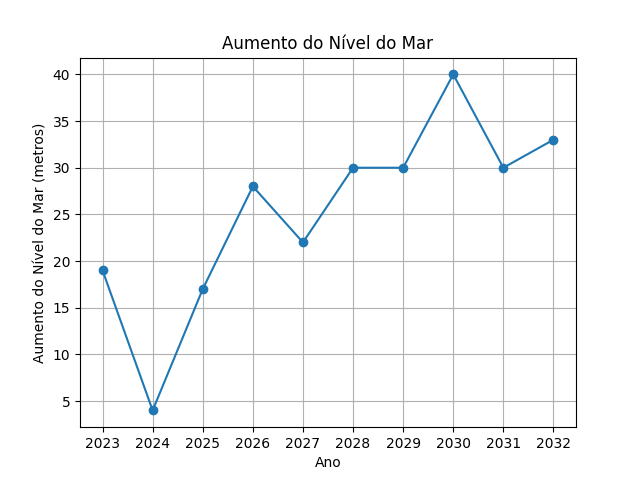
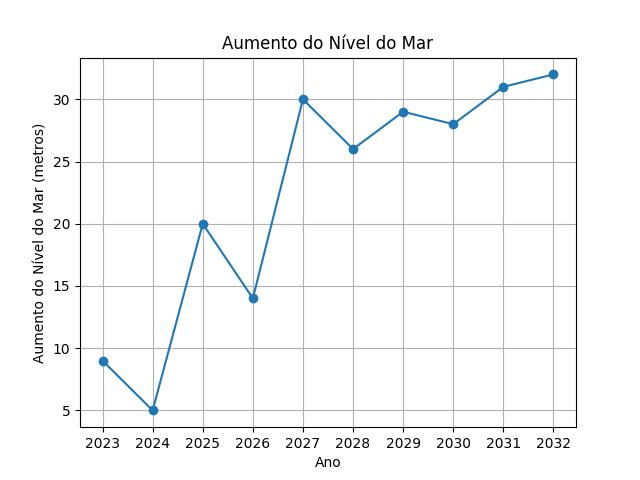
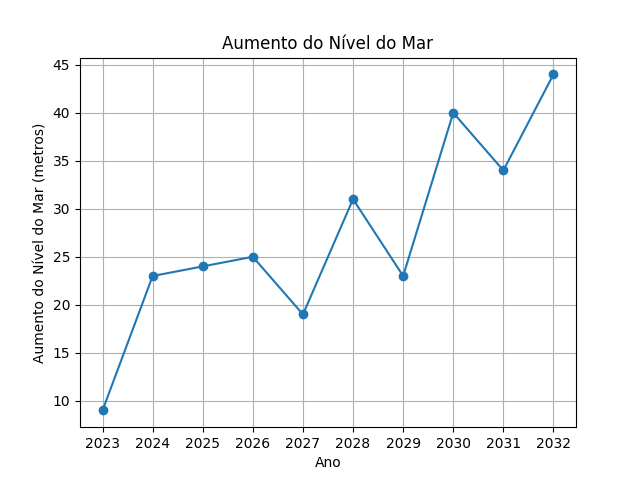

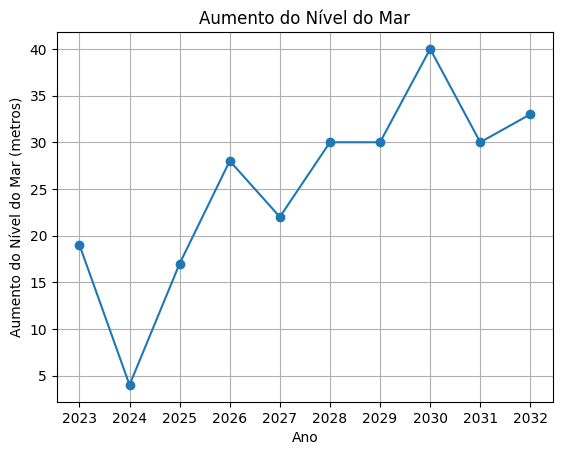

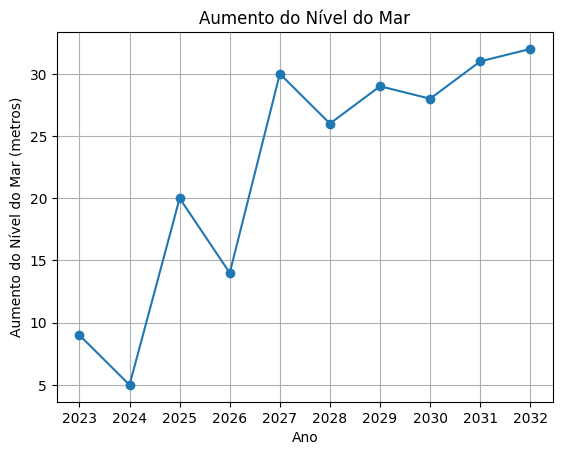

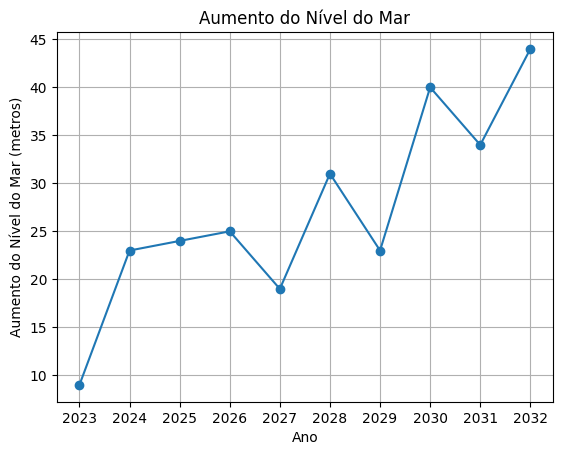

In [ ]:
import folium
import random
import pandas as pd
import base64
import xlsxwriter
from io import BytesIO
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

# Estilos CSS para o conteúdo do popup
styles = """
<style>
    .city-card {
        font-family: Arial, sans-serif;
        border: 1px solid #ddd;
        border-radius: 10px;
        overflow: hidden;
    }
    .city-card-header {
        background-color: #0077B6;
        color: white;
        padding: 8px 13px;
        font-size: 16px;
        font-weight: bold;
    }
    .city-card-content {
        padding: 15px;
    }
    .city-card-list {
        list-style-type: none;
        padding: 0;
        margin: 0;
    }
    .city-card-list li {
        margin-bottom: 5px;
    }
    .victims {
        color: red;
        font-weight: bold;
    }
</style>
"""

# Definições iniciais
colors = {
    "Baixo": "green",
    "Médio": "orange",
    "Alto": "red",
    "Eminente": "purple"
}

disasters = ["Tempestade", "Fissura no Gelo", "Deslizamento", "Avalanche de Neve"]
levels = ["Baixo", "Médio", "Alto", "Eminente"]
probabilities = {
    "Baixo": (10, 30),
    "Médio": (31, 60),
    "Alto": (61, 90),
    "Eminente": (91, 100)
}

icons = {
    "Tempestade": "cloud",
    "Fissura no Gelo": "tint",
    "Deslizamento": "arrow-down",
    "Avalanche de Neve": "mountain"
}

# Dados fictícios para gases causadores e impactos
gases_causadores = {
    "Tempestade": "Dióxido de enxofre (25%), Metano (45%)",
    "Fissura no Gelo": "Dióxido de carbono (70%), Óxido nitroso (10%)",
    "Deslizamento": "Metano (60%), Ozônio (10%)",
    "Avalanche de Neve": "Vapor d'água (60%), Dióxido de carbono (20%)"
}

impactos = {
    "Tempestade": "Alagamentos, Destruição de casas",
    "Fissura no Gelo": "Aumento do nível do mar, Perda de habitats",
    "Deslizamento": "Destruição de estradas, Interrupção de serviços",
    "Avalanche de Neve": "Mortes, Destruição de infraestrutura"
}

consequencias = {
    "Tempestade": "Deslocamento de populações, Perdas econômicas",
    "Fissura no Gelo": "Inundação de cidades costeiras, Perda de biodiversidade",
    "Deslizamento": "Isolamento de comunidades, Acidentes",
    "Avalanche de Neve": "Emergência humanitária, Perda de comunicações"
}

afetados = {
    "Tempestade": "Populações ribeirinhas, Agricultores",
    "Fissura no Gelo": "Comunidades costeiras, Animais polares",
    "Deslizamento": "Motoristas, Residentes locais",
    "Avalanche de Neve": "Montanhistas, Comunidades locais"
}

# Função para gerar o link do Excel em base64 com gráficos
def generate_excel_link(disaster):
    # Criar DataFrame com dados fictícios
    current_year = 2023
    years = [f"{current_year + i}" for i in range(10)]
    growth = [random.randint(0, 20) + i*3 for i in range(10)]

    # Primeiro, vamos adicionar os anos e crescimento
    data = {
        'Ano': years,
        'Crescimento': growth
    }

    # Em seguida, adicionar informações que são constantes
    data['Gases Causadores'] = [gases_causadores[disaster] if i == 0 else "" for i in range(10)]
    data['Impactos'] = [impactos[disaster] if i == 0 else "" for i in range(10)]
    data['Consequências'] = [consequencias[disaster] if i == 0 else "" for i in range(10)]
    data['Afetados'] = [afetados[disaster] if i == 0 else "" for i in range(10)]

    df = pd.DataFrame(data)

    # Criar arquivo Excel com gráficos
    output = BytesIO()
    writer = pd.ExcelWriter(output, engine='xlsxwriter')
    df.to_excel(writer, sheet_name=f'{disaster} - Crescimento', index=False)
    workbook = writer.book
    worksheet = writer.sheets[f'{disaster} - Crescimento']

    # Configurar gráfico de Crescimento ao longo dos anos
    chart = workbook.add_chart({'type': 'line'})
    chart.add_series({
        'values': [f'{disaster} - Crescimento', 1, 1, 10, 1],
        'name': [f'{disaster} - Crescimento', 0, 1],
        'categories': [f'{disaster} - Crescimento', 1, 0, 10, 0]
    })
    chart.set_title({'name': 'Crescimento ao longo dos anos'})
    chart.set_x_axis({'name': 'Ano'})
    chart.set_y_axis({'name': 'Crescimento'})
    worksheet.insert_chart('H2', chart)

    writer.save()
    excel_data = output.getvalue()

    # Codificar o arquivo Excel em base64 para criar um link de download direto
    excel_base64 = base64.b64encode(excel_data).decode('utf-8')
    href = f"data:application/vnd.openxmlformats-officedocument.spreadsheetml.sheet;base64,{excel_base64}"
    return href

# Criação do mapa principal
mapa = folium.Map(location=[-75, 0], zoom_start=3, tiles='Stamen Terrain')
heat_data = []

# Dados para as cidades afetadas pelas mudanças climáticas na Antártica
cities = {
    "Veneza, Itália": {
        "Coordenadas": [45.4408, 12.3155],
        "Impactos": [
            "Aumento frequente das inundações",
            "Danos a monumentos históricos",
            "Impacto no turismo",
            "Vítimas: População local e turistas",
        ],
        "Estimativa de Vítimas": 50000,  # Estimativa de 50.000 vítimas
    },
    "Holanda": {
        "Coordenadas": [52.3676, 4.9041],
        "Impactos": [
            "Inundações costeiras",
            "Perda de terras agrícolas",
            "Danos à infraestrutura urbana",
            "Impacto econômico",
        ],
        "Estimativa de Vítimas": 75000,  # Estimativa de 75.000 vítimas
    },
    "Miami, Estados Unidos": {
        "Coordenadas": [25.7617, -80.1918],
        "Impactos": [
            "Inundações costeiras frequentes",
            "Erosão da praia",
            "Impacto nas propriedades à beira-mar",
            "Ameaça a ecossistemas como os Everglades",
            "Perdas econômicas",
        ],
        "Estimativa de Vítimas": 100000,  # Estimativa de 100.000 vítimas
    },
    # Adicione mais cidades afetadas conforme necessário
}

# Adicionando cidades afetadas ao mapa
# Adicionando cidades afetadas ao mapa com gráfico de previsão
city_markers = folium.FeatureGroup(name="Cidades Afetadas")

for city, city_data in cities.items():
    coordinates = city_data["Coordenadas"]
    impacts = "<li>".join(city_data["Impactos"])
    estimated_victims = city_data["Estimativa de Vítimas"]

    # Utilize a função generate_sea_level_chart sem especificar um desastre
    chart_html = generate_sea_level_chart()

    message = f"""
    {styles}
    <div class="city-card">
        <div class="city-card-header">{city}</div>
        <div class="city-card-content">
            <ul class="city-card-list">
                <li>{impacts}</li>
            </ul>
            <p class="victims">Estimativa de Vítimas: {estimated_victims}</p>
            {chart_html}  <!-- Adiciona o gráfico no popup -->
        </div>
    </div>
    """

    folium.Marker(
        location=coordinates,
        popup=message,
        icon=folium.Icon(icon='exclamation-circle', color='darkblue', prefix='fa')
    ).add_to(city_markers)

# Adicione a camada de cidades afetadas ao mapa
city_markers.add_to(mapa)



# Função para gerar o gráfico de previsão do aumento do nível do mar
def generate_sea_level_chart(disaster):
    years = list(range(2023, 2033))
    growth = [random.randint(0, 20) + i * 3 for i in range(10)]

    fig, ax = plt.subplots()
    ax.plot(years, growth, marker='o', linestyle='-')

    # Configurações do gráfico
    ax.set_title(f'Previsão de Aumento do Nível do Mar para {disaster}')
    ax.set_xlabel('Ano')
    ax.set_ylabel('Aumento do Nível do Mar (metros)')
    ax.grid(True)

    # Força os rótulos do eixo x para serem inteiros
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))

    # Salvar o gráfico em um buffer
    buf = BytesIO()
    plt.savefig(buf, format='png')
    buf.seek(0)

    # Codificar a imagem em base64
    chart_base64 = base64.b64encode(buf.read()).decode('utf-8')

    # Cria o elemento HTML para incorporar a imagem no popup
    chart_html = f'<img src="data:image/png;base64,{chart_base64}" alt="{disaster} Sea Level Chart"/>'

    return chart_html







# Adicionando camadas de desastres
disaster_layers = {disaster: folium.FeatureGroup(name=disaster) for disaster in disasters}

for _ in range(20):
    coords = [-80 + random.uniform(-5, 5), random.uniform(-20, 20)]
    heat_data.append(coords)

    disaster = random.choice(disasters)
    level = random.choice(levels)
    min_probability, max_probability = probabilities[level]
    probability = random.randint(min_probability, max_probability)
    increase_chance = random.randint(1, 100)

    icon_color = colors[level]
    href = generate_excel_link(disaster)

    info = f"""
    <div style="width:250px;">
        <div class="card">
            <div class="card-header" style="background-color: {icon_color}; color: white;">
                <strong>{disaster}</strong>
            </div>
            <ul class="list-group list-group-flush">
                <li class="list-group-item">Nível de Gravidade: <strong>{level}</strong></li>
                <li class="list-group-item">Probabilidade de Ocorrência Atual: <strong>{probability}%</strong></li>
                <li class="list-group-item">Chance de Aumento no Futuro: <strong>{increase_chance}%</strong></li>
            </ul>
            <div class="card-footer">
                <a href="{href}" download="{disaster.replace(' ', '_')}.xlsx" class="btn btn-primary">Baixar Excel</a>
            </div>
        </div>
    </div>
    """

    marker = folium.Marker(
        location=coords,
        popup=folium.Popup(info, max_width=265),
        icon=folium.Icon(icon=icons[disaster], color=icon_color, prefix="fa")
    )

    # Adiciona o marcador ao grupo de camadas apropriado
    marker.add_to(disaster_layers[disaster])

# Adiciona cada grupo de camadas ao mapa
for disaster, layer in disaster_layers.items():
    layer.add_to(mapa)

# Adiciona a camada de Cidades Afetadas ao mapa
city_markers.add_to(mapa)

# Adicionando camada de calor para dados fictícios
heat_layer = folium.plugins.HeatMap(heat_data, name="Mapa de Calor")
heat_layer.add_to(mapa)

# Adicionando camada de calor para continentes
continental_heat_data = [
    [10, 20],  # África
    [45, 10],  # Europa
    [30, 70],  # Ásia
    [-10, -55],  # América do Sul
    [40, -100],  # América do Norte
    [-25, 135],  # Austrália
]

continental_heat_layer = folium.plugins.HeatMap(continental_heat_data, name="Calor Continental", radius=25, blur=10)
continental_heat_layer.add_to(mapa)

# Adicione mais dados de emissões para outros continentes
emissions_data = [
    {"location": [10, 20], "value": 50},  # África
    {"location": [45, 10], "value": 55},  # Europa
    {"location": [30, 70], "value": 60},  # Ásia
    {"location": [-10, -55], "value": 40},  # América do Sul
    {"location": [40, -100], "value": 70},  # América do Norte
    {"location": [-25, 135], "value": 30},  # Austrália
]
for data in emissions_data:
    folium.Circle(
        location=data["location"],
        radius=data["value"] * 1000,  # Ajuste o raio conforme necessário
        color='green',  # Cor das emissões
        fill=True,
        fill_color='green',
        fill_opacity=0.5,
    ).add_to(mapa)

# Dados de vento
wind_data = np.random.uniform(-180, 180, size=(100, 2))  # Direção do vento (-180 a 180 graus)
wind_speeds = np.random.uniform(0, 10, size=100)  # Velocidade do vento (0 a 10 unidades)



# Adicione vetores de vento personalizados como setas ao grupo de camadas de vento
for lat, lon in wind_data:
    direction = np.random.uniform(0, 360)  # Direção do vento em graus
    speed = np.random.uniform(0, 10)  # Velocidade do vento em unidades
    wind_arrow_icon = create_wind_arrow(lat, lon, direction, speed)

    # Crie um marcador com o ícone personalizado de seta e adicione-o ao grupo de camadas de vento
    marker = folium.Marker(
        location=[lat, lon],
        icon=wind_arrow_icon,
    )
    marker.add_to(wind_arrows_group)

# Adicione o grupo de camadas de vento ao mapa
wind_arrows_group.add_to(mapa)


# Função para gerar o gráfico de previsão do aumento do nível do mar
def generate_sea_level_chart():
    years = list(range(2023, 2033))
    growth = [random.randint(0, 20) + i * 3 for i in range(10)]

    fig, ax = plt.subplots()
    ax.plot(years, growth, marker='o', linestyle='-')

    # Configurações do gráfico
    ax.set_title('Aumento do Nível do Mar')
    ax.set_xlabel('Ano')
    ax.set_ylabel('Aumento do Nível do Mar (metros)')
    ax.grid(True)

    # Força os rótulos do eixo x para serem inteiros
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))

    # Salvar o gráfico em um buffer
    buf = BytesIO()
    plt.savefig(buf, format='png')
    buf.seek(0)

    # Codificar a imagem em base64
    chart_base64 = base64.b64encode(buf.read()).decode('utf-8')

    # Cria o elemento HTML para incorporar a imagem no popup
    chart_html = f'<img src="data:image/png;base64,{chart_base64}" alt="Aumento do Nível do Mar Chart"/>'

    return chart_html














# Adicionando controle de camadas ao mapa
folium.LayerControl().add_to(mapa)

# Salvando o mapa como arquivo HTML
mapa.save("antarctica_disasters_v5.html")

# Exibindo o mapa
mapa

In [ ]:
pip install folium-plugins


ERROR: Could not find a version that satisfies the requirement folium-plugins (from versions: none)
ERROR: No matching distribution found for folium-plugins


<ipython-input-265-78bfd2789431>:146: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-265-78bfd2789431>:146: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-265-78bfd2789431>:146: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-265-78bfd2789431>:146: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-265-78bfd2789431>:146: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()
<ipython-input-265-78bfd2789431>:146: FutureWarning: save is not part of the public API, usage can give u


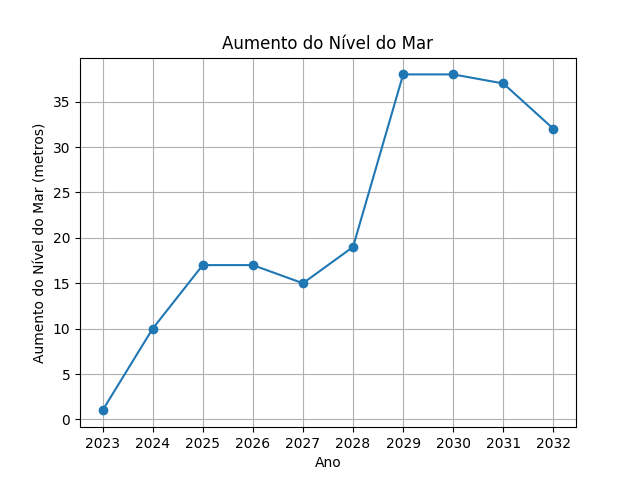
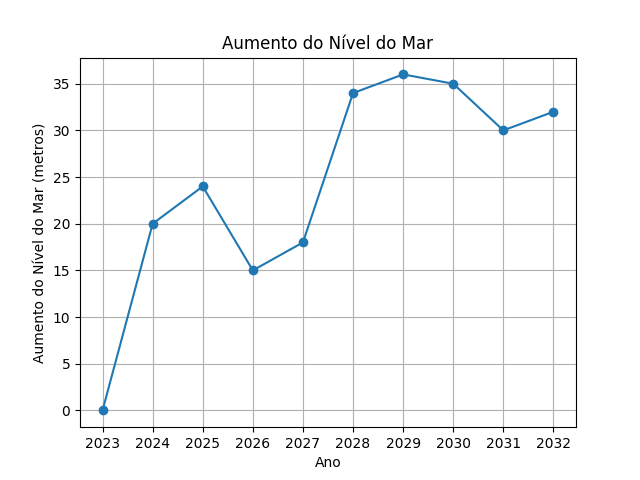
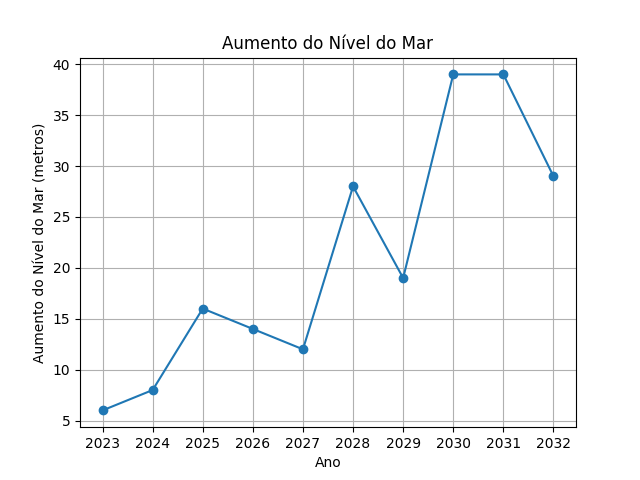
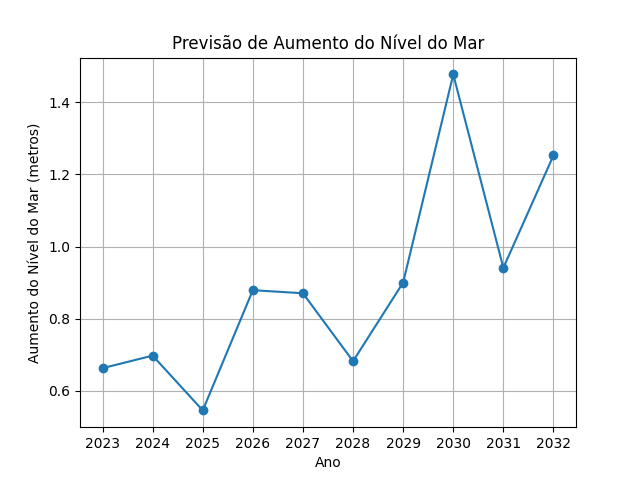
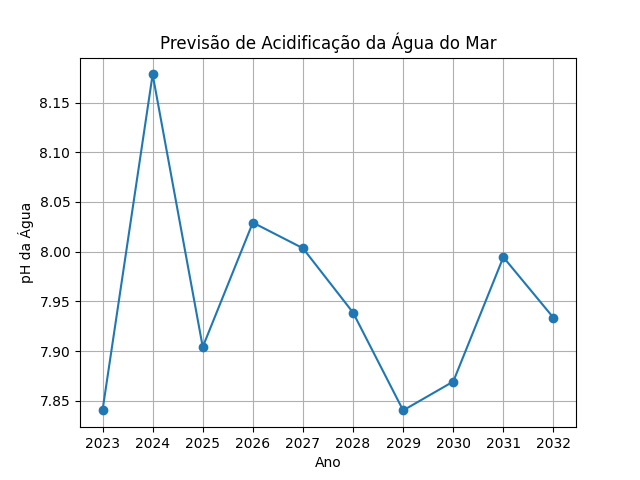

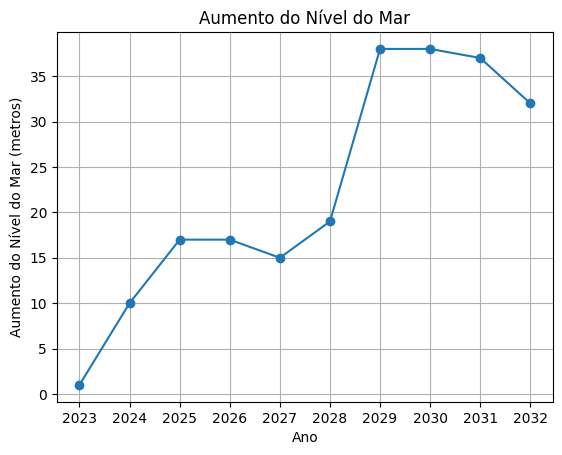

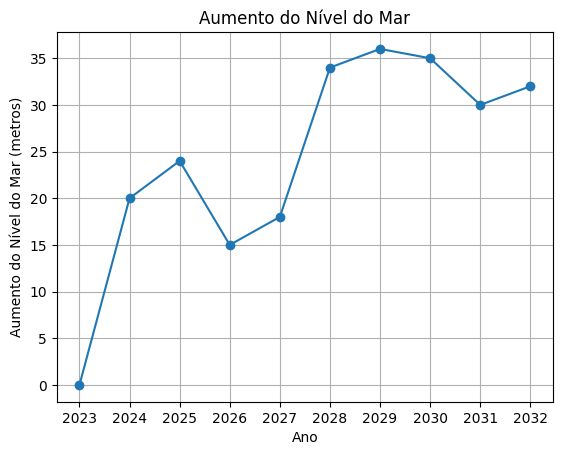

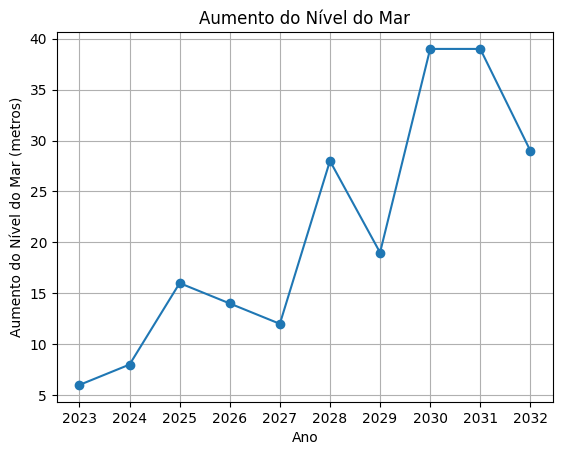

In [265]:
import folium
import random
import pandas as pd
import base64
import xlsxwriter
from io import BytesIO
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import folium
from folium.plugins import AntPath







# Estilos CSS para o conteúdo do popup
styles = """
<style>
    .city-card {
        font-family: Arial, sans-serif;
        border: 1px solid #ddd;
        border-radius: 10px;
        overflow: hidden;
    }
    .city-card-header {
        background-color: #0077B6;
        color: white;
        padding: 8px 13px;
        font-size: 16px;
        font-weight: bold;
    }
    .city-card-content {
        padding: 15px;
    }
    .city-card-list {
        list-style-type: none;
        padding: 0;
        margin: 0;
    }
    .city-card-list li {
        margin-bottom: 5px;
    }
    .victims {
        color: red;
        font-weight: bold;
    }
</style>
"""

# Definições iniciais
colors = {
    "Baixo": "green",
    "Médio": "orange",
    "Alto": "red",
    "Eminente": "purple"
}

disasters = ["Tempestade", "Fissura no Gelo", "Deslizamento", "Avalanche de Neve"]
levels = ["Baixo", "Médio", "Alto", "Eminente"]
probabilities = {
    "Baixo": (10, 30),
    "Médio": (31, 60),
    "Alto": (61, 90),
    "Eminente": (91, 100)
}

icons = {
    "Tempestade": "cloud",
    "Fissura no Gelo": "tint",
    "Deslizamento": "arrow-down",
    "Avalanche de Neve": "mountain"
}

# Dados fictícios para gases causadores e impactos
gases_causadores = {
    "Tempestade": "Dióxido de enxofre (25%), Metano (45%)",
    "Fissura no Gelo": "Dióxido de carbono (70%), Óxido nitroso (10%)",
    "Deslizamento": "Metano (60%), Ozônio (10%)",
    "Avalanche de Neve": "Vapor d'água (60%), Dióxido de carbono (20%)"
}

impactos = {
    "Tempestade": "Alagamentos, Destruição de casas",
    "Fissura no Gelo": "Aumento do nível do mar, Perda de habitats",
    "Deslizamento": "Destruição de estradas, Interrupção de serviços",
    "Avalanche de Neve": "Mortes, Destruição de infraestrutura"
}

consequencias = {
    "Tempestade": "Deslocamento de populações, Perdas econômicas",
    "Fissura no Gelo": "Inundação de cidades costeiras, Perda de biodiversidade",
    "Deslizamento": "Isolamento de comunidades, Acidentes",
    "Avalanche de Neve": "Emergência humanitária, Perda de comunicações"
}

afetados = {
    "Tempestade": "Populações ribeirinhas, Agricultores",
    "Fissura no Gelo": "Comunidades costeiras, Animais polares",
    "Deslizamento": "Motoristas, Residentes locais",
    "Avalanche de Neve": "Montanhistas, Comunidades locais"
}

# Função para gerar o link do Excel em base64 com gráficos
def generate_excel_link(disaster):
    # Criar DataFrame com dados fictícios
    current_year = 2023
    years = [f"{current_year + i}" for i in range(10)]
    growth = [random.randint(0, 20) + i*3 for i in range(10)]

    # Primeiro, vamos adicionar os anos e crescimento
    data = {
        'Ano': years,
        'Crescimento': growth
    }

    # Em seguida, adicionar informações que são constantes
    data['Gases Causadores'] = [gases_causadores[disaster] if i == 0 else "" for i in range(10)]
    data['Impactos'] = [impactos[disaster] if i == 0 else "" for i in range(10)]
    data['Consequências'] = [consequencias[disaster] if i == 0 else "" for i in range(10)]
    data['Afetados'] = [afetados[disaster] if i == 0 else "" for i in range(10)]

    df = pd.DataFrame(data)

    # Criar arquivo Excel com gráficos
    output = BytesIO()
    writer = pd.ExcelWriter(output, engine='xlsxwriter')
    df.to_excel(writer, sheet_name=f'{disaster} - Crescimento', index=False)
    workbook = writer.book
    worksheet = writer.sheets[f'{disaster} - Crescimento']

    # Configurar gráfico de Crescimento ao longo dos anos
    chart = workbook.add_chart({'type': 'line'})
    chart.add_series({
        'values': [f'{disaster} - Crescimento', 1, 1, 10, 1],
        'name': [f'{disaster} - Crescimento', 0, 1],
        'categories': [f'{disaster} - Crescimento', 1, 0, 10, 0]
    })
    chart.set_title({'name': 'Crescimento ao longo dos anos'})
    chart.set_x_axis({'name': 'Ano'})
    chart.set_y_axis({'name': 'Crescimento'})
    worksheet.insert_chart('H2', chart)

    writer.save()
    excel_data = output.getvalue()

    # Codificar o arquivo Excel em base64 para criar um link de download direto
    excel_base64 = base64.b64encode(excel_data).decode('utf-8')
    href = f"data:application/vnd.openxmlformats-officedocument.spreadsheetml.sheet;base64,{excel_base64}"
    return href

# Criação do mapa principal
mapa = folium.Map(location=[-75, 0], zoom_start=3, tiles='Stamen Terrain')
heat_data = []

# Dados para as cidades afetadas pelas mudanças climáticas na Antártica
cities = {
    "Veneza, Itália": {
        "Coordenadas": [45.4408, 12.3155],
        "Impactos": [
            "Aumento frequente das inundações",
            "Danos a monumentos históricos",
            "Impacto no turismo",
            "Vítimas: População local e turistas",
        ],
        "Estimativa de Vítimas": 50000,  # Estimativa de 50.000 vítimas
    },
    "Holanda": {
        "Coordenadas": [52.3676, 4.9041],
        "Impactos": [
            "Inundações costeiras",
            "Perda de terras agrícolas",
            "Danos à infraestrutura urbana",
            "Impacto econômico",
        ],
        "Estimativa de Vítimas": 75000,  # Estimativa de 75.000 vítimas
    },
    "Miami, Estados Unidos": {
        "Coordenadas": [25.7617, -80.1918],
        "Impactos": [
            "Inundações costeiras frequentes",
            "Erosão da praia",
            "Impacto nas propriedades à beira-mar",
            "Ameaça a ecossistemas como os Everglades",
            "Perdas econômicas",
        ],
        "Estimativa de Vítimas": 100000,  # Estimativa de 100.000 vítimas
    },
    # Adicione mais cidades afetadas conforme necessário
}

# Adicionando cidades afetadas ao mapa
# Adicionando cidades afetadas ao mapa com gráfico de previsão
city_markers = folium.FeatureGroup(name="Cidades Afetadas")

for city, city_data in cities.items():
    coordinates = city_data["Coordenadas"]
    impacts = "<li>".join(city_data["Impactos"])
    estimated_victims = city_data["Estimativa de Vítimas"]

    # Utilize a função generate_sea_level_chart sem especificar um desastre
    chart_html = generate_sea_level_chart()

    message = f"""
    {styles}
    <div class="city-card">
        <div class="city-card-header">{city}</div>
        <div class="city-card-content">
            <ul class="city-card-list">
                <li>{impacts}</li>
            </ul>
            <p class="victims">Estimativa de Vítimas: {estimated_victims}</p>
            {chart_html}  <!-- Adiciona o gráfico no popup -->
        </div>
    </div>
    """

    folium.Marker(
        location=coordinates,
        popup=message,
        icon=folium.Icon(icon='exclamation-circle', color='darkblue', prefix='fa')
    ).add_to(city_markers)

# Adicione a camada de cidades afetadas ao mapa
city_markers.add_to(mapa)



# Função para gerar o gráfico de previsão do aumento do nível do mar
def generate_sea_level_chart(disaster):
    years = list(range(2023, 2033))
    growth = [random.randint(0, 20) + i * 3 for i in range(10)]

    fig, ax = plt.subplots()
    ax.plot(years, growth, marker='o', linestyle='-')

    # Configurações do gráfico
    ax.set_title(f'Previsão de Aumento do Nível do Mar para {disaster}')
    ax.set_xlabel('Ano')
    ax.set_ylabel('Aumento do Nível do Mar (metros)')
    ax.grid(True)

    # Força os rótulos do eixo x para serem inteiros
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))

    # Salvar o gráfico em um buffer
    buf = BytesIO()
    plt.savefig(buf, format='png')
    buf.seek(0)

    # Codificar a imagem em base64
    chart_base64 = base64.b64encode(buf.read()).decode('utf-8')

    # Cria o elemento HTML para incorporar a imagem no popup
    chart_html = f'<img src="data:image/png;base64,{chart_base64}" alt="{disaster} Sea Level Chart"/>'

    return chart_html







# Adicionando camadas de desastres
disaster_layers = {disaster: folium.FeatureGroup(name=disaster) for disaster in disasters}

for _ in range(20):
    coords = [-80 + random.uniform(-5, 5), random.uniform(-20, 20)]
    heat_data.append(coords)

    disaster = random.choice(disasters)
    level = random.choice(levels)
    min_probability, max_probability = probabilities[level]
    probability = random.randint(min_probability, max_probability)
    increase_chance = random.randint(1, 100)

    icon_color = colors[level]
    href = generate_excel_link(disaster)

    info = f"""
    <div style="width:250px;">
        <div class="card">
            <div class="card-header" style="background-color: {icon_color}; color: white;">
                <strong>{disaster}</strong>
            </div>
            <ul class="list-group list-group-flush">
                <li class="list-group-item">Nível de Gravidade: <strong>{level}</strong></li>
                <li class="list-group-item">Probabilidade de Ocorrência Atual: <strong>{probability}%</strong></li>
                <li class="list-group-item">Chance de Aumento no Futuro: <strong>{increase_chance}%</strong></li>
            </ul>
            <div class="card-footer">
                <a href="{href}" download="{disaster.replace(' ', '_')}.xlsx" class="btn btn-primary">Baixar Excel</a>
            </div>
        </div>
    </div>
    """

    marker = folium.Marker(
        location=coords,
        popup=folium.Popup(info, max_width=265),
        icon=folium.Icon(icon=icons[disaster], color=icon_color, prefix="fa")
    )

    # Adiciona o marcador ao grupo de camadas apropriado
    marker.add_to(disaster_layers[disaster])

# Adiciona cada grupo de camadas ao mapa
for disaster, layer in disaster_layers.items():
    layer.add_to(mapa)

# Adiciona a camada de Cidades Afetadas ao mapa
city_markers.add_to(mapa)

# Adicionando camada de calor para dados fictícios
heat_layer = folium.plugins.HeatMap(heat_data, name="Mapa de Calor")
heat_layer.add_to(mapa)

# Adicionando camada de calor para continentes
continental_heat_data = [
    [10, 20],  # África
    [45, 10],  # Europa
    [30, 70],  # Ásia
    [-10, -55],  # América do Sul
    [40, -100],  # América do Norte
    [-25, 135],  # Austrália
]

continental_heat_layer = folium.plugins.HeatMap(continental_heat_data, name="Calor Continental", radius=25, blur=10)
continental_heat_layer.add_to(mapa)

# Adicione mais dados de emissões para outros continentes
emissions_data = [
    {"location": [10, 20], "value": 50},  # África
    {"location": [45, 10], "value": 55},  # Europa
    {"location": [30, 70], "value": 60},  # Ásia
    {"location": [-10, -55], "value": 40},  # América do Sul
    {"location": [40, -100], "value": 70},  # América do Norte
    {"location": [-25, 135], "value": 30},  # Austrália
]
for data in emissions_data:
    folium.Circle(
        location=data["location"],
        radius=data["value"] * 1000,  # Ajuste o raio conforme necessário
        color='green',  # Cor das emissões
        fill=True,
        fill_color='green',
        fill_opacity=0.5,
    ).add_to(mapa)

# Dados de vento
wind_data = np.random.uniform(-180, 180, size=(100, 2))  # Direção do vento (-180 a 180 graus)
wind_speeds = np.random.uniform(0, 10, size=100)  # Velocidade do vento (0 a 10 unidades)



# Adicione vetores de vento personalizados como setas ao grupo de camadas de vento
for lat, lon in wind_data:
    direction = np.random.uniform(0, 360)  # Direção do vento em graus
    speed = np.random.uniform(0, 10)  # Velocidade do vento em unidades
    wind_arrow_icon = create_wind_arrow(lat, lon, direction, speed)

    # Crie um marcador com o ícone personalizado de seta e adicione-o ao grupo de camadas de vento
    marker = folium.Marker(
        location=[lat, lon],
        icon=wind_arrow_icon,
    )
    marker.add_to(wind_arrows_group)

# Adicione o grupo de camadas de vento ao mapa
wind_arrows_group.add_to(mapa)


# Função para gerar o gráfico de previsão do aumento do nível do mar
def generate_sea_level_chart():
    years = list(range(2023, 2033))
    growth = [random.randint(0, 20) + i * 3 for i in range(10)]

    fig, ax = plt.subplots()
    ax.plot(years, growth, marker='o', linestyle='-')

    # Configurações do gráfico
    ax.set_title('Aumento do Nível do Mar')
    ax.set_xlabel('Ano')
    ax.set_ylabel('Aumento do Nível do Mar (metros)')
    ax.grid(True)

    # Força os rótulos do eixo x para serem inteiros
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))

    # Salvar o gráfico em um buffer
    buf = BytesIO()
    plt.savefig(buf, format='png')
    buf.seek(0)

    # Codificar a imagem em base64
    chart_base64 = base64.b64encode(buf.read()).decode('utf-8')

    # Cria o elemento HTML para incorporar a imagem no popup
    chart_html = f'<img src="data:image/png;base64,{chart_base64}" alt="Aumento do Nível do Mar Chart"/>'

    return chart_html


# Coordenadas de um ponto de derretimento na Antártica
antartica_point = [-75, 0]

# Coordenadas do Rio de Janeiro, Brasil
rio_de_janeiro = [-22.9068, -43.1729]

# Adicionando o marcador de desastre na Antártica com nível eminente de derretimento de geleiras
disaster_marker = folium.Marker(
    location=antartica_point,
    icon=folium.DivIcon(
        icon_size=(150, 36),
        html=f'<div style="background-color: purple; color: white; text-align: center; font-weight: bold;">Risco Eminente de Derretimento de Geleiras</div>'
    ),
    popup="Este é um ponto de derretimento eminente de geleiras na Antártica."
)
disaster_marker.add_to(mapa)

# Informações sobre o Rio de Janeiro e impactos
rio_info = f"""
<h3>Rio de Janeiro</h3>
<p>O Rio de Janeiro é uma cidade brasileira conhecida por suas belas praias, montanhas e cultura vibrante. No entanto, a cidade enfrenta desafios relacionados às mudanças climáticas, incluindo o aumento do nível do mar e a acidificação dos oceanos.</p>
<div id="tabs">
    <ul>
        <li><a href="#tab1">Nível do Mar</a></li>
        <li><a href="#tab2">Acidificação da Água</a></li>
        <li><a href="#tab3">Impactos</a></li>
    </ul>
    <div id="tab1">
        <img src="data:image/png;base64,{chart_nivel_mar}" alt="Nível do Mar"/>
    </div>
    <div id="tab2">
        <img src="data:image/png;base64,{chart_acidificacao_agua}" alt="Acidificação da Água"/>
    </div>
    <div id="tab3">
        <p><strong>Impactos Potenciais:</strong></p>
        <ul>
            <li>Alagamentos costeiros</li>
            <li>Erosão das praias</li>
            <li>Impacto nas propriedades à beira-mar</li>
            <li>Impacto na biodiversidade marinha</li>
        </ul>
        <p><strong>População Atingida Estimada:</strong> 100,000</p>
        <p><strong>Previsão de Acidificação das Praias:</strong> Moderada</p>
    </div>
</div>
"""

# Adicionando um marcador no Rio de Janeiro com estilo personalizado
rio_marker = folium.Marker(
    location=rio_de_janeiro,
    icon=folium.DivIcon(
        icon_size=(30, 30),
        icon_anchor=(15, 30),
        html='<div style="background-color: #3388ff; border-radius: 50%; width: 30px; height: 30px; display: flex; justify-content: center; align-items: center; color: white; font-weight: bold;">RJ</div>'
    ),
    popup=folium.Popup(
        rio_info,
        max_width=400
    )

)
rio_marker.add_to(mapa)

# Adicionando a seta do ponto de derretimento na Antártica ao Rio de Janeiro
ant_path = folium.plugins.AntPath(
    locations=[antartica_point, rio_de_janeiro],
    color='blue',  # Cor da seta
    pulse_color='red',  # Cor do pulso da seta
    delay=1000,  # Atraso em milissegundos
    dash_array=[10, 20],  # Padrão de traço (opcional)
)
ant_path.add_to(mapa)




# Adicionando controle de camadas ao mapa
folium.LayerControl().add_to(mapa)

# Salvando o mapa como arquivo HTML
mapa.save("antarctica_disasters_v5.html")

# Exibindo o mapa
mapa

In [ ]:
pip install folium matplotlib


In [264]:
# Crie o código HTML
html_code = """
<!DOCTYPE html>
<html>
<head>
    <title>Minha Interface</title>
</head>
<body>
    <h1>Minha Página HTML</h1>
    <p>Este é um exemplo de página HTML.</p>
</body>
</html>
"""

# Salve o código HTML em um arquivo .html
with open('minha_interface.html', 'w') as file:
    file.write(html_code)
